In [1]:
"""
    Make sure these libraries and jupyter notebook are installed on your system.
    See the requirements.txt file for a list of dependecies. You can install them with "pip install -r requirements.txt"
"""
import os
import fasttext.util
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from statistics import mean
from functions import (
get_categories,
average_vec,
diff_cal,
run_pca_tsne,
map_tsne,
map_tsne_one_group,
map_tsne_one_group_gen,
map_tsne_gen,
map_tsne_color_gen,
get_cos_sim,
average_weight,
gen_shift_error,
run_pca_tsne_perp,
save_results_as_csv
)

In [2]:
# Setting the model name, directory and path variables
model_dir = "models"
model_name = "cc.ru.300.bin"
model_path = os.path.join(model_dir, model_name)

# Checks if the directory for the model exists
os.makedirs(os.path.dirname(model_path), exist_ok=True)

# Download the pre-trained model for russian to the models directory if it doesn't exist yet
if not os.path.exists(model_path):
    os.chdir(model_dir)
    fasttext.util.download_model("ru", if_exists="ignore")

# Load model into fasttext memory
ft = fasttext.load_model(model_path)

In [3]:
# Defining the dataset path which is within the project directory
dataset_file_name = "russian_nouns.csv"
dataset_folder_name = "datasets"
dataset_path = os.path.join(dataset_folder_name, dataset_file_name)

"""
 Loading the dataset from the path specified above into a data frame.
 The first column in the csv is used as the index and the last row of the csv is skipped to avoid reading the sum of the column values.
"""
full_forms = pd.read_csv(dataset_path, sep=";", encoding="utf-8", index_col=0, skipfooter=1, engine='python')

In [4]:
# Creating a list of word forms
list_forms = ["nom_sg", "gen_sg", "dat_sg", "acc_sg", "inst_sg", "prep_sg", "nom_pl", "gen_pl", "dat_pl", "acc_pl", "inst_pl", "prep_pl"]

# Choosing big noun groups with 50+ members and creating a new dataframe with these groups
big_category_names = ["food", "action", "human"]
df_big_groups = full_forms.loc[:, ["food", "action", "human","nom_sg", "gen_sg", "dat_sg", "acc_sg", "inst_sg", "prep_sg", "nom_pl", "gen_pl", "dat_pl", "acc_pl", "inst_pl", "prep_pl", "gender"]]

# Finding nouns that belong to at least one of the big categories
df_big_groups = df_big_groups[df_big_groups[big_category_names].sum(axis=1) > 0]

# Changing full_forms to df_big_groups
df_with_only_group_col = df_big_groups.loc[:, big_category_names]
categories_list = df_with_only_group_col.columns.values.tolist()
row_names_list = df_big_groups.index.tolist()

# Data frames with words that belong to human, action and food groups
df_group_human = df_big_groups[df_big_groups.human == 1]
df_group_action = df_big_groups[df_big_groups.action == 1]
df_group_food = df_big_groups[df_big_groups.food == 1]

# Data frames with words that belong to feminine, masculine, neuter
df_feminine = df_big_groups[df_big_groups.gender == "f"]
df_masculine = df_big_groups[df_big_groups.gender == "m"]
df_neuter = df_big_groups[df_big_groups.gender == "n"]

# Data frames with feminine words that belong to human, action, food groups
df_group_human_fem = df_big_groups[(df_big_groups.human == 1) & (df_big_groups.gender == "f")]
df_group_action_fem = df_big_groups[(df_big_groups.action == 1) & (df_big_groups.gender == "f")]
df_group_food_fem = df_big_groups[(df_big_groups.food == 1) & (df_big_groups.gender == "f")]

# Data frames with masculine words that belong to human, action, food groups
df_group_human_mas = df_big_groups[(df_big_groups.human == 1) & (df_big_groups.gender == "m")]
df_group_action_mas = df_big_groups[(df_big_groups.action == 1) & (df_big_groups.gender == "m")]
df_group_food_mas = df_big_groups[(df_big_groups.food == 1) & (df_big_groups.gender == "m")]

# Data frames with neuter words that belong to action, food groups
# The human group has no neuter words
df_group_action_neut = df_big_groups[(df_big_groups.action == 1) & (df_big_groups.gender == "n")]
df_group_food_neut = df_big_groups[(df_big_groups.food == 1) & (df_big_groups.gender == "n")]

In [5]:
# Getting group categories
categories, category_labels = get_categories(df_big_groups)

In [6]:
# Calculating the difference between the word forms vectors and the average vectors in average_vector_array
# Shift vector for case - base
# Big groups
# Singular
# CHANGE NP SUBSTRACT TO DIFF CAL
diff_nom_sg = diff_cal(df_big_groups["nom_sg"], average_vec(df_big_groups, ft), ft)
diff_gen_sg =  diff_cal (df_big_groups['gen_sg'], average_vec(df_big_groups, ft), ft)
diff_dat_sg = diff_cal(df_big_groups['dat_sg'], average_vec(df_big_groups, ft), ft)
diff_acc_sg = diff_cal(df_big_groups['acc_sg'], average_vec(df_big_groups, ft), ft)
diff_inst_sg = diff_cal(df_big_groups['inst_sg'], average_vec(df_big_groups, ft), ft)
diff_prep_sg = diff_cal(df_big_groups['prep_sg'], average_vec(df_big_groups, ft), ft)

# Plural
diff_nom_pl = diff_cal(df_big_groups["nom_pl"], average_vec(df_big_groups, ft), ft)
diff_gen_pl = diff_cal(df_big_groups['gen_pl'], average_vec(df_big_groups, ft), ft)
diff_dat_pl = diff_cal(df_big_groups['dat_pl'], average_vec(df_big_groups, ft), ft)
diff_acc_pl = diff_cal(df_big_groups['acc_pl'], average_vec(df_big_groups, ft), ft)
diff_inst_pl = diff_cal(df_big_groups['inst_pl'], average_vec(df_big_groups, ft), ft)
diff_prep_pl = diff_cal(df_big_groups['prep_pl'], average_vec(df_big_groups, ft), ft)

In [7]:
# Calculating the difference between the word forms vectors and the average vectors
# Gender division, feminine
# Singular
diff_nom_sg_fem = diff_cal(df_feminine["nom_sg"], average_vec(df_feminine, ft), ft)
diff_gen_sg_fem = diff_cal(df_feminine["gen_sg"], average_vec(df_feminine, ft), ft)
diff_dat_sg_fem = diff_cal(df_feminine["dat_sg"], average_vec(df_feminine, ft), ft)
diff_acc_sg_fem = diff_cal(df_feminine["acc_sg"], average_vec(df_feminine, ft), ft)
diff_inst_sg_fem = diff_cal(df_feminine["inst_sg"], average_vec(df_feminine, ft), ft)
diff_prep_sg_fem = diff_cal(df_feminine["prep_sg"], average_vec(df_feminine, ft), ft)

# Plural
diff_nom_pl_fem = diff_cal(df_feminine["nom_pl"], average_vec(df_feminine, ft), ft)
diff_gen_pl_fem = diff_cal(df_feminine["gen_pl"], average_vec(df_feminine, ft), ft)
diff_dat_pl_fem = diff_cal(df_feminine["dat_pl"], average_vec(df_feminine, ft), ft)
diff_acc_pl_fem = diff_cal(df_feminine["acc_pl"], average_vec(df_feminine, ft), ft)
diff_inst_pl_fem = diff_cal(df_feminine["inst_pl"], average_vec(df_feminine, ft), ft)
diff_prep_pl_fem = diff_cal(df_feminine["prep_pl"], average_vec(df_feminine, ft), ft)

In [8]:
# Calculating the difference between the word forms vectors and the average vectors
# Gender division, masculine
# Singular
diff_nom_sg_mas = diff_cal(df_masculine["nom_sg"], average_vec(df_masculine, ft), ft)
diff_gen_sg_mas = diff_cal(df_masculine["gen_sg"], average_vec(df_masculine, ft), ft)
diff_dat_sg_mas = diff_cal(df_masculine["dat_sg"], average_vec(df_masculine, ft), ft)
diff_acc_sg_mas = diff_cal(df_masculine["acc_sg"], average_vec(df_masculine, ft), ft)
diff_inst_sg_mas = diff_cal(df_masculine["inst_sg"], average_vec(df_masculine, ft), ft)
diff_prep_sg_mas = diff_cal(df_masculine["prep_sg"], average_vec(df_masculine, ft), ft)

# Plural
diff_nom_pl_mas = diff_cal(df_masculine["nom_pl"], average_vec(df_masculine, ft), ft)
diff_gen_pl_mas = diff_cal(df_masculine["gen_pl"], average_vec(df_masculine, ft), ft)
diff_dat_pl_mas = diff_cal(df_masculine["dat_pl"], average_vec(df_masculine, ft), ft)
diff_acc_pl_mas = diff_cal(df_masculine["acc_pl"], average_vec(df_masculine, ft), ft)
diff_inst_pl_mas = diff_cal(df_masculine["inst_pl"], average_vec(df_masculine, ft), ft)
diff_prep_pl_mas = diff_cal(df_masculine["prep_pl"], average_vec(df_masculine, ft), ft)

In [9]:
# Calculating the difference between the word forms vectors and the average vectors
# Gender division, neuter
# Singular
diff_nom_sg_neut = diff_cal(df_neuter["nom_sg"], average_vec(df_neuter, ft), ft)
diff_gen_sg_neut = diff_cal(df_neuter["gen_sg"], average_vec(df_neuter, ft), ft)
diff_dat_sg_neut = diff_cal(df_neuter["dat_sg"], average_vec(df_neuter, ft), ft)
diff_acc_sg_neut = diff_cal(df_neuter["acc_sg"], average_vec(df_neuter, ft), ft)
diff_inst_sg_neut = diff_cal(df_neuter["inst_sg"], average_vec(df_neuter, ft), ft)
diff_prep_sg_neut = diff_cal(df_neuter["prep_sg"], average_vec(df_neuter, ft), ft)

# Plural
diff_nom_pl_neut = diff_cal(df_neuter["nom_pl"], average_vec(df_neuter, ft), ft)
diff_gen_pl_neut = diff_cal(df_neuter["gen_pl"], average_vec(df_neuter, ft), ft)
diff_dat_pl_neut = diff_cal(df_neuter["dat_pl"], average_vec(df_neuter, ft), ft)
diff_acc_pl_neut = diff_cal(df_neuter["acc_pl"], average_vec(df_neuter, ft), ft)
diff_inst_pl_neut = diff_cal(df_neuter["inst_pl"], average_vec(df_neuter, ft), ft)
diff_prep_pl_neut = diff_cal(df_neuter["prep_pl"], average_vec(df_neuter, ft), ft)

In [10]:
# Calculating the difference between the word forms vectors and the average vectors
# Group and gender division
# Human, feminine
# Singular
diff_nom_sg_human_fem = diff_cal(df_group_human_fem["nom_sg"], average_vec(df_group_human_fem, ft), ft)
diff_gen_sg_human_fem = diff_cal(df_group_human_fem["gen_sg"], average_vec(df_group_human_fem, ft), ft)
diff_dat_sg_human_fem = diff_cal(df_group_human_fem["dat_sg"], average_vec(df_group_human_fem, ft), ft)
diff_acc_sg_human_fem = diff_cal(df_group_human_fem["acc_sg"], average_vec(df_group_human_fem, ft), ft)
diff_inst_sg_human_fem = diff_cal(df_group_human_fem["inst_sg"], average_vec(df_group_human_fem, ft), ft)
diff_prep_sg_human_fem = diff_cal(df_group_human_fem["prep_sg"], average_vec(df_group_human_fem, ft), ft)

# Plural
diff_nom_pl_human_fem = diff_cal(df_group_human_fem["nom_pl"], average_vec(df_group_human_fem, ft), ft)
diff_gen_pl_human_fem = diff_cal(df_group_human_fem["gen_pl"], average_vec(df_group_human_fem, ft), ft)
diff_dat_pl_human_fem = diff_cal(df_group_human_fem["dat_pl"], average_vec(df_group_human_fem, ft), ft)
diff_acc_pl_human_fem = diff_cal(df_group_human_fem["acc_pl"], average_vec(df_group_human_fem, ft), ft)
diff_inst_pl_human_fem = diff_cal(df_group_human_fem["inst_pl"], average_vec(df_group_human_fem, ft), ft)
diff_prep_pl_human_fem = diff_cal(df_group_human_fem["prep_pl"], average_vec(df_group_human_fem, ft), ft)

# Human, masculine
# Singular
diff_nom_sg_human_mas = diff_cal(df_group_human_mas["nom_sg"], average_vec(df_group_human_mas, ft), ft)
diff_gen_sg_human_mas = diff_cal(df_group_human_mas["gen_sg"], average_vec(df_group_human_mas, ft), ft)
diff_dat_sg_human_mas = diff_cal(df_group_human_mas["dat_sg"], average_vec(df_group_human_mas, ft), ft)
diff_acc_sg_human_mas = diff_cal(df_group_human_mas["acc_sg"], average_vec(df_group_human_mas, ft), ft)
diff_inst_sg_human_mas = diff_cal(df_group_human_mas["inst_sg"], average_vec(df_group_human_mas, ft), ft)
diff_prep_sg_human_mas = diff_cal(df_group_human_mas["prep_sg"], average_vec(df_group_human_mas, ft), ft)

# Plural
diff_nom_pl_human_mas = diff_cal(df_group_human_mas["nom_pl"], average_vec(df_group_human_mas, ft), ft)
diff_gen_pl_human_mas = diff_cal(df_group_human_mas["gen_pl"], average_vec(df_group_human_mas, ft), ft)
diff_dat_pl_human_mas = diff_cal(df_group_human_mas["dat_pl"], average_vec(df_group_human_mas, ft), ft)
diff_acc_pl_human_mas = diff_cal(df_group_human_mas["acc_pl"], average_vec(df_group_human_mas, ft), ft)
diff_inst_pl_human_mas = diff_cal(df_group_human_mas["inst_pl"], average_vec(df_group_human_mas, ft), ft)
diff_prep_pl_human_mas = diff_cal(df_group_human_mas["prep_pl"], average_vec(df_group_human_mas, ft), ft)

In [11]:
# Calculating the difference between the word forms vectors and the average vectors
# Group and gender division
# Action, feminine
# Singular
diff_nom_sg_action_fem = diff_cal(df_group_action_fem["nom_sg"], average_vec(df_group_action_fem, ft), ft)
diff_gen_sg_action_fem = diff_cal(df_group_action_fem["gen_sg"], average_vec(df_group_action_fem, ft), ft)
diff_dat_sg_action_fem = diff_cal(df_group_action_fem["dat_sg"], average_vec(df_group_action_fem, ft), ft)
diff_acc_sg_action_fem = diff_cal(df_group_action_fem["acc_sg"], average_vec(df_group_action_fem, ft), ft)
diff_inst_sg_action_fem = diff_cal(df_group_action_fem["inst_sg"], average_vec(df_group_action_fem, ft), ft)
diff_prep_sg_action_fem = diff_cal(df_group_action_fem["prep_sg"], average_vec(df_group_action_fem, ft), ft)

# Plural
diff_nom_pl_action_fem = diff_cal(df_group_action_fem["nom_pl"], average_vec(df_group_action_fem, ft), ft)
diff_gen_pl_action_fem = diff_cal(df_group_action_fem["gen_pl"], average_vec(df_group_action_fem, ft), ft)
diff_dat_pl_action_fem = diff_cal(df_group_action_fem["dat_pl"], average_vec(df_group_action_fem, ft), ft)
diff_acc_pl_action_fem = diff_cal(df_group_action_fem["acc_pl"], average_vec(df_group_action_fem, ft), ft)
diff_inst_pl_action_fem = diff_cal(df_group_action_fem["inst_pl"], average_vec(df_group_action_fem, ft), ft)
diff_prep_pl_action_fem = diff_cal(df_group_action_fem["prep_pl"], average_vec(df_group_action_fem, ft), ft)

# Action, masculine
# Singular
diff_nom_sg_action_mas = diff_cal(df_group_action_mas["nom_sg"], average_vec(df_group_action_mas, ft), ft)
diff_gen_sg_action_mas = diff_cal(df_group_action_mas["gen_sg"], average_vec(df_group_action_mas, ft), ft)
diff_dat_sg_action_mas = diff_cal(df_group_action_mas["dat_sg"], average_vec(df_group_action_mas, ft), ft)
diff_acc_sg_action_mas = diff_cal(df_group_action_mas["acc_sg"], average_vec(df_group_action_mas, ft), ft)
diff_inst_sg_action_mas = diff_cal(df_group_action_mas["inst_sg"], average_vec(df_group_action_mas, ft), ft)
diff_prep_sg_action_mas = diff_cal(df_group_action_mas["prep_sg"], average_vec(df_group_action_mas, ft), ft)

# Plural
diff_nom_pl_action_mas = diff_cal(df_group_action_mas["nom_pl"], average_vec(df_group_action_mas, ft), ft)
diff_gen_pl_action_mas = diff_cal(df_group_action_mas["gen_pl"], average_vec(df_group_action_mas, ft), ft)
diff_dat_pl_action_mas = diff_cal(df_group_action_mas["dat_pl"], average_vec(df_group_action_mas, ft), ft)
diff_acc_pl_action_mas = diff_cal(df_group_action_mas["acc_pl"], average_vec(df_group_action_mas, ft), ft)
diff_inst_pl_action_mas = diff_cal(df_group_action_mas["inst_pl"], average_vec(df_group_action_mas, ft), ft)
diff_prep_pl_action_mas = diff_cal(df_group_action_mas["prep_pl"], average_vec(df_group_action_mas, ft), ft)

# Action, neuter
# Singular
diff_nom_sg_action_neut = diff_cal(df_group_action_neut["nom_sg"], average_vec(df_group_action_neut, ft), ft)
diff_gen_sg_action_neut = diff_cal(df_group_action_neut["gen_sg"], average_vec(df_group_action_neut, ft), ft)
diff_dat_sg_action_neut = diff_cal(df_group_action_neut["dat_sg"], average_vec(df_group_action_neut, ft), ft)
diff_acc_sg_action_neut = diff_cal(df_group_action_neut["acc_sg"], average_vec(df_group_action_neut, ft), ft)
diff_inst_sg_action_neut = diff_cal(df_group_action_neut["inst_sg"], average_vec(df_group_action_neut, ft), ft)
diff_prep_sg_action_neut = diff_cal(df_group_action_neut["prep_sg"], average_vec(df_group_action_neut, ft), ft)

# Plural
diff_nom_pl_action_neut = diff_cal(df_group_action_neut["nom_pl"], average_vec(df_group_action_neut, ft), ft)
diff_gen_pl_action_neut = diff_cal(df_group_action_neut["gen_pl"], average_vec(df_group_action_neut, ft), ft)
diff_dat_pl_action_neut = diff_cal(df_group_action_neut["dat_pl"], average_vec(df_group_action_neut, ft), ft)
diff_acc_pl_action_neut = diff_cal(df_group_action_neut["acc_pl"], average_vec(df_group_action_neut, ft), ft)
diff_inst_pl_action_neut = diff_cal(df_group_action_neut["inst_pl"], average_vec(df_group_action_neut, ft), ft)
diff_prep_pl_action_neut = diff_cal(df_group_action_neut["prep_pl"], average_vec(df_group_action_neut, ft), ft)

In [12]:
# Calculating the difference between the word forms vectors and the average vectors
# Group and gender division
# Food, feminine
# Singular
diff_nom_sg_food_fem = diff_cal(df_group_food_fem["nom_sg"], average_vec(df_group_food_fem, ft), ft)
diff_gen_sg_food_fem = diff_cal(df_group_food_fem["gen_sg"], average_vec(df_group_food_fem, ft), ft)
diff_dat_sg_food_fem = diff_cal(df_group_food_fem["dat_sg"], average_vec(df_group_food_fem, ft), ft)
diff_acc_sg_food_fem = diff_cal(df_group_food_fem["acc_sg"], average_vec(df_group_food_fem, ft), ft)
diff_inst_sg_food_fem = diff_cal(df_group_food_fem["inst_sg"], average_vec(df_group_food_fem, ft), ft)
diff_prep_sg_food_fem = diff_cal(df_group_food_fem["prep_sg"], average_vec(df_group_food_fem, ft), ft)

# Plural
diff_nom_pl_food_fem = diff_cal(df_group_food_fem["nom_pl"], average_vec(df_group_food_fem, ft), ft)
diff_gen_pl_food_fem = diff_cal(df_group_food_fem["gen_pl"], average_vec(df_group_food_fem, ft), ft)
diff_dat_pl_food_fem = diff_cal(df_group_food_fem["dat_pl"], average_vec(df_group_food_fem, ft), ft)
diff_acc_pl_food_fem = diff_cal(df_group_food_fem["acc_pl"], average_vec(df_group_food_fem, ft), ft)
diff_inst_pl_food_fem = diff_cal(df_group_food_fem["inst_pl"], average_vec(df_group_food_fem, ft), ft)
diff_prep_pl_food_fem = diff_cal(df_group_food_fem["prep_pl"], average_vec(df_group_food_fem, ft), ft)

# Food, masculine
# Singular
diff_nom_sg_food_mas = diff_cal(df_group_food_mas["nom_sg"], average_vec(df_group_food_mas, ft), ft)
diff_gen_sg_food_mas = diff_cal(df_group_food_mas["gen_sg"], average_vec(df_group_food_mas, ft), ft)
diff_dat_sg_food_mas = diff_cal(df_group_food_mas["dat_sg"], average_vec(df_group_food_mas, ft), ft)
diff_acc_sg_food_mas = diff_cal(df_group_food_mas["acc_sg"], average_vec(df_group_food_mas, ft), ft)
diff_inst_sg_food_mas = diff_cal(df_group_food_mas["inst_sg"], average_vec(df_group_food_mas, ft), ft)
diff_prep_sg_food_mas = diff_cal(df_group_food_mas["prep_sg"], average_vec(df_group_food_mas, ft), ft)

# Plural
diff_nom_pl_food_mas = diff_cal(df_group_food_mas["nom_pl"], average_vec(df_group_food_mas, ft), ft)
diff_gen_pl_food_mas = diff_cal(df_group_food_mas["gen_pl"], average_vec(df_group_food_mas, ft), ft)
diff_dat_pl_food_mas = diff_cal(df_group_food_mas["dat_pl"], average_vec(df_group_food_mas, ft), ft)
diff_acc_pl_food_mas = diff_cal(df_group_food_mas["acc_pl"], average_vec(df_group_food_mas, ft), ft)
diff_inst_pl_food_mas = diff_cal(df_group_food_mas["inst_pl"], average_vec(df_group_food_mas, ft), ft)
diff_prep_pl_food_mas = diff_cal(df_group_food_mas["prep_pl"], average_vec(df_group_food_mas, ft), ft)

# Food, neuter
# Singular
diff_nom_sg_food_neut = diff_cal(df_group_food_neut["nom_sg"], average_vec(df_group_food_neut, ft), ft)
diff_gen_sg_food_neut = diff_cal(df_group_food_neut["gen_sg"], average_vec(df_group_food_neut, ft), ft)
diff_dat_sg_food_neut = diff_cal(df_group_food_neut["dat_sg"], average_vec(df_group_food_neut, ft), ft)
diff_acc_sg_food_neut = diff_cal(df_group_food_neut["acc_sg"], average_vec(df_group_food_neut, ft), ft)
diff_inst_sg_food_neut = diff_cal(df_group_food_neut["inst_sg"], average_vec(df_group_food_neut, ft), ft)
diff_prep_sg_food_neut = diff_cal(df_group_food_neut["prep_sg"], average_vec(df_group_food_neut, ft), ft)

# Plural
diff_nom_pl_food_neut = diff_cal(df_group_food_neut["nom_pl"], average_vec(df_group_food_neut, ft), ft)
diff_gen_pl_food_neut = diff_cal(df_group_food_neut["gen_pl"], average_vec(df_group_food_neut, ft), ft)
diff_dat_pl_food_neut = diff_cal(df_group_food_neut["dat_pl"], average_vec(df_group_food_neut, ft), ft)
diff_acc_pl_food_neut = diff_cal(df_group_food_neut["acc_pl"], average_vec(df_group_food_neut, ft), ft)
diff_inst_pl_food_neut = diff_cal(df_group_food_neut["inst_pl"], average_vec(df_group_food_neut, ft), ft)
diff_prep_pl_food_neut = diff_cal(df_group_food_neut["prep_pl"], average_vec(df_group_food_neut, ft), ft)

In [13]:
# Calculating the average shift vector for all words of one of the word forms
# Feminine, all lemmas
# Singular forms
average_diff_nom_sg_fem = np.mean(diff_nom_sg_fem, axis=0)
average_diff_gen_sg_fem = np.mean(diff_gen_sg_fem, axis = 0)
average_diff_dat_sg_fem = np.mean(diff_dat_sg_fem, axis = 0)
average_diff_acc_sg_fem = np.mean(diff_acc_sg_fem, axis = 0)
average_diff_inst_sg_fem = np.mean(diff_inst_sg_fem, axis = 0)
average_diff_prep_sg_fem = np.mean(diff_prep_sg_fem, axis = 0)

# Plural forms
average_diff_nom_pl_fem = np.mean(diff_nom_pl_fem, axis=0)
average_diff_gen_pl_fem = np.mean(diff_gen_pl_fem, axis = 0)
average_diff_dat_pl_fem = np.mean(diff_dat_pl_fem, axis = 0)
average_diff_acc_pl_fem = np.mean(diff_acc_pl_fem, axis = 0)
average_diff_inst_pl_fem = np.mean(diff_inst_pl_fem, axis = 0)
average_diff_prep_pl_fem = np.mean(diff_prep_pl_fem, axis = 0)

# masculine, all lemmas
# Singular forms
average_diff_nom_sg_mas = np.mean(diff_nom_sg_mas, axis=0)
average_diff_gen_sg_mas = np.mean(diff_gen_sg_mas, axis = 0)
average_diff_dat_sg_mas = np.mean(diff_dat_sg_mas, axis = 0)
average_diff_acc_sg_mas = np.mean(diff_acc_sg_mas, axis = 0)
average_diff_inst_sg_mas = np.mean(diff_inst_sg_mas, axis = 0)
average_diff_prep_sg_mas = np.mean(diff_prep_sg_mas, axis = 0)

# Plural forms
average_diff_nom_pl_mas = np.mean(diff_nom_pl_mas, axis=0)
average_diff_gen_pl_mas = np.mean(diff_gen_pl_mas, axis = 0)
average_diff_dat_pl_mas = np.mean(diff_dat_pl_mas, axis = 0)
average_diff_acc_pl_mas = np.mean(diff_acc_pl_mas, axis = 0)
average_diff_inst_pl_mas = np.mean(diff_inst_pl_mas, axis = 0)
average_diff_prep_pl_mas = np.mean(diff_prep_pl_mas, axis = 0)

# Neuter, all lemmas
# Singular forms
average_diff_nom_sg_neut = np.mean(diff_nom_sg_neut, axis=0)
average_diff_gen_sg_neut = np.mean(diff_gen_sg_neut, axis = 0)
average_diff_dat_sg_neut = np.mean(diff_dat_sg_neut, axis = 0)
average_diff_acc_sg_neut = np.mean(diff_acc_sg_neut, axis = 0)
average_diff_inst_sg_neut = np.mean(diff_inst_sg_neut, axis = 0)
average_diff_prep_sg_neut = np.mean(diff_prep_sg_neut, axis = 0)

# Plural forms
average_diff_nom_pl_neut = np.mean(diff_nom_pl_neut, axis=0)
average_diff_gen_pl_neut = np.mean(diff_gen_pl_neut, axis = 0)
average_diff_dat_pl_neut = np.mean(diff_dat_pl_neut, axis = 0)
average_diff_acc_pl_neut = np.mean(diff_acc_pl_neut, axis = 0)
average_diff_inst_pl_neut = np.mean(diff_inst_pl_neut, axis = 0)
average_diff_prep_pl_neut = np.mean(diff_prep_pl_neut, axis = 0)

In [14]:
# Calculating the average shift vector for all words of one of the word forms
# Feminine,group human
# Singular forms
average_diff_nom_sg_human_fem = np.mean(diff_nom_sg_human_fem, axis=0)
average_diff_gen_sg_human_fem = np.mean(diff_gen_sg_human_fem, axis = 0)
average_diff_dat_sg_human_fem = np.mean(diff_dat_sg_human_fem, axis = 0)
average_diff_acc_sg_human_fem = np.mean(diff_acc_sg_human_fem, axis = 0)
average_diff_inst_sg_human_fem = np.mean(diff_inst_sg_human_fem, axis = 0)
average_diff_prep_sg_human_fem = np.mean(diff_prep_sg_human_fem, axis = 0)

# Plural forms
average_diff_nom_pl_human_fem = np.mean(diff_nom_pl_human_fem, axis=0)
average_diff_gen_pl_human_fem = np.mean(diff_gen_pl_human_fem, axis = 0)
average_diff_dat_pl_human_fem = np.mean(diff_dat_pl_human_fem, axis = 0)
average_diff_acc_pl_human_fem = np.mean(diff_acc_pl_human_fem, axis = 0)
average_diff_inst_pl_human_fem = np.mean(diff_inst_pl_human_fem, axis = 0)
average_diff_prep_pl_human_fem = np.mean(diff_prep_pl_human_fem, axis = 0)

# masculine, group human
# Singular forms
average_diff_nom_sg_human_mas = np.mean(diff_nom_sg_human_mas, axis=0)
average_diff_gen_sg_human_mas = np.mean(diff_gen_sg_human_mas, axis = 0)
average_diff_dat_sg_human_mas = np.mean(diff_dat_sg_human_mas, axis = 0)
average_diff_acc_sg_human_mas = np.mean(diff_acc_sg_human_mas, axis = 0)
average_diff_inst_sg_human_mas = np.mean(diff_inst_sg_human_mas, axis = 0)
average_diff_prep_sg_human_mas = np.mean(diff_prep_sg_human_mas, axis = 0)

# Plural forms
average_diff_nom_pl_human_mas = np.mean(diff_nom_pl_human_mas, axis=0)
average_diff_gen_pl_human_mas = np.mean(diff_gen_pl_human_mas, axis = 0)
average_diff_dat_pl_human_mas = np.mean(diff_dat_pl_human_mas, axis = 0)
average_diff_acc_pl_human_mas = np.mean(diff_acc_pl_human_mas, axis = 0)
average_diff_inst_pl_human_mas = np.mean(diff_inst_pl_human_mas, axis = 0)
average_diff_prep_pl_human_mas = np.mean(diff_prep_pl_human_mas, axis = 0)

# No neuter in group human

In [15]:
# Calculating the average shift vector for all words of one of the word forms
# Feminine,group action
# Singular forms
average_diff_nom_sg_action_fem = np.mean(diff_nom_sg_action_fem, axis=0)
average_diff_gen_sg_action_fem = np.mean(diff_gen_sg_action_fem, axis = 0)
average_diff_dat_sg_action_fem = np.mean(diff_dat_sg_action_fem, axis = 0)
average_diff_acc_sg_action_fem = np.mean(diff_acc_sg_action_fem, axis = 0)
average_diff_inst_sg_action_fem = np.mean(diff_inst_sg_action_fem, axis = 0)
average_diff_prep_sg_action_fem = np.mean(diff_prep_sg_action_fem, axis = 0)

# Plural forms
average_diff_nom_pl_action_fem = np.mean(diff_nom_pl_action_fem, axis=0)
average_diff_gen_pl_action_fem = np.mean(diff_gen_pl_action_fem, axis = 0)
average_diff_dat_pl_action_fem = np.mean(diff_dat_pl_action_fem, axis = 0)
average_diff_acc_pl_action_fem = np.mean(diff_acc_pl_action_fem, axis = 0)
average_diff_inst_pl_action_fem = np.mean(diff_inst_pl_action_fem, axis = 0)
average_diff_prep_pl_action_fem = np.mean(diff_prep_pl_action_fem, axis = 0)

# masculine, group action
# Singular forms
average_diff_nom_sg_action_mas = np.mean(diff_nom_sg_action_mas, axis=0)
average_diff_gen_sg_action_mas = np.mean(diff_gen_sg_action_mas, axis = 0)
average_diff_dat_sg_action_mas = np.mean(diff_dat_sg_action_mas, axis = 0)
average_diff_acc_sg_action_mas = np.mean(diff_acc_sg_action_mas, axis = 0)
average_diff_inst_sg_action_mas = np.mean(diff_inst_sg_action_mas, axis = 0)
average_diff_prep_sg_action_mas = np.mean(diff_prep_sg_action_mas, axis = 0)

# Plural forms
average_diff_nom_pl_action_mas = np.mean(diff_nom_pl_action_mas, axis=0)
average_diff_gen_pl_action_mas = np.mean(diff_gen_pl_action_mas, axis = 0)
average_diff_dat_pl_action_mas = np.mean(diff_dat_pl_action_mas, axis = 0)
average_diff_acc_pl_action_mas = np.mean(diff_acc_pl_action_mas, axis = 0)
average_diff_inst_pl_action_mas = np.mean(diff_inst_pl_action_mas, axis = 0)
average_diff_prep_pl_action_mas = np.mean(diff_prep_pl_action_mas, axis = 0)

# Neuter, group action
# Singular forms
average_diff_nom_sg_action_neut = np.mean(diff_nom_sg_action_neut, axis=0)
average_diff_gen_sg_action_neut = np.mean(diff_gen_sg_action_neut, axis = 0)
average_diff_dat_sg_action_neut = np.mean(diff_dat_sg_action_neut, axis = 0)
average_diff_acc_sg_action_neut = np.mean(diff_acc_sg_action_neut, axis = 0)
average_diff_inst_sg_action_neut = np.mean(diff_inst_sg_action_neut, axis = 0)
average_diff_prep_sg_action_neut = np.mean(diff_prep_sg_action_neut, axis = 0)

# Plural forms
average_diff_nom_pl_action_neut = np.mean(diff_nom_pl_action_neut, axis=0)
average_diff_gen_pl_action_neut = np.mean(diff_gen_pl_action_neut, axis = 0)
average_diff_dat_pl_action_neut = np.mean(diff_dat_pl_action_neut, axis = 0)
average_diff_acc_pl_action_neut = np.mean(diff_acc_pl_action_neut, axis = 0)
average_diff_inst_pl_action_neut = np.mean(diff_inst_pl_action_neut, axis = 0)
average_diff_prep_pl_action_neut = np.mean(diff_prep_pl_action_neut, axis = 0)

In [16]:
"""
    Calculating the average shift vector for all words of one of the word forms
"""
# Feminine,group food
# Singular forms
average_diff_nom_sg_food_fem = np.mean(diff_nom_sg_food_fem, axis=0)
average_diff_gen_sg_food_fem = np.mean(diff_gen_sg_food_fem, axis = 0)
average_diff_dat_sg_food_fem = np.mean(diff_dat_sg_food_fem, axis = 0)
average_diff_acc_sg_food_fem = np.mean(diff_acc_sg_food_fem, axis = 0)
average_diff_inst_sg_food_fem = np.mean(diff_inst_sg_food_fem, axis = 0)
average_diff_prep_sg_food_fem = np.mean(diff_prep_sg_food_fem, axis = 0)

# Plural forms
average_diff_nom_pl_food_fem = np.mean(diff_nom_pl_food_fem, axis=0)
average_diff_gen_pl_food_fem = np.mean(diff_gen_pl_food_fem, axis = 0)
average_diff_dat_pl_food_fem = np.mean(diff_dat_pl_food_fem, axis = 0)
average_diff_acc_pl_food_fem = np.mean(diff_acc_pl_food_fem, axis = 0)
average_diff_inst_pl_food_fem = np.mean(diff_inst_pl_food_fem, axis = 0)
average_diff_prep_pl_food_fem = np.mean(diff_prep_pl_food_fem, axis = 0)

# Masculine, group food
# Singular forms
average_diff_nom_sg_food_mas = np.mean(diff_nom_sg_food_mas, axis=0)
average_diff_gen_sg_food_mas = np.mean(diff_gen_sg_food_mas, axis = 0)
average_diff_dat_sg_food_mas = np.mean(diff_dat_sg_food_mas, axis = 0)
average_diff_acc_sg_food_mas = np.mean(diff_acc_sg_food_mas, axis = 0)
average_diff_inst_sg_food_mas = np.mean(diff_inst_sg_food_mas, axis = 0)
average_diff_prep_sg_food_mas = np.mean(diff_prep_sg_food_mas, axis = 0)

# Plural forms
average_diff_nom_pl_food_mas = np.mean(diff_nom_pl_food_mas, axis=0)
average_diff_gen_pl_food_mas = np.mean(diff_gen_pl_food_mas, axis = 0)
average_diff_dat_pl_food_mas = np.mean(diff_dat_pl_food_mas, axis = 0)
average_diff_acc_pl_food_mas = np.mean(diff_acc_pl_food_mas, axis = 0)
average_diff_inst_pl_food_mas = np.mean(diff_inst_pl_food_mas, axis = 0)
average_diff_prep_pl_food_mas = np.mean(diff_prep_pl_food_mas, axis = 0)

# Neuter, group food
# Singular forms
average_diff_nom_sg_food_neut = np.mean(diff_nom_sg_food_neut, axis=0)
average_diff_gen_sg_food_neut = np.mean(diff_gen_sg_food_neut, axis = 0)
average_diff_dat_sg_food_neut = np.mean(diff_dat_sg_food_neut, axis = 0)
average_diff_acc_sg_food_neut = np.mean(diff_acc_sg_food_neut, axis = 0)
average_diff_inst_sg_food_neut = np.mean(diff_inst_sg_food_neut, axis = 0)
average_diff_prep_sg_food_neut = np.mean(diff_prep_sg_food_neut, axis = 0)

# Plural forms
average_diff_nom_pl_food_neut = np.mean(diff_nom_pl_food_neut, axis=0)
average_diff_gen_pl_food_neut = np.mean(diff_gen_pl_food_neut, axis = 0)
average_diff_dat_pl_food_neut = np.mean(diff_dat_pl_food_neut, axis = 0)
average_diff_acc_pl_food_neut = np.mean(diff_acc_pl_food_neut, axis = 0)
average_diff_inst_pl_food_neut = np.mean(diff_inst_pl_food_neut, axis = 0)
average_diff_prep_pl_food_neut = np.mean(diff_prep_pl_food_neut, axis = 0)

In [17]:
"""
    Calculating the average shift vector for all words of one of the word forms
"""
# Singular forms
average_diff_nom_sg = np.mean(diff_nom_sg, axis=0)
average_diff_gen_sg = np.mean(diff_gen_sg, axis = 0)
average_diff_dat_sg = np.mean(diff_dat_sg, axis = 0)
average_diff_acc_sg = np.mean(diff_acc_sg, axis = 0)
average_diff_inst_sg = np.mean(diff_inst_sg, axis = 0)
average_diff_prep_sg = np.mean(diff_prep_sg, axis = 0)

# Plural forms
average_diff_nom_pl = np.mean(diff_nom_pl, axis=0)
average_diff_gen_pl= np.mean(diff_gen_pl, axis = 0)
average_diff_dat_pl= np.mean(diff_dat_pl, axis = 0)
average_diff_acc_pl= np.mean(diff_acc_pl, axis = 0)
average_diff_inst_pl= np.mean(diff_inst_pl, axis = 0)
average_diff_prep_pl= np.mean(diff_prep_pl, axis = 0)

In [18]:
"""
    Adding the average shift vector
"""
# Base + average
base_vector = average_vec(df_big_groups, ft)
# Singular
average_shift_add_nom_sg = [np.add(i, average_diff_nom_sg) for i in base_vector]
average_shift_add_gen_sg = [np.add(i, average_diff_gen_sg) for i in base_vector]
average_shift_add_dat_sg = [np.add(i, average_diff_dat_sg) for i in base_vector]
average_shift_add_acc_sg = [np.add(i, average_diff_acc_sg) for i in base_vector]
average_shift_add_inst_sg = [np.add(i, average_diff_inst_sg) for i in base_vector]
average_shift_add_prep_sg = [np.add(i, average_diff_prep_sg) for i in base_vector]

# Plural
average_shift_add_nom_pl = [np.add(i, average_diff_nom_pl) for i in base_vector]
average_shift_add_gen_pl = [np.add(i, average_diff_gen_pl) for i in base_vector]
average_shift_add_dat_pl = [np.add(i, average_diff_dat_pl) for i in base_vector]
average_shift_add_acc_pl = [np.add(i, average_diff_acc_pl) for i in base_vector]
average_shift_add_inst_pl = [np.add(i, average_diff_inst_pl) for i in base_vector]
average_shift_add_prep_pl = [np.add(i, average_diff_prep_pl) for i in base_vector]

In [19]:
"""
    Adding the average shift vector for words
"""
# Gender division
# Base + average_feminine
base_vector = average_vec(df_feminine, ft)

# Singular
av_shift_add_nom_sg_fem = [np.add(i, average_diff_nom_sg_fem) for i in base_vector]
av_shift_add_gen_sg_fem= [np.add(i, average_diff_gen_sg_fem) for i in base_vector]
av_shift_add_dat_sg_fem = [np.add(i, average_diff_dat_sg_fem) for i in base_vector]
av_shift_add_acc_sg_fem = [np.add(i, average_diff_acc_sg_fem) for i in base_vector]
av_shift_add_inst_sg_fem = [np.add(i, average_diff_inst_sg_fem) for i in base_vector]
av_shift_add_prep_sg_fem = [np.add(i, average_diff_prep_sg_fem) for i in base_vector]

# Plural
av_shift_add_nom_pl_fem = [np.add(i, average_diff_nom_pl_fem) for i in base_vector]
av_shift_add_gen_pl_fem = [np.add(i, average_diff_gen_pl_fem) for i in base_vector]
av_shift_add_dat_pl_fem = [np.add(i, average_diff_dat_pl_fem) for i in base_vector]
av_shift_add_acc_pl_fem = [np.add(i, average_diff_acc_pl_fem) for i in base_vector]
av_shift_add_inst_pl_fem = [np.add(i, average_diff_inst_pl_fem) for i in base_vector]
av_shift_add_prep_pl_fem = [np.add(i, average_diff_prep_pl_fem) for i in base_vector]

# Base + average_masculine
base_vector = average_vec(df_masculine, ft)

# Singular
av_shift_add_nom_sg_mas = [np.add(i, average_diff_nom_sg_mas) for i in base_vector]
av_shift_add_gen_sg_mas = [np.add(i, average_diff_gen_sg_mas) for i in base_vector]
av_shift_add_dat_sg_mas = [np.add(i, average_diff_dat_sg_mas) for i in base_vector]
av_shift_add_acc_sg_mas = [np.add(i, average_diff_acc_sg_mas) for i in base_vector]
av_shift_add_inst_sg_mas = [np.add(i, average_diff_inst_sg_mas) for i in base_vector]
av_shift_add_prep_sg_mas = [np.add(i, average_diff_prep_sg_mas) for i in base_vector]

# Plural
av_shift_add_nom_pl_mas = [np.add(i, average_diff_nom_pl_mas) for i in base_vector]
av_shift_add_gen_pl_mas = [np.add(i, average_diff_gen_pl_mas) for i in base_vector]
av_shift_add_dat_pl_mas = [np.add(i, average_diff_dat_pl_mas) for i in base_vector]
av_shift_add_acc_pl_mas = [np.add(i, average_diff_acc_pl_mas) for i in base_vector]
av_shift_add_inst_pl_mas = [np.add(i, average_diff_inst_pl_mas) for i in base_vector]
av_shift_add_prep_pl_mas = [np.add(i, average_diff_prep_pl_mas) for i in base_vector]

# Base + average_neuter
base_vector = average_vec(df_neuter, ft)

# Singular
av_shift_add_nom_sg_neut = [np.add(i, average_diff_nom_sg_neut) for i in base_vector]
av_shift_add_gen_sg_neut = [np.add(i, average_diff_gen_sg_neut) for i in base_vector]
av_shift_add_dat_sg_neut = [np.add(i, average_diff_dat_sg_neut) for i in base_vector]
av_shift_add_acc_sg_neut = [np.add(i, average_diff_acc_sg_neut) for i in base_vector]
av_shift_add_inst_sg_neut = [np.add(i, average_diff_inst_sg_neut) for i in base_vector]
av_shift_add_prep_sg_neut = [np.add(i, average_diff_prep_sg_neut) for i in base_vector]

# Plural
av_shift_add_nom_pl_neut = [np.add(i, average_diff_nom_pl_neut) for i in base_vector]
av_shift_add_gen_pl_neut = [np.add(i, average_diff_gen_pl_neut) for i in base_vector]
av_shift_add_dat_pl_neut = [np.add(i, average_diff_dat_pl_neut) for i in base_vector]
av_shift_add_acc_pl_neut = [np.add(i, average_diff_acc_pl_neut) for i in base_vector]
av_shift_add_inst_pl_neut = [np.add(i, average_diff_inst_pl_neut) for i in base_vector]
av_shift_add_prep_pl_neut = [np.add(i, average_diff_prep_pl_neut) for i in base_vector]

In [20]:
"""
    Calculating the average shift vector for words in groups
"""
# Average shift vector for group human
# Singular
av_shift_human_nom_sg = np.mean(diff_cal(df_group_human["nom_sg"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_gen_sg = np.mean(diff_cal(df_group_human["gen_sg"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_dat_sg = np.mean(diff_cal(df_group_human["dat_sg"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_acc_sg = np.mean(diff_cal(df_group_human["acc_sg"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_inst_sg = np.mean(diff_cal(df_group_human["inst_sg"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_prep_sg = np.mean(diff_cal(df_group_human["prep_sg"], average_vec(df_group_human, ft), ft), axis = 0)

# Plural
av_shift_human_nom_pl = np.mean(diff_cal(df_group_human["nom_pl"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_gen_pl = np.mean(diff_cal(df_group_human["gen_pl"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_dat_pl = np.mean(diff_cal(df_group_human["dat_pl"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_acc_pl = np.mean(diff_cal(df_group_human["acc_pl"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_inst_pl = np.mean(diff_cal(df_group_human["inst_pl"], average_vec(df_group_human, ft), ft), axis = 0)
av_shift_human_prep_pl = np.mean(diff_cal(df_group_human["prep_pl"], average_vec(df_group_human, ft), ft), axis = 0)

# Average shift vector for group action
# Singular
av_shift_action_nom_sg = np.mean(diff_cal(df_group_action["nom_sg"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_gen_sg = np.mean(diff_cal(df_group_action["gen_sg"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_dat_sg = np.mean(diff_cal(df_group_action["dat_sg"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_acc_sg = np.mean(diff_cal(df_group_action["acc_sg"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_inst_sg = np.mean(diff_cal(df_group_action["inst_sg"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_prep_sg = np.mean(diff_cal(df_group_action["prep_sg"], average_vec(df_group_action, ft), ft), axis = 0)

# Plural
av_shift_action_nom_pl = np.mean(diff_cal(df_group_action["nom_pl"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_gen_pl = np.mean(diff_cal(df_group_action["gen_pl"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_dat_pl = np.mean(diff_cal(df_group_action["dat_pl"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_acc_pl = np.mean(diff_cal(df_group_action["acc_pl"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_inst_pl = np.mean(diff_cal(df_group_action["inst_pl"], average_vec(df_group_action, ft), ft), axis = 0)
av_shift_action_prep_pl = np.mean(diff_cal(df_group_action["prep_pl"], average_vec(df_group_action, ft), ft), axis = 0)

# Average shift vector for group food
# Singular
av_shift_food_nom_sg = np.mean(diff_cal(df_group_food["nom_sg"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_gen_sg = np.mean(diff_cal(df_group_food["gen_sg"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_dat_sg = np.mean(diff_cal(df_group_food["dat_sg"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_acc_sg = np.mean(diff_cal(df_group_food["acc_sg"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_inst_sg = np.mean(diff_cal(df_group_food["inst_sg"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_prep_sg = np.mean(diff_cal(df_group_food["prep_sg"], average_vec(df_group_food, ft), ft), axis = 0)

# Plural
av_shift_food_nom_pl = np.mean(diff_cal(df_group_food["nom_pl"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_gen_pl = np.mean(diff_cal(df_group_food["gen_pl"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_dat_pl = np.mean(diff_cal(df_group_food["dat_pl"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_acc_pl = np.mean(diff_cal(df_group_food["acc_pl"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_inst_pl = np.mean(diff_cal(df_group_food["inst_pl"], average_vec(df_group_food, ft), ft), axis = 0)
av_shift_food_prep_pl = np.mean(diff_cal(df_group_food["prep_pl"], average_vec(df_group_food, ft), ft), axis = 0)

In [21]:
"""
    Adding the base form to the average shift vector for a specific group
"""
base_vector = average_vec(df_group_human, ft)
# Group human
# Base + average_human
# Singular
human_av_shift_add_nom_sg = [np.add(i, av_shift_human_nom_sg) for i in base_vector]
human_av_shift_add_gen_sg = [np.add(i, av_shift_human_gen_sg) for i in base_vector]
human_av_shift_add_dat_sg = [np.add(i, av_shift_human_dat_sg) for i in base_vector]
human_av_shift_add_acc_sg = [np.add(i, av_shift_human_acc_sg) for i in base_vector]
human_av_shift_add_inst_sg = [np.add(i, av_shift_human_inst_sg) for i in base_vector]
human_av_shift_add_prep_sg = [np.add(i, av_shift_human_prep_sg) for i in base_vector]

# Plural
human_av_shift_add_nom_pl = [np.add(i, av_shift_human_nom_pl) for i in base_vector]
human_av_shift_add_gen_pl = [np.add(i, av_shift_human_gen_pl) for i in base_vector]
human_av_shift_add_dat_pl = [np.add(i, av_shift_human_dat_pl) for i in base_vector]
human_av_shift_add_acc_pl = [np.add(i, av_shift_human_acc_pl) for i in base_vector]
human_av_shift_add_inst_pl = [np.add(i, av_shift_human_inst_pl) for i in base_vector]
human_av_shift_add_prep_pl = [np.add(i, av_shift_human_prep_pl) for i in base_vector]

# Group action
# Base + average_action
base_vector = average_vec(df_group_action, ft)

# Singular
action_av_shift_add_nom_sg = [np.add(i, av_shift_action_nom_sg) for i in base_vector]
action_av_shift_add_gen_sg = [np.add(i, av_shift_action_gen_sg) for i in base_vector]
action_av_shift_add_dat_sg = [np.add(i, av_shift_action_dat_sg) for i in base_vector]
action_av_shift_add_acc_sg = [np.add(i, av_shift_action_acc_sg) for i in base_vector]
action_av_shift_add_inst_sg = [np.add(i, av_shift_action_inst_sg) for i in base_vector]
action_av_shift_add_prep_sg = [np.add(i, av_shift_action_prep_sg) for i in base_vector]

# Plural
action_av_shift_add_nom_pl = [np.add(i, av_shift_action_nom_pl) for i in base_vector]
action_av_shift_add_gen_pl = [np.add(i, av_shift_action_gen_pl) for i in base_vector]
action_av_shift_add_dat_pl = [np.add(i, av_shift_action_dat_pl) for i in base_vector]
action_av_shift_add_acc_pl = [np.add(i, av_shift_action_acc_pl) for i in base_vector]
action_av_shift_add_inst_pl = [np.add(i, av_shift_action_inst_pl) for i in base_vector]
action_av_shift_add_prep_pl = [np.add(i, av_shift_action_prep_pl) for i in base_vector]

# Group food
# Base + average_food
base_vector = average_vec(df_group_food, ft)

# Singular
food_av_shift_add_nom_sg = [np.add(i, av_shift_food_nom_sg) for i in base_vector]
food_av_shift_add_gen_sg = [np.add(i, av_shift_food_gen_sg) for i in base_vector]
food_av_shift_add_dat_sg = [np.add(i, av_shift_food_dat_sg) for i in base_vector]
food_av_shift_add_acc_sg = [np.add(i, av_shift_food_acc_sg) for i in base_vector]
food_av_shift_add_inst_sg = [np.add(i, av_shift_food_inst_sg) for i in base_vector]
food_av_shift_add_prep_sg = [np.add(i, av_shift_food_prep_sg) for i in base_vector]

# Plural
food_av_shift_add_nom_pl = [np.add(i, av_shift_food_nom_pl) for i in base_vector]
food_av_shift_add_gen_pl = [np.add(i, av_shift_food_gen_pl) for i in base_vector]
food_av_shift_add_dat_pl = [np.add(i, av_shift_food_dat_pl) for i in base_vector]
food_av_shift_add_acc_pl = [np.add(i, av_shift_food_acc_pl) for i in base_vector]
food_av_shift_add_inst_pl = [np.add(i, av_shift_food_inst_pl) for i in base_vector]
food_av_shift_add_prep_pl = [np.add(i, av_shift_food_prep_pl) for i in base_vector]

In [22]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_fem_human
base_vector = average_vec(df_group_human_fem, ft)

# Group human, feminine
# Singular
fem_human_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_human_fem) for i in base_vector]
fem_human_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_human_fem) for i in base_vector]
fem_human_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_human_fem) for i in base_vector]
fem_human_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_human_fem) for i in base_vector]
fem_human_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_human_fem) for i in base_vector]
fem_human_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_human_fem) for i in base_vector]

# Plural
fem_human_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_human_fem) for i in base_vector]
fem_human_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_human_fem) for i in base_vector]
fem_human_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_human_fem) for i in base_vector]
fem_human_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_human_fem) for i in base_vector]
fem_human_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_human_fem) for i in base_vector]
fem_human_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_human_fem) for i in base_vector]

In [23]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_mas_human
base_vector = average_vec(df_group_human_mas, ft)

# Group human, masculine
# Singular
mas_human_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_human_mas) for i in base_vector]
mas_human_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_human_mas) for i in base_vector]
mas_human_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_human_mas) for i in base_vector]
mas_human_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_human_mas) for i in base_vector]
mas_human_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_human_mas) for i in base_vector]
mas_human_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_human_mas) for i in base_vector]

# Plural
mas_human_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_human_mas) for i in base_vector]
mas_human_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_human_mas) for i in base_vector]
mas_human_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_human_mas) for i in base_vector]
mas_human_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_human_mas) for i in base_vector]
mas_human_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_human_mas) for i in base_vector]
mas_human_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_human_mas) for i in base_vector]

In [24]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_fem_action
base_vector = average_vec(df_group_action_fem, ft)

# Group action, feminine
# Singular
fem_action_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_action_fem) for i in base_vector]
fem_action_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_action_fem) for i in base_vector]
fem_action_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_action_fem) for i in base_vector]
fem_action_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_action_fem) for i in base_vector]
fem_action_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_action_fem) for i in base_vector]
fem_action_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_action_fem) for i in base_vector]

# Plural
fem_action_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_action_fem) for i in base_vector]
fem_action_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_action_fem) for i in base_vector]
fem_action_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_action_fem) for i in base_vector]
fem_action_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_action_fem) for i in base_vector]
fem_action_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_action_fem) for i in base_vector]
fem_action_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_action_fem) for i in base_vector]

In [25]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_mas_action
base_vector = average_vec(df_group_action_mas, ft)

# Group action, masculine
# Singular
mas_action_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_action_mas) for i in base_vector]
mas_action_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_action_mas) for i in base_vector]
mas_action_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_action_mas) for i in base_vector]
mas_action_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_action_mas) for i in base_vector]
mas_action_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_action_mas) for i in base_vector]
mas_action_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_action_mas) for i in base_vector]

# Plural
mas_action_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_action_mas) for i in base_vector]
mas_action_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_action_mas) for i in base_vector]
mas_action_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_action_mas) for i in base_vector]
mas_action_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_action_mas) for i in base_vector]
mas_action_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_action_mas) for i in base_vector]
mas_action_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_action_mas) for i in base_vector]

In [26]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_neut_action
base_vector = average_vec(df_group_action_neut, ft)

# Group action, neuter
# Singular
neut_action_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_action_neut) for i in base_vector]
neut_action_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_action_neut) for i in base_vector]
neut_action_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_action_neut) for i in base_vector]
neut_action_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_action_neut) for i in base_vector]
neut_action_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_action_neut) for i in base_vector]
neut_action_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_action_neut) for i in base_vector]

# Plural
neut_action_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_action_neut) for i in base_vector]
neut_action_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_action_neut) for i in base_vector]
neut_action_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_action_neut) for i in base_vector]
neut_action_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_action_neut) for i in base_vector]
neut_action_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_action_neut) for i in base_vector]
neut_action_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_action_neut) for i in base_vector]

In [27]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_fem_food
base_vector = average_vec(df_group_food_fem, ft)

# Group food, feminine
# Singular
fem_food_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_food_fem) for i in base_vector]
fem_food_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_food_fem) for i in base_vector]
fem_food_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_food_fem) for i in base_vector]
fem_food_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_food_fem) for i in base_vector]
fem_food_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_food_fem) for i in base_vector]
fem_food_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_food_fem) for i in base_vector]

# Plural
fem_food_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_food_fem) for i in base_vector]
fem_food_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_food_fem) for i in base_vector]
fem_food_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_food_fem) for i in base_vector]
fem_food_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_food_fem) for i in base_vector]
fem_food_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_food_fem) for i in base_vector]
fem_food_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_food_fem) for i in base_vector]

In [28]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_mas_food
base_vector = average_vec(df_group_food_mas, ft)

# Group food, masculine
# Singular
mas_food_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_food_mas) for i in base_vector]
mas_food_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_food_mas) for i in base_vector]
mas_food_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_food_mas) for i in base_vector]
mas_food_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_food_mas) for i in base_vector]
mas_food_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_food_mas) for i in base_vector]
mas_food_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_food_mas) for i in base_vector]

# Plural
mas_food_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_food_mas) for i in base_vector]
mas_food_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_food_mas) for i in base_vector]
mas_food_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_food_mas) for i in base_vector]
mas_food_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_food_mas) for i in base_vector]
mas_food_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_food_mas) for i in base_vector]
mas_food_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_food_mas) for i in base_vector]

In [29]:
"""
    Adding the base form to the average shift vector for a specific group and gender
"""
# Base + average_shift_gender_neut_food
base_vector = average_vec(df_group_food_neut, ft)

# Group food, neuter
# Singular
neut_food_av_shift_add_nom_sg = [np.add(i, average_diff_nom_sg_food_neut) for i in base_vector]
neut_food_av_shift_add_gen_sg = [np.add(i, average_diff_gen_sg_food_neut) for i in base_vector]
neut_food_av_shift_add_dat_sg = [np.add(i, average_diff_dat_sg_food_neut) for i in base_vector]
neut_food_av_shift_add_acc_sg = [np.add(i, average_diff_acc_sg_food_neut) for i in base_vector]
neut_food_av_shift_add_inst_sg = [np.add(i, average_diff_inst_sg_food_neut) for i in base_vector]
neut_food_av_shift_add_prep_sg = [np.add(i, average_diff_prep_sg_food_neut) for i in base_vector]

# Plural
neut_food_av_shift_add_nom_pl = [np.add(i, average_diff_nom_pl_food_neut) for i in base_vector]
neut_food_av_shift_add_gen_pl = [np.add(i, average_diff_gen_pl_food_neut) for i in base_vector]
neut_food_av_shift_add_dat_pl = [np.add(i, average_diff_dat_pl_food_neut) for i in base_vector]
neut_food_av_shift_add_acc_pl = [np.add(i, average_diff_acc_pl_food_neut) for i in base_vector]
neut_food_av_shift_add_inst_pl = [np.add(i, average_diff_inst_pl_food_neut) for i in base_vector]
neut_food_av_shift_add_prep_pl = [np.add(i, average_diff_prep_pl_food_neut) for i in base_vector]

In [30]:
# Calculating cosine similarity between fastText word vectors and the corresponding sum of base vector + average_gender vector

# FEMININE
# Singular
cos_fem_nom_sg = get_cos_sim(df_feminine["nom_sg"], av_shift_add_nom_sg_fem, ft)
cos_fem_gen_sg = get_cos_sim(df_feminine["gen_sg"], av_shift_add_gen_sg_fem, ft)
cos_fem_dat_sg = get_cos_sim(df_feminine["dat_sg"], av_shift_add_dat_sg_fem, ft)
cos_fem_acc_sg = get_cos_sim(df_feminine["acc_sg"], av_shift_add_acc_sg_fem, ft)
cos_fem_inst_sg = get_cos_sim(df_feminine["inst_sg"], av_shift_add_inst_sg_fem, ft)
cos_fem_prep_sg = get_cos_sim(df_feminine["prep_sg"], av_shift_add_prep_sg_fem, ft)

# Plural
cos_fem_nom_pl = get_cos_sim(df_feminine["nom_pl"], av_shift_add_nom_pl_fem, ft)
cos_fem_gen_pl = get_cos_sim(df_feminine["gen_pl"], av_shift_add_gen_pl_fem, ft)
cos_fem_dat_pl = get_cos_sim(df_feminine["dat_pl"], av_shift_add_dat_pl_fem, ft)
cos_fem_acc_pl = get_cos_sim(df_feminine["acc_pl"], av_shift_add_acc_pl_fem, ft)
cos_fem_inst_pl = get_cos_sim(df_feminine["inst_pl"], av_shift_add_inst_pl_fem, ft)
cos_fem_prep_pl = get_cos_sim(df_feminine["prep_pl"], av_shift_add_prep_pl_fem, ft)

# MASCULINE
# Singular
cos_mas_nom_sg = get_cos_sim(df_masculine["nom_sg"], av_shift_add_nom_sg_mas, ft)
cos_mas_gen_sg = get_cos_sim(df_masculine["gen_sg"], av_shift_add_gen_sg_mas, ft)
cos_mas_dat_sg = get_cos_sim(df_masculine["dat_sg"], av_shift_add_dat_sg_mas, ft)
cos_mas_acc_sg = get_cos_sim(df_masculine["acc_sg"], av_shift_add_acc_sg_mas, ft)
cos_mas_inst_sg = get_cos_sim(df_masculine["inst_sg"], av_shift_add_inst_sg_mas, ft)
cos_mas_prep_sg = get_cos_sim(df_masculine["prep_sg"], av_shift_add_prep_sg_mas, ft)

# Plural
cos_mas_nom_pl = get_cos_sim(df_masculine["nom_pl"], av_shift_add_nom_pl_mas, ft)
cos_mas_gen_pl = get_cos_sim(df_masculine["gen_pl"], av_shift_add_gen_pl_mas, ft)
cos_mas_dat_pl = get_cos_sim(df_masculine["dat_pl"], av_shift_add_dat_pl_mas, ft)
cos_mas_acc_pl = get_cos_sim(df_masculine["acc_pl"], av_shift_add_acc_pl_mas, ft)
cos_mas_inst_pl = get_cos_sim(df_masculine["inst_pl"], av_shift_add_inst_pl_mas, ft)
cos_mas_prep_pl = get_cos_sim(df_masculine["prep_pl"], av_shift_add_prep_pl_mas, ft)

# NEUTER
# Singular
cos_neut_nom_sg = get_cos_sim(df_neuter["nom_sg"], av_shift_add_nom_sg_neut, ft)
cos_neut_gen_sg = get_cos_sim(df_neuter["gen_sg"], av_shift_add_gen_sg_neut, ft)
cos_neut_dat_sg = get_cos_sim(df_neuter["dat_sg"], av_shift_add_dat_sg_neut, ft)
cos_neut_acc_sg = get_cos_sim(df_neuter["acc_sg"], av_shift_add_acc_sg_neut, ft)
cos_neut_inst_sg = get_cos_sim(df_neuter["inst_sg"], av_shift_add_inst_sg_neut, ft)
cos_neut_prep_sg = get_cos_sim(df_neuter["prep_sg"], av_shift_add_prep_sg_neut, ft)

# Plural
cos_neut_nom_pl = get_cos_sim(df_neuter["nom_pl"], av_shift_add_nom_pl_neut, ft)
cos_neut_gen_pl = get_cos_sim(df_neuter["gen_pl"], av_shift_add_gen_pl_neut, ft)
cos_neut_dat_pl = get_cos_sim(df_neuter["dat_pl"], av_shift_add_dat_pl_neut, ft)
cos_neut_acc_pl = get_cos_sim(df_neuter["acc_pl"], av_shift_add_acc_pl_neut, ft)
cos_neut_inst_pl = get_cos_sim(df_neuter["inst_pl"], av_shift_add_inst_pl_neut, ft)
cos_neut_prep_pl = get_cos_sim(df_neuter["prep_pl"], av_shift_add_prep_pl_neut, ft)

In [31]:
# FEMININE
# Saving cosine similarity results to df
# All groups, feminine
res_cosine = {"nom_sg": cos_fem_nom_sg, "gen_sg": cos_fem_gen_sg, "dat_sg": cos_fem_dat_sg, "acc_sg": cos_fem_acc_sg, "inst_sg": cos_fem_inst_sg, "prep_sg": cos_fem_prep_sg, "nom_pl": cos_fem_nom_pl, "gen_pl": cos_fem_gen_pl, "dat_pl": cos_fem_dat_pl, "acc_pl": cos_fem_acc_pl, "inst_pl": cos_fem_inst_pl, "prep_pl": cos_fem_prep_pl}
df_cosine_fem = pd.DataFrame.from_dict(res_cosine)
row_index = df_feminine.index.tolist()
df_cosine_fem.index = row_index

df_mean_fem = df_cosine_fem.mean()
print("The mean value for each column for feminine: ")
print(df_mean_fem)
print("Mean across paradigm:")
print(df_mean_fem.mean())

save_results_as_csv(df_mean_fem, "cosine_similarity_mean_feminine")

df_min_fem = df_cosine_fem.min()
print("The minimum value for each column for feminine lemmas: ")
print(df_min_fem)
save_results_as_csv(df_min_fem, "cosine_similarity_min_feminine")

df_max_fem = df_cosine_fem.max(axis = 0)
print("The max value for each column: ")
print(df_max_fem)
save_results_as_csv(df_max_fem, "cosine_similarity_max_feminine")

# Saving the dataframe
save_results_as_csv(df_cosine_fem, "cosine_similarity_feminine")


print("Lemmas for maximum values for feminine: ")
print(df_cosine_fem["nom_sg"].idxmax())
print(df_cosine_fem["gen_sg"].idxmax())
print(df_cosine_fem["dat_sg"].idxmax())
print(df_cosine_fem["acc_sg"].idxmax())
print(df_cosine_fem["inst_sg"].idxmax())
print(df_cosine_fem["prep_sg"].idxmax())
print(df_cosine_fem["nom_pl"].idxmax())
print(df_cosine_fem["gen_pl"].idxmax())
print(df_cosine_fem["dat_pl"].idxmax())
print(df_cosine_fem["acc_pl"].idxmax())
print(df_cosine_fem["inst_pl"].idxmax())
print(df_cosine_fem["prep_pl"].idxmax())
print("Lemmas for minimum values for feminine: ")
print(df_cosine_fem["nom_sg"].idxmin())
print(df_cosine_fem["gen_sg"].idxmin())
print(df_cosine_fem["dat_sg"].idxmin())
print(df_cosine_fem["acc_sg"].idxmin())
print(df_cosine_fem["inst_sg"].idxmin())
print(df_cosine_fem["prep_sg"].idxmin())
print(df_cosine_fem["nom_pl"].idxmin())
print(df_cosine_fem["gen_pl"].idxmin())
print(df_cosine_fem["dat_pl"].idxmin())
print(df_cosine_fem["acc_pl"].idxmin())
print(df_cosine_fem["inst_pl"].idxmin())
print(df_cosine_fem["prep_pl"].idxmin())

In [32]:
# MASCULINE
# Saving cosine similarity results to df
# All groups, masculine
res_cosine = {"nom_sg": cos_mas_nom_sg, "gen_sg": cos_mas_gen_sg, "dat_sg": cos_mas_dat_sg, "acc_sg": cos_mas_acc_sg, "inst_sg": cos_mas_inst_sg, "prep_sg": cos_mas_prep_sg, "nom_pl": cos_mas_nom_pl, "gen_pl": cos_mas_gen_pl, "dat_pl": cos_mas_dat_pl, "acc_pl": cos_mas_acc_pl, "inst_pl": cos_mas_inst_pl, "prep_pl": cos_mas_prep_pl}
df_cosine_mas = pd.DataFrame.from_dict(res_cosine)
row_index = df_masculine.index.tolist()
df_cosine_mas.index = row_index

df_mean_mas = df_cosine_mas.mean()
print("The mean value for each column for masculine: ")
print(df_mean_mas)
print("Mean across paradigm:")
print(df_mean_mas.mean())
save_results_as_csv(df_mean_mas,"cosine_similarity_mean_masculine")

df_min_mas = df_cosine_mas.min()
print("The minimum value for each column for masculine lemmas: ")
print(df_min_mas)
save_results_as_csv(df_min_mas,"cosine_similarity_min_masculine")

df_max_mas = df_cosine_mas.max(axis = 0)
print("The max value for each column: ")
print(df_max_mas)
save_results_as_csv(df_max_mas, "cosine_similarity_max_masculine")

# Saving the dataframe
save_results_as_csv(df_cosine_mas, "cosine_similarity_masculine")

print("Lemmas for maximum values for masculine: ")
print(df_cosine_mas["nom_sg"].idxmax())
print(df_cosine_mas["gen_sg"].idxmax())
print(df_cosine_mas["dat_sg"].idxmax())
print(df_cosine_mas["acc_sg"].idxmax())
print(df_cosine_mas["inst_sg"].idxmax())
print(df_cosine_mas["prep_sg"].idxmax())
print(df_cosine_mas["nom_pl"].idxmax())
print(df_cosine_mas["gen_pl"].idxmax())
print(df_cosine_mas["dat_pl"].idxmax())
print(df_cosine_mas["acc_pl"].idxmax())
print(df_cosine_mas["inst_pl"].idxmax())
print(df_cosine_mas["prep_pl"].idxmax())
print("Lemmas for minimum values for masculine: ")
print(df_cosine_mas["nom_sg"].idxmin())
print(df_cosine_mas["gen_sg"].idxmin())
print(df_cosine_mas["dat_sg"].idxmin())
print(df_cosine_mas["acc_sg"].idxmin())
print(df_cosine_mas["inst_sg"].idxmin())
print(df_cosine_mas["prep_sg"].idxmin())
print(df_cosine_mas["nom_pl"].idxmin())
print(df_cosine_mas["gen_pl"].idxmin())
print(df_cosine_mas["dat_pl"].idxmin())
print(df_cosine_mas["acc_pl"].idxmin())
print(df_cosine_mas["inst_pl"].idxmin())
print(df_cosine_mas["prep_pl"].idxmin())

(81, 12)
The mean value for each column for feminine: 
nom_sg     0.860415
gen_sg     0.921899
dat_sg     0.878637
acc_sg     0.857568
inst_sg    0.857286
prep_sg    0.878637
nom_pl     0.921628
gen_pl     0.824065
dat_pl     0.802370
acc_pl     0.910333
inst_pl    0.808600
prep_pl    0.814530
dtype: float64
Mean across paradigm:
0.8613307740695317
The minimum value for each column for feminine lemmas: 
nom_sg     0.714178
gen_sg     0.830530
dat_sg     0.771096
acc_sg     0.696530
inst_sg    0.715002
prep_sg    0.771096
nom_pl     0.793351
gen_pl     0.423616
dat_pl     0.542983
acc_pl     0.779302
inst_pl    0.606815
prep_pl    0.525452
dtype: float64
The max value for each column: 
nom_sg     0.918615
gen_sg     0.968530
dat_sg     0.945646
acc_sg     0.928071
inst_sg    0.920762
prep_sg    0.945646
nom_pl     0.968190
gen_pl     0.937491
dat_pl     0.920067
acc_pl     0.964798
inst_pl    0.907767
prep_pl    0.914103
dtype: float64
Lemmas for maximum values for feminine: 
медитация


In [33]:
# NEUTER
# Saving cosine similarity results to df
# All groups, neuter
res_cosine = {"nom_sg": cos_neut_nom_sg, "gen_sg": cos_neut_gen_sg, "dat_sg": cos_neut_dat_sg, "acc_sg": cos_neut_acc_sg, "inst_sg": cos_neut_inst_sg, "prep_sg": cos_neut_prep_sg, "nom_pl": cos_neut_nom_pl, "gen_pl": cos_neut_gen_pl, "dat_pl": cos_neut_dat_pl, "acc_pl": cos_neut_acc_pl, "inst_pl": cos_neut_inst_pl, "prep_pl": cos_neut_prep_pl}
df_cosine_neut = pd.DataFrame.from_dict(res_cosine)
row_index = df_neuter.index.tolist()
df_cosine_neut.index = row_index

df_mean_neut = df_cosine_neut.mean()
print("The mean value for each column for neuter: ")
print(df_mean_neut)
print("Mean across paradigm:")
print(df_mean_neut.mean())

save_results_as_csv(df_mean_neut,"cosine_similarity_mean_neuter")

df_min_neut = df_cosine_neut.min()
print("The minimum value for each column for neuter lemmas: ")
print(df_min_neut)

save_results_as_csv(df_min_neut,"cosine_similarity_min_neuter")

df_max_neut = df_cosine_neut.max(axis = 0)
print("The max value for each column: ")
print(df_max_neut)
save_results_as_csv(df_max_neut,"cosine_similarity_max_neuter")

# Saving the dataframe
save_results_as_csv(df_cosine_neut,"cosine_similarity_neuter")

print("Lemmas for maximum values for neuter: ")
print(df_cosine_neut["nom_sg"].idxmax())
print(df_cosine_neut["gen_sg"].idxmax())
print(df_cosine_neut["dat_sg"].idxmax())
print(df_cosine_neut["acc_sg"].idxmax())
print(df_cosine_neut["inst_sg"].idxmax())
print(df_cosine_neut["prep_sg"].idxmax())
print(df_cosine_neut["nom_pl"].idxmax())
print(df_cosine_neut["gen_pl"].idxmax())
print(df_cosine_neut["dat_pl"].idxmax())
print(df_cosine_neut["acc_pl"].idxmax())
print(df_cosine_neut["inst_pl"].idxmax())
print(df_cosine_neut["prep_pl"].idxmax())
print("Lemmas for minimum values for neuter: ")
print(df_cosine_neut["nom_sg"].idxmin())
print(df_cosine_neut["gen_sg"].idxmin())
print(df_cosine_neut["dat_sg"].idxmin())
print(df_cosine_neut["acc_sg"].idxmin())
print(df_cosine_neut["inst_sg"].idxmin())
print(df_cosine_neut["prep_sg"].idxmin())
print(df_cosine_neut["nom_pl"].idxmin())
print(df_cosine_neut["gen_pl"].idxmin())
print(df_cosine_neut["dat_pl"].idxmin())
print(df_cosine_neut["acc_pl"].idxmin())
print(df_cosine_neut["inst_pl"].idxmin())
print(df_cosine_neut["prep_pl"].idxmin())

(275, 12)
The mean value for each column for masculine: 
nom_sg     0.870923
gen_sg     0.891778
dat_sg     0.844797
acc_sg     0.883271
inst_sg    0.850554
prep_sg    0.815033
nom_pl     0.873360
gen_pl     0.880816
dat_pl     0.856809
acc_pl     0.875671
inst_pl    0.853850
prep_pl    0.839617
dtype: float64
Mean across paradigm:
0.8613732237780763
The minimum value for each column for masculine lemmas: 
nom_sg     0.705853
gen_sg     0.711309
dat_sg     0.612082
acc_sg     0.749818
inst_sg    0.617327
prep_sg    0.555551
nom_pl     0.636140
gen_pl     0.552062
dat_pl     0.622414
acc_pl     0.548507
inst_pl    0.656455
prep_pl    0.488340
dtype: float64
The max value for each column: 
nom_sg     0.951959
gen_sg     0.955681
dat_sg     0.935793
acc_sg     0.941356
inst_sg    0.931130
prep_sg    0.915170
nom_pl     0.947254
gen_pl     0.956683
dat_pl     0.945423
acc_pl     0.941589
inst_pl    0.932706
prep_pl    0.929032
dtype: float64
Lemmas for maximum values for masculine: 
агент


In [34]:
"""
    Calculating cosine similarity between fastText word vectors and the corresponding sum of base vector + average vector
"""
# Big groups
# Singular
cos_gen_nom_sg = get_cos_sim(df_big_groups["nom_sg"], average_shift_add_nom_sg, ft)
cos_gen_gen_sg = get_cos_sim(df_big_groups["gen_sg"], average_shift_add_gen_sg, ft)
cos_gen_dat_sg = get_cos_sim(df_big_groups["dat_sg"], average_shift_add_dat_sg, ft)
cos_gen_acc_sg = get_cos_sim(df_big_groups["acc_sg"], average_shift_add_acc_sg, ft)
cos_gen_inst_sg = get_cos_sim(df_big_groups["inst_sg"], average_shift_add_inst_sg, ft)
cos_gen_prep_sg = get_cos_sim(df_big_groups["prep_sg"], average_shift_add_prep_sg, ft)

# Plural
cos_gen_nom_pl = get_cos_sim(df_big_groups["nom_pl"], average_shift_add_nom_pl, ft)
cos_gen_gen_pl = get_cos_sim(df_big_groups["gen_pl"], average_shift_add_gen_pl, ft)
cos_gen_dat_pl = get_cos_sim(df_big_groups["dat_pl"], average_shift_add_dat_pl, ft)
cos_gen_acc_pl = get_cos_sim(df_big_groups["acc_pl"], average_shift_add_acc_pl, ft)
cos_gen_inst_pl = get_cos_sim(df_big_groups["inst_pl"], average_shift_add_inst_pl, ft)
cos_gen_prep_pl = get_cos_sim(df_big_groups["prep_pl"], average_shift_add_prep_pl, ft)

(148, 12)
The mean value for each column for neuter: 
nom_sg     0.909879
gen_sg     0.937959
dat_sg     0.854510
acc_sg     0.909879
inst_sg    0.871266
prep_sg    0.864415
nom_pl     0.937681
gen_pl     0.855512
dat_pl     0.846766
acc_pl     0.937681
inst_pl    0.847407
prep_pl    0.846952
dtype: float64
Mean across paradigm:
0.8849921827511903
The minimum value for each column for neuter lemmas: 
nom_sg     0.809108
gen_sg     0.814859
dat_sg     0.513936
acc_sg     0.809108
inst_sg    0.696932
prep_sg    0.582001
nom_pl     0.687676
gen_pl     0.499073
dat_pl     0.525076
acc_pl     0.687676
inst_pl    0.489819
prep_pl    0.543032
dtype: float64
The max value for each column: 
nom_sg     0.980595
gen_sg     0.988746
dat_sg     0.971772
acc_sg     0.980595
inst_sg    0.979684
prep_sg    0.978543
nom_pl     0.988957
gen_pl     0.981439
dat_pl     0.971392
acc_pl     0.988957
inst_pl    0.973641
prep_pl    0.970175
dtype: float64
Lemmas for maximum values for neuter: 
манго
манго
ман

In [35]:
"""
    Saving cosine similarity results for big groups to df
"""
# Saving results in df
res_cosine = {"gen_nom_sg": cos_gen_nom_sg, "gen_gen_sg": cos_gen_gen_sg, "gen_dat_sg": cos_gen_dat_sg, "gen_acc_sg": cos_gen_acc_sg, "gen_inst_sg": cos_gen_inst_sg, "gen_prep_sg": cos_gen_prep_sg, "gen_nom_pl": cos_gen_nom_pl, "gen_gen_pl": cos_gen_gen_pl, "gen_dat_pl": cos_gen_dat_pl, "gen_acc_pl": cos_gen_acc_pl, "gen_inst_pl": cos_gen_inst_pl, "gen_prep_pl": cos_gen_prep_pl}
df_cosine = pd.DataFrame.from_dict(res_cosine)
df_cosine.index = row_names_list

df_mean = df_cosine.mean()
print("Mean across paradigm:")
print(df_mean.mean())
# print("The mean value for each column: ")
# print(df_mean)
save_results_as_csv(df_mean,"cosine_similarity_mean")

df_min = df_cosine.min()
# print("The minimum value for each column: ")
# print(df_min)
save_results_as_csv(df_min,"cosine_similarity_min")

df_max = df_cosine.max(axis = 0)
# print("The max value for each column: ")
# print(df_max)
save_results_as_csv(df_max,"cosine_similarity_max")

# Saving the dataframe
save_results_as_csv(df_cosine,"cosine_similarity_general")


# print(df_cosine["gen_acc_pl"].idxmin())

print("Lemmas for maximum values for the big groups: ")
print(df_cosine["gen_nom_sg"].idxmax())
print(df_cosine["gen_gen_sg"].idxmax())
print(df_cosine["gen_dat_sg"].idxmax())
print(df_cosine["gen_acc_sg"].idxmax())
print(df_cosine["gen_inst_sg"].idxmax())
print(df_cosine["gen_prep_sg"].idxmax())
print(df_cosine["gen_nom_pl"].idxmax())
print(df_cosine["gen_gen_pl"].idxmax())
print(df_cosine["gen_dat_pl"].idxmax())
print(df_cosine["gen_acc_pl"].idxmax())
print(df_cosine["gen_inst_pl"].idxmax())
print(df_cosine["gen_prep_pl"].idxmax())
print("Lemmas for minimum values for the big groups: ")
print(df_cosine["gen_nom_sg"].idxmin())
print(df_cosine["gen_gen_sg"].idxmin())
print(df_cosine["gen_dat_sg"].idxmin())
print(df_cosine["gen_acc_sg"].idxmin())
print(df_cosine["gen_inst_sg"].idxmin())
print(df_cosine["gen_prep_sg"].idxmin())
print(df_cosine["gen_nom_pl"].idxmin())
print(df_cosine["gen_gen_pl"].idxmin())
print(df_cosine["gen_dat_pl"].idxmin())
print(df_cosine["gen_acc_pl"].idxmin())
print(df_cosine["gen_inst_pl"].idxmin())
print(df_cosine["gen_prep_pl"].idxmin())

In [36]:
"""
    Calculating cosine similarity between fastText word vectors and the corresponding sum of base vector + average vector_group
"""
# Group human
# Singular
cos_human_nom_sg = get_cos_sim(df_group_human["nom_sg"], human_av_shift_add_nom_sg, ft)
cos_human_gen_sg = get_cos_sim(df_group_human["gen_sg"], human_av_shift_add_gen_sg, ft)
cos_human_dat_sg = get_cos_sim(df_group_human["dat_sg"], human_av_shift_add_dat_sg, ft)
cos_human_acc_sg = get_cos_sim(df_group_human["acc_sg"], human_av_shift_add_acc_sg, ft)
cos_human_inst_sg = get_cos_sim(df_group_human["inst_sg"], human_av_shift_add_inst_sg, ft)
cos_human_prep_sg = get_cos_sim(df_group_human["prep_sg"], human_av_shift_add_prep_sg, ft)

# Plural
cos_human_nom_pl = get_cos_sim(df_group_human["nom_pl"], human_av_shift_add_nom_pl, ft)
cos_human_gen_pl = get_cos_sim(df_group_human["gen_pl"], human_av_shift_add_gen_pl, ft)
cos_human_dat_pl = get_cos_sim(df_group_human["dat_pl"], human_av_shift_add_dat_pl, ft)
cos_human_acc_pl = get_cos_sim(df_group_human["acc_pl"], human_av_shift_add_acc_pl, ft)
cos_human_inst_pl = get_cos_sim(df_group_human["inst_pl"], human_av_shift_add_inst_pl, ft)
cos_human_prep_pl = get_cos_sim(df_group_human["prep_pl"], human_av_shift_add_prep_pl, ft)

# Group action
# Singular
cos_action_nom_sg = get_cos_sim(df_group_action["nom_sg"], action_av_shift_add_nom_sg, ft)
cos_action_gen_sg = get_cos_sim(df_group_action["gen_sg"], action_av_shift_add_gen_sg, ft)
cos_action_dat_sg = get_cos_sim(df_group_action["dat_sg"], action_av_shift_add_dat_sg, ft)
cos_action_acc_sg = get_cos_sim(df_group_action["acc_sg"], action_av_shift_add_acc_sg, ft)
cos_action_inst_sg = get_cos_sim(df_group_action["inst_sg"], action_av_shift_add_inst_sg, ft)
cos_action_prep_sg = get_cos_sim(df_group_action["prep_sg"], action_av_shift_add_prep_sg, ft)

# Plural
cos_action_nom_pl = get_cos_sim(df_group_action["nom_pl"], action_av_shift_add_nom_pl, ft)
cos_action_gen_pl = get_cos_sim(df_group_action["gen_pl"], action_av_shift_add_gen_pl, ft)
cos_action_dat_pl = get_cos_sim(df_group_action["dat_pl"], action_av_shift_add_dat_pl, ft)
cos_action_acc_pl = get_cos_sim(df_group_action["acc_pl"], action_av_shift_add_acc_pl, ft)
cos_action_inst_pl = get_cos_sim(df_group_action["inst_pl"], action_av_shift_add_inst_pl, ft)
cos_action_prep_pl = get_cos_sim(df_group_action["prep_pl"], action_av_shift_add_prep_pl, ft)

# Food
# Singular
cos_food_nom_sg = get_cos_sim(df_group_food["nom_sg"], food_av_shift_add_nom_sg, ft)
cos_food_gen_sg = get_cos_sim(df_group_food["gen_sg"], food_av_shift_add_gen_sg, ft)
cos_food_dat_sg = get_cos_sim(df_group_food["dat_sg"], food_av_shift_add_dat_sg, ft)
cos_food_acc_sg = get_cos_sim(df_group_food["acc_sg"], food_av_shift_add_acc_sg, ft)
cos_food_inst_sg = get_cos_sim(df_group_food["inst_sg"], food_av_shift_add_inst_sg, ft)
cos_food_prep_sg = get_cos_sim(df_group_food["prep_sg"], food_av_shift_add_prep_sg, ft)

# Plural
cos_food_nom_pl = get_cos_sim(df_group_food["nom_pl"], food_av_shift_add_nom_pl, ft)
cos_food_gen_pl = get_cos_sim(df_group_food["gen_pl"], food_av_shift_add_gen_pl, ft)
cos_food_dat_pl = get_cos_sim(df_group_food["dat_pl"], food_av_shift_add_dat_pl, ft)
cos_food_acc_pl = get_cos_sim(df_group_food["acc_pl"], food_av_shift_add_acc_pl, ft)
cos_food_inst_pl = get_cos_sim(df_group_food["inst_pl"], food_av_shift_add_inst_pl, ft)
cos_food_prep_pl = get_cos_sim(df_group_food["prep_pl"], food_av_shift_add_prep_pl, ft)

Mean across paradigm:
0.8446664977570951
Lemmas for maximum values for the big groups: 
манго
манго
манго
манго
манго
манго
манго
манго
манго
манго
манго
манго
Lemmas for minimum values for the big groups: 
жена
отзыв
печенье
пара
поэт
аспирант
Алексей
гречка
дыня
Алексей
сало
Алексей


In [37]:
"""
    Saving cosine similarity results to df
"""
# Human
# Saving results in df
res_cosine = {"nom_sg": cos_human_nom_sg, "gen_sg": cos_human_gen_sg, "dat_sg": cos_human_dat_sg, "acc_sg": cos_human_acc_sg, "inst_sg": cos_human_inst_sg, "prep_sg": cos_human_prep_sg, "nom_pl": cos_human_nom_pl, "gen_pl": cos_human_gen_pl, "dat_pl": cos_human_dat_pl, "acc_pl": cos_human_acc_pl, "inst_pl": cos_human_inst_pl, "prep_pl": cos_human_prep_pl}
df_cosine_hum = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_human.index.tolist()
df_cosine_hum.index = row_index

df_mean_hum = df_cosine_hum.mean()
print("Mean across paradigm:")
print(df_mean_hum.mean())
# print("The mean value for each column for group human: ")
# print(df_mean_hum)
save_results_as_csv(df_mean_hum,"cosine_similarity_mean_human")

df_min_hum = df_cosine_hum.min()
# print("The minimum value for each column for group human: ")
# print(df_min_hum)
save_results_as_csv(df_min_hum,"cosine_similarity_min_human")

df_max_hum = df_cosine_hum.max(axis = 0)
# print("The max value for each column: ")
# print(df_max_hum)
save_results_as_csv(df_max_hum,"cosine_similarity_max_human")

# Saving the dataframe
save_results_as_csv(df_cosine_hum,"cosine_similarity_human")


"""
print("Lemmas for maximum values for the group human: ")
print(df_cosine_hum["nom_sg"].idxmax())
print(df_cosine_hum["gen_sg"].idxmax())
print(df_cosine_hum["dat_sg"].idxmax())
print(df_cosine_hum["acc_sg"].idxmax())
print(df_cosine_hum["inst_sg"].idxmax())
print(df_cosine_hum["prep_sg"].idxmax())
print(df_cosine_hum["nom_pl"].idxmax())
print(df_cosine_hum["gen_pl"].idxmax())
print(df_cosine_hum["dat_pl"].idxmax())
print(df_cosine_hum["acc_pl"].idxmax())
print(df_cosine_hum["inst_pl"].idxmax())
print(df_cosine_hum["prep_pl"].idxmax())
print("Lemmas for minimum values for the group human: ")
print(df_cosine_hum["nom_sg"].idxmin())
print(df_cosine_hum["gen_sg"].idxmin())
print(df_cosine_hum["dat_sg"].idxmin())
print(df_cosine_hum["acc_sg"].idxmin())
print(df_cosine_hum["inst_sg"].idxmin())
print(df_cosine_hum["prep_sg"].idxmin())
print(df_cosine_hum["nom_pl"].idxmin())
print(df_cosine_hum["gen_pl"].idxmin())
print(df_cosine_hum["dat_pl"].idxmin())
print(df_cosine_hum["acc_pl"].idxmin())
print(df_cosine_hum["inst_pl"].idxmin())
print(df_cosine_hum["prep_pl"].idxmin())
"""

In [38]:
"""
    Saving cosine similarity results for group action to df
"""
# Action
res_cosine = {"nom_sg": cos_action_nom_sg, "gen_sg": cos_action_gen_sg, "dat_sg": cos_action_dat_sg, "acc_sg": cos_action_acc_sg, "inst_sg": cos_action_inst_sg, "prep_sg": cos_action_prep_sg, "nom_pl": cos_action_nom_pl, "gen_pl": cos_action_gen_pl, "dat_pl": cos_action_dat_pl, "acc_pl": cos_action_acc_pl, "inst_pl": cos_action_inst_pl, "prep_pl": cos_action_prep_pl}

df_cosine_act = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_action.index.tolist()
df_cosine_act.index = row_index

# Calculating mean value
df_mean_act = df_cosine_act.mean()
print("Mean across paradigm:")
print(df_mean_act.mean())
# print("The mean value for each column for group action: ")
# print(df_mean_act)
save_results_as_csv(df_mean_act,"cosine_similarity_mean_action")

# minimum
df_min_act = df_cosine_act.min()

# print("The minimum value for each column for group action: ")
# print(df_min_act)
save_results_as_csv(df_min_act,"cosine_similarity_min_action")

df_max_act = df_cosine_act.max(axis = 0)
# print("The max value for each column for group action: ")
# print(df_max_act)
save_results_as_csv(df_max_act,"cosine_similarity_max_action")

# Saving the dataframe
save_results_as_csv(df_cosine_act,"cosine_similarity_action")

"""
print("Lemmas for maximum values for the group action: ")
print(df_cosine_act["action_nom_sg"].idxmax())
print(df_cosine_act["action_gen_sg"].idxmax())
print(df_cosine_act["action_dat_sg"].idxmax())
print(df_cosine_act["action_acc_sg"].idxmax())
print(df_cosine_act["action_inst_sg"].idxmax())
print(df_cosine_act["action_prep_sg"].idxmax())
print(df_cosine_act["action_nom_pl"].idxmax())
print(df_cosine_act["action_gen_pl"].idxmax())
print(df_cosine_act["action_dat_pl"].idxmax())
print(df_cosine_act["action_acc_pl"].idxmax())
print(df_cosine_act["action_inst_pl"].idxmax())
print(df_cosine_act["action_prep_pl"].idxmax())
print("Lemmas for minimum values for the group action:")
print(df_cosine_act["action_nom_sg"].idxmin())
print(df_cosine_act["action_gen_sg"].idxmin())
print(df_cosine_act["action_dat_sg"].idxmin())
print(df_cosine_act["action_acc_sg"].idxmin())
print(df_cosine_act["action_inst_sg"].idxmin())
print(df_cosine_act["action_prep_sg"].idxmin())
print(df_cosine_act["action_nom_pl"].idxmin())
print(df_cosine_act["action_gen_pl"].idxmin())
print(df_cosine_act["action_dat_pl"].idxmin())
print(df_cosine_act["action_acc_pl"].idxmin())
print(df_cosine_act["action_inst_pl"].idxmin())
print(df_cosine_act["action_prep_pl"].idxmin())
"""

Mean across paradigm:
0.8911622716300558


'\nprint("Lemmas for maximum values for the group human: ")\nprint(df_cosine_hum["nom_sg"].idxmax())\nprint(df_cosine_hum["gen_sg"].idxmax())\nprint(df_cosine_hum["dat_sg"].idxmax())\nprint(df_cosine_hum["acc_sg"].idxmax())\nprint(df_cosine_hum["inst_sg"].idxmax())\nprint(df_cosine_hum["prep_sg"].idxmax())\nprint(df_cosine_hum["nom_pl"].idxmax())\nprint(df_cosine_hum["gen_pl"].idxmax())\nprint(df_cosine_hum["dat_pl"].idxmax())\nprint(df_cosine_hum["acc_pl"].idxmax())\nprint(df_cosine_hum["inst_pl"].idxmax())\nprint(df_cosine_hum["prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group human: ")\nprint(df_cosine_hum["nom_sg"].idxmin())\nprint(df_cosine_hum["gen_sg"].idxmin())\nprint(df_cosine_hum["dat_sg"].idxmin())\nprint(df_cosine_hum["acc_sg"].idxmin())\nprint(df_cosine_hum["inst_sg"].idxmin())\nprint(df_cosine_hum["prep_sg"].idxmin())\nprint(df_cosine_hum["nom_pl"].idxmin())\nprint(df_cosine_hum["gen_pl"].idxmin())\nprint(df_cosine_hum["dat_pl"].idxmin())\nprint(df_cosin

In [39]:
"""
    Saving cosine similarity results for group food to df
"""
# Food
res_cosine = {"nom_sg": cos_food_nom_sg, "gen_sg": cos_food_gen_sg, "dat_sg": cos_food_dat_sg, "acc_sg": cos_food_acc_sg, "inst_sg": cos_food_inst_sg, "prep_sg": cos_food_prep_sg, "nom_pl": cos_food_nom_pl, "gen_pl": cos_food_gen_pl, "dat_pl": cos_food_dat_pl, "acc_pl": cos_food_acc_pl, "inst_pl": cos_food_inst_pl, "prep_pl": cos_food_prep_pl}

df_cosine_food = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_food.index.tolist()
df_cosine_food.index = row_index

# Calculating mean value
df_mean_food = df_cosine_food.mean()
print("Mean across paradigm:")
print(df_mean_food.mean())
# print("The mean value for each column for group food: ")
# print(df_mean_food)
save_results_as_csv(df_mean_food,"cosine_similarity_mean_food")

# minimum
df_min_food = df_cosine_food.min()
# print("The minimum value for each column fro group food: ")
# print(df_min_food)
save_results_as_csv(df_min_food,"cosine_similarity_min_food")

df_max_food = df_cosine_food.max(axis = 0)
# print("The max value for each column for group food: ")
# print(df_max_food)
save_results_as_csv(df_max_food,"cosine_similarity_max_food")

# Saving the dataframe
save_results_as_csv(df_cosine_food,"cosine_similarity_food")

"""
print("Lemmas for maximum values for the group food:")
print(df_cosine_food["food_nom_sg"].idxmax())
print(df_cosine_food["food_gen_sg"].idxmax())
print(df_cosine_food["food_dat_sg"].idxmax())
print(df_cosine_food["food_acc_sg"].idxmax())
print(df_cosine_food["food_inst_sg"].idxmax())
print(df_cosine_food["food_prep_sg"].idxmax())
print(df_cosine_food["food_nom_pl"].idxmax())
print(df_cosine_food["food_gen_pl"].idxmax())
print(df_cosine_food["food_dat_pl"].idxmax())
print(df_cosine_food["food_acc_pl"].idxmax())
print(df_cosine_food["food_inst_pl"].idxmax())
print(df_cosine_food["food_prep_pl"].idxmax())

print("Lemmas for minimum values for the group food:")
print(df_cosine_food["food_nom_sg"].idxmin())
print(df_cosine_food["food_gen_sg"].idxmin())
print(df_cosine_food["food_dat_sg"].idxmin())
print(df_cosine_food["food_acc_sg"].idxmin())
print(df_cosine_food["food_inst_sg"].idxmin())
print(df_cosine_food["food_prep_sg"].idxmin())
print(df_cosine_food["food_nom_pl"].idxmin())
print(df_cosine_food["food_gen_pl"].idxmin())
print(df_cosine_food["food_dat_pl"].idxmin())
print(df_cosine_food["food_acc_pl"].idxmin())
print(df_cosine_food["food_inst_pl"].idxmin())
print(df_cosine_food["food_prep_pl"].idxmin())
"""

Mean across paradigm:
0.8725901205114249


'\nprint("Lemmas for maximum values for the group action: ")\nprint(df_cosine_act["action_nom_sg"].idxmax())\nprint(df_cosine_act["action_gen_sg"].idxmax())\nprint(df_cosine_act["action_dat_sg"].idxmax())\nprint(df_cosine_act["action_acc_sg"].idxmax())\nprint(df_cosine_act["action_inst_sg"].idxmax())\nprint(df_cosine_act["action_prep_sg"].idxmax())\nprint(df_cosine_act["action_nom_pl"].idxmax())\nprint(df_cosine_act["action_gen_pl"].idxmax())\nprint(df_cosine_act["action_dat_pl"].idxmax())\nprint(df_cosine_act["action_acc_pl"].idxmax())\nprint(df_cosine_act["action_inst_pl"].idxmax())\nprint(df_cosine_act["action_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group action:")\nprint(df_cosine_act["action_nom_sg"].idxmin())\nprint(df_cosine_act["action_gen_sg"].idxmin())\nprint(df_cosine_act["action_dat_sg"].idxmin())\nprint(df_cosine_act["action_acc_sg"].idxmin())\nprint(df_cosine_act["action_inst_sg"].idxmin())\nprint(df_cosine_act["action_prep_sg"].idxmin())\nprint(df_c

In [40]:
"""
    Calculating cosine similarity between fastText word vectors and the corresponding sum of base vector + average vector
"""
# Group human, feminine
# Singular
cos_human_fem_nom_sg = get_cos_sim(df_group_human_fem["nom_sg"], fem_human_av_shift_add_nom_sg, ft)
cos_human_fem_gen_sg = get_cos_sim(df_group_human_fem["gen_sg"], fem_human_av_shift_add_gen_sg, ft)
cos_human_fem_dat_sg = get_cos_sim(df_group_human_fem["dat_sg"], fem_human_av_shift_add_dat_sg, ft)
cos_human_fem_acc_sg = get_cos_sim(df_group_human_fem["acc_sg"], fem_human_av_shift_add_acc_sg, ft)
cos_human_fem_inst_sg = get_cos_sim(df_group_human_fem["inst_sg"], fem_human_av_shift_add_inst_sg, ft)
cos_human_fem_prep_sg = get_cos_sim(df_group_human_fem["prep_sg"], fem_human_av_shift_add_prep_sg, ft)

# Plural
cos_human_fem_nom_pl = get_cos_sim(df_group_human_fem["nom_pl"], fem_human_av_shift_add_nom_pl, ft)
cos_human_fem_gen_pl = get_cos_sim(df_group_human_fem["gen_pl"], fem_human_av_shift_add_gen_pl, ft)
cos_human_fem_dat_pl = get_cos_sim(df_group_human_fem["dat_pl"], fem_human_av_shift_add_dat_pl, ft)
cos_human_fem_acc_pl = get_cos_sim(df_group_human_fem["acc_pl"], fem_human_av_shift_add_acc_pl, ft)
cos_human_fem_inst_pl = get_cos_sim(df_group_human_fem["inst_pl"], fem_human_av_shift_add_inst_pl, ft)
cos_human_fem_prep_pl = get_cos_sim(df_group_human_fem["prep_pl"], fem_human_av_shift_add_prep_pl, ft)

# Group human, masculine
# Singular
cos_human_mas_nom_sg = get_cos_sim(df_group_human_mas["nom_sg"], mas_human_av_shift_add_nom_sg, ft)
cos_human_mas_gen_sg = get_cos_sim(df_group_human_mas["gen_sg"], mas_human_av_shift_add_gen_sg, ft)
cos_human_mas_dat_sg = get_cos_sim(df_group_human_mas["dat_sg"], mas_human_av_shift_add_dat_sg, ft)
cos_human_mas_acc_sg = get_cos_sim(df_group_human_mas["acc_sg"], mas_human_av_shift_add_acc_sg, ft)
cos_human_mas_inst_sg = get_cos_sim(df_group_human_mas["inst_sg"], mas_human_av_shift_add_inst_sg, ft)
cos_human_mas_prep_sg = get_cos_sim(df_group_human_mas["prep_sg"], mas_human_av_shift_add_prep_sg, ft)

# Plural
cos_human_mas_nom_pl = get_cos_sim(df_group_human_mas["nom_pl"], mas_human_av_shift_add_nom_pl, ft)
cos_human_mas_gen_pl = get_cos_sim(df_group_human_mas["gen_pl"], mas_human_av_shift_add_gen_pl, ft)
cos_human_mas_dat_pl = get_cos_sim(df_group_human_mas["dat_pl"], mas_human_av_shift_add_dat_pl, ft)
cos_human_mas_acc_pl = get_cos_sim(df_group_human_mas["acc_pl"], mas_human_av_shift_add_acc_pl, ft)
cos_human_mas_inst_pl = get_cos_sim(df_group_human_mas["inst_pl"], mas_human_av_shift_add_inst_pl, ft)
cos_human_mas_prep_pl = get_cos_sim(df_group_human_mas["prep_pl"], mas_human_av_shift_add_prep_pl, ft)

Mean across paradigm:
0.8369281248399204


'\nprint("Lemmas for maximum values for the group food:")\nprint(df_cosine_food["food_nom_sg"].idxmax())\nprint(df_cosine_food["food_gen_sg"].idxmax())\nprint(df_cosine_food["food_dat_sg"].idxmax())\nprint(df_cosine_food["food_acc_sg"].idxmax())\nprint(df_cosine_food["food_inst_sg"].idxmax())\nprint(df_cosine_food["food_prep_sg"].idxmax())\nprint(df_cosine_food["food_nom_pl"].idxmax())\nprint(df_cosine_food["food_gen_pl"].idxmax())\nprint(df_cosine_food["food_dat_pl"].idxmax())\nprint(df_cosine_food["food_acc_pl"].idxmax())\nprint(df_cosine_food["food_inst_pl"].idxmax())\nprint(df_cosine_food["food_prep_pl"].idxmax())\n\nprint("Lemmas for minimum values for the group food:")\nprint(df_cosine_food["food_nom_sg"].idxmin())\nprint(df_cosine_food["food_gen_sg"].idxmin())\nprint(df_cosine_food["food_dat_sg"].idxmin())\nprint(df_cosine_food["food_acc_sg"].idxmin())\nprint(df_cosine_food["food_inst_sg"].idxmin())\nprint(df_cosine_food["food_prep_sg"].idxmin())\nprint(df_cosine_food["food_nom_

In [41]:
"""
    Saving cosine similarity results to df
"""
# Human, feminine
# Saving results in df
res_cosine = {"human_nom_sg": cos_human_fem_nom_sg, "human_gen_sg": cos_human_fem_gen_sg, "human_dat_sg": cos_human_fem_dat_sg, "human_acc_sg": cos_human_fem_acc_sg, "human_inst_sg": cos_human_fem_inst_sg, "human_prep_sg": cos_human_fem_prep_sg, "human_nom_pl": cos_human_fem_nom_pl, "human_gen_pl": cos_human_fem_gen_pl, "human_dat_pl": cos_human_fem_dat_pl, "human_acc_pl": cos_human_fem_acc_pl, "human_inst_pl": cos_human_fem_inst_pl, "human_prep_pl": cos_human_fem_prep_pl}
df_cosine_hum_fem = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_human_fem.index.tolist()
df_cosine_hum_fem.index = row_index

df_mean_hum_fem = df_cosine_hum_fem.mean()
print("Mean across paradigm")
print(df_mean_hum_fem.mean())
# print("The mean value for each column for group human feminine: ")
# print(df_mean_hum_fem)
save_results_as_csv(df_mean_hum_fem,"cosine_similarity_mean_human_feminine")

df_min_hum_fem = df_cosine_hum_fem.min()
# print("The minimum value for each column for group human feminine: ")
# print(df_min_hum_fem)
save_results_as_csv(df_min_hum_fem,"cosine_similarity_min_human_feminine")

df_max_hum_fem = df_cosine_hum_fem.max(axis = 0)
# print("The max value for each column: ")
# print(df_max_hum_fem)
save_results_as_csv(df_max_hum_fem,"cosine_similarity_max_human_feminine")

# Saving the dataframe
save_results_as_csv(df_cosine_hum_fem,"cosine_similarity_human_feminine")

"""
print("Lemmas for maximum values for the group human, feminine:")
print(df_cosine_hum_fem["human_nom_sg"].idxmin())
print(df_cosine_hum_fem["human_gen_sg"].idxmax())
print(df_cosine_hum_fem["human_dat_sg"].idxmax())
print(df_cosine_hum_fem["human_acc_sg"].idxmax())
print(df_cosine_hum_fem["human_inst_sg"].idxmax())
print(df_cosine_hum_fem["human_prep_sg"].idxmax())
print(df_cosine_hum_fem["human_nom_pl"].idxmax())
print(df_cosine_hum_fem["human_gen_pl"].idxmax())
print(df_cosine_hum_fem["human_dat_pl"].idxmax())
print(df_cosine_hum_fem["human_acc_pl"].idxmax())
print(df_cosine_hum_fem["human_inst_pl"].idxmax())
print(df_cosine_hum_fem["human_prep_pl"].idxmax())
print("Lemmas for minimum values for the group human, feminine:")
print(df_cosine_hum_fem["human_nom_sg"].idxmin())
print(df_cosine_hum_fem["human_gen_sg"].idxmin())
print(df_cosine_hum_fem["human_dat_sg"].idxmin())
print(df_cosine_hum_fem["human_acc_sg"].idxmin())
print(df_cosine_hum_fem["human_inst_sg"].idxmin())
print(df_cosine_hum_fem["human_prep_sg"].idxmin())
print(df_cosine_hum_fem["human_nom_pl"].idxmin())
print(df_cosine_hum_fem["human_gen_pl"].idxmin())
print(df_cosine_hum_fem["human_dat_pl"].idxmin())
print(df_cosine_hum_fem["human_acc_pl"].idxmin())
print(df_cosine_hum_fem["human_inst_pl"].idxmin())
print(df_cosine_hum_fem["human_prep_pl"].idxmin())
"""

In [42]:
"""
    Saving cosine similarity results to df
"""
# Human, masculine
# Saving results in df
res_cosine = {"human_nom_sg": cos_human_mas_nom_sg, "human_gen_sg": cos_human_mas_gen_sg, "human_dat_sg": cos_human_mas_dat_sg, "human_acc_sg": cos_human_mas_acc_sg, "human_inst_sg": cos_human_mas_inst_sg, "human_prep_sg": cos_human_mas_prep_sg, "human_nom_pl": cos_human_mas_nom_pl, "human_gen_pl": cos_human_mas_gen_pl, "human_dat_pl": cos_human_mas_dat_pl, "human_acc_pl": cos_human_mas_acc_pl, "human_inst_pl": cos_human_mas_inst_pl, "human_prep_pl": cos_human_mas_prep_pl}
df_cosine_hum_mas = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_human_mas.index.tolist()
df_cosine_hum_mas.index = row_index
df_mean_hum_mas = df_cosine_hum_mas.mean()

# print("The mean value for each column for group human masculine: ")
# print(df_mean_hum_mas)
print("Mean across paradigm")
print(df_mean_hum_mas.mean())
save_results_as_csv(df_mean_hum_mas,"cosine_similarity_mean_human_masculine")

df_min_hum_mas = df_cosine_hum_mas.min()
print("The minimum value for each column for group human masculine: ")
print(df_min_hum_mas)
save_results_as_csv(df_min_hum_mas,"cosine_similarity_min_human_masculine")

df_max_hum_mas = df_cosine_hum_mas.max(axis = 0)
print("The max value for each column: ")
print(df_max_hum_mas)
save_results_as_csv(df_max_hum_mas,"cosine_similarity_max_human_masculine")

# Saving the dataframe
save_results_as_csv(df_cosine_hum_mas,"cosine_similarity_human_masculine")

"""
print("Lemmas for maximum values for the group human, masculine:")
print(df_cosine_hum_mas["human_nom_sg"].idxmax())
print(df_cosine_hum_mas["human_gen_sg"].idxmax())
print(df_cosine_hum_mas["human_dat_sg"].idxmax())
print(df_cosine_hum_mas["human_acc_sg"].idxmax())
print(df_cosine_hum_mas["human_inst_sg"].idxmax())
print(df_cosine_hum_mas["human_prep_sg"].idxmax())
print(df_cosine_hum_mas["human_nom_pl"].idxmax())
print(df_cosine_hum_mas["human_gen_pl"].idxmax())
print(df_cosine_hum_mas["human_dat_pl"].idxmax())
print(df_cosine_hum_mas["human_acc_pl"].idxmax())
print(df_cosine_hum_mas["human_inst_pl"].idxmax())
print(df_cosine_hum_mas["human_prep_pl"].idxmax())
print("Lemmas for minimum values for the group human, masculine:")
print(df_cosine_hum_mas["human_nom_sg"].idxmin())
print(df_cosine_hum_mas["human_gen_sg"].idxmin())
print(df_cosine_hum_mas["human_dat_sg"].idxmin())
print(df_cosine_hum_mas["human_acc_sg"].idxmin())
print(df_cosine_hum_mas["human_inst_sg"].idxmin())
print(df_cosine_hum_mas["human_prep_sg"].idxmin())
print(df_cosine_hum_mas["human_nom_pl"].idxmin())
print(df_cosine_hum_mas["human_gen_pl"].idxmin())
print(df_cosine_hum_mas["human_dat_pl"].idxmin())
print(df_cosine_hum_mas["human_acc_pl"].idxmin())
print(df_cosine_hum_mas["human_inst_pl"].idxmin())
print(df_cosine_hum_mas["human_prep_pl"].idxmin())
"""

Mean across paradigm
0.9061355587028155


'\nprint("Lemmas for maximum values for the group human, feminine:")\nprint(df_cosine_hum_fem["human_nom_sg"].idxmin())\nprint(df_cosine_hum_fem["human_gen_sg"].idxmax())\nprint(df_cosine_hum_fem["human_dat_sg"].idxmax())\nprint(df_cosine_hum_fem["human_acc_sg"].idxmax())\nprint(df_cosine_hum_fem["human_inst_sg"].idxmax())\nprint(df_cosine_hum_fem["human_prep_sg"].idxmax())\nprint(df_cosine_hum_fem["human_nom_pl"].idxmax())\nprint(df_cosine_hum_fem["human_gen_pl"].idxmax())\nprint(df_cosine_hum_fem["human_dat_pl"].idxmax())\nprint(df_cosine_hum_fem["human_acc_pl"].idxmax())\nprint(df_cosine_hum_fem["human_inst_pl"].idxmax())\nprint(df_cosine_hum_fem["human_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group human, feminine:")\nprint(df_cosine_hum_fem["human_nom_sg"].idxmin())\nprint(df_cosine_hum_fem["human_gen_sg"].idxmin())\nprint(df_cosine_hum_fem["human_dat_sg"].idxmin())\nprint(df_cosine_hum_fem["human_acc_sg"].idxmin())\nprint(df_cosine_hum_fem["human_inst_sg"].id

In [43]:
"""
    Calculating cosine similarity between fastText word vectors and the corresponding sum of base vector + average vector
"""
# Group action, feminine
# Singular
cos_action_fem_nom_sg = get_cos_sim(df_group_action_fem["nom_sg"], fem_action_av_shift_add_nom_sg, ft)
cos_action_fem_gen_sg = get_cos_sim(df_group_action_fem["gen_sg"], fem_action_av_shift_add_gen_sg, ft)
cos_action_fem_dat_sg = get_cos_sim(df_group_action_fem["dat_sg"], fem_action_av_shift_add_dat_sg, ft)
cos_action_fem_acc_sg = get_cos_sim(df_group_action_fem["acc_sg"], fem_action_av_shift_add_acc_sg, ft)
cos_action_fem_inst_sg = get_cos_sim(df_group_action_fem["inst_sg"], fem_action_av_shift_add_inst_sg, ft)
cos_action_fem_prep_sg = get_cos_sim(df_group_action_fem["prep_sg"], fem_action_av_shift_add_prep_sg, ft)

# Plural
cos_action_fem_nom_pl = get_cos_sim(df_group_action_fem["nom_pl"], fem_action_av_shift_add_nom_pl, ft)
cos_action_fem_gen_pl = get_cos_sim(df_group_action_fem["gen_pl"], fem_action_av_shift_add_gen_pl, ft)
cos_action_fem_dat_pl = get_cos_sim(df_group_action_fem["dat_pl"], fem_action_av_shift_add_dat_pl, ft)
cos_action_fem_acc_pl = get_cos_sim(df_group_action_fem["acc_pl"], fem_action_av_shift_add_acc_pl, ft)
cos_action_fem_inst_pl = get_cos_sim(df_group_action_fem["inst_pl"], fem_action_av_shift_add_inst_pl, ft)
cos_action_fem_prep_pl = get_cos_sim(df_group_action_fem["prep_pl"], fem_action_av_shift_add_prep_pl, ft)

# Group action, masculine
# Singular
cos_action_mas_nom_sg = get_cos_sim(df_group_action_mas["nom_sg"], mas_action_av_shift_add_nom_sg, ft)
cos_action_mas_gen_sg = get_cos_sim(df_group_action_mas["gen_sg"], mas_action_av_shift_add_gen_sg, ft)
cos_action_mas_dat_sg = get_cos_sim(df_group_action_mas["dat_sg"], mas_action_av_shift_add_dat_sg, ft)
cos_action_mas_acc_sg = get_cos_sim(df_group_action_mas["acc_sg"], mas_action_av_shift_add_acc_sg, ft)
cos_action_mas_inst_sg = get_cos_sim(df_group_action_mas["inst_sg"], mas_action_av_shift_add_inst_sg, ft)
cos_action_mas_prep_sg = get_cos_sim(df_group_action_mas["prep_sg"], mas_action_av_shift_add_prep_sg, ft)

# Plural
cos_action_mas_nom_pl = get_cos_sim(df_group_action_mas["nom_pl"], mas_action_av_shift_add_nom_pl, ft)
cos_action_mas_gen_pl = get_cos_sim(df_group_action_mas["gen_pl"], mas_action_av_shift_add_gen_pl, ft)
cos_action_mas_dat_pl = get_cos_sim(df_group_action_mas["dat_pl"], mas_action_av_shift_add_dat_pl, ft)
cos_action_mas_acc_pl = get_cos_sim(df_group_action_mas["acc_pl"], mas_action_av_shift_add_acc_pl, ft)
cos_action_mas_inst_pl = get_cos_sim(df_group_action_mas["inst_pl"], mas_action_av_shift_add_inst_pl, ft)
cos_action_mas_prep_pl = get_cos_sim(df_group_action_mas["prep_pl"], mas_action_av_shift_add_prep_pl, ft)

# Group action, neuter
# Singular
cos_action_neut_nom_sg = get_cos_sim(df_group_action_neut["nom_sg"], neut_action_av_shift_add_nom_sg, ft)
cos_action_neut_gen_sg = get_cos_sim(df_group_action_neut["gen_sg"], neut_action_av_shift_add_gen_sg, ft)
cos_action_neut_dat_sg = get_cos_sim(df_group_action_neut["dat_sg"], neut_action_av_shift_add_dat_sg, ft)
cos_action_neut_acc_sg = get_cos_sim(df_group_action_neut["acc_sg"], neut_action_av_shift_add_acc_sg, ft)
cos_action_neut_inst_sg = get_cos_sim(df_group_action_neut["inst_sg"], neut_action_av_shift_add_inst_sg, ft)
cos_action_neut_prep_sg = get_cos_sim(df_group_action_neut["prep_sg"], neut_action_av_shift_add_prep_sg, ft)

# Plural
cos_action_neut_nom_pl = get_cos_sim(df_group_action_neut["nom_pl"], neut_action_av_shift_add_nom_pl, ft)
cos_action_neut_gen_pl = get_cos_sim(df_group_action_neut["gen_pl"], neut_action_av_shift_add_gen_pl, ft)
cos_action_neut_dat_pl = get_cos_sim(df_group_action_neut["dat_pl"], neut_action_av_shift_add_dat_pl, ft)
cos_action_neut_acc_pl = get_cos_sim(df_group_action_neut["acc_pl"], neut_action_av_shift_add_acc_pl, ft)
cos_action_neut_inst_pl = get_cos_sim(df_group_action_neut["inst_pl"], neut_action_av_shift_add_inst_pl, ft)
cos_action_neut_prep_pl = get_cos_sim(df_group_action_neut["prep_pl"], neut_action_av_shift_add_prep_pl, ft)

(191, 12)
Mean across paradigm
0.8943916809709084
The minimum value for each column for group human masculine: 
human_nom_sg     0.728025
human_gen_sg     0.800776
human_dat_sg     0.716206
human_acc_sg     0.693498
human_inst_sg    0.672617
human_prep_sg    0.551264
human_nom_pl     0.628544
human_gen_pl     0.532797
human_dat_pl     0.662896
human_acc_pl     0.537539
human_inst_pl    0.691701
human_prep_pl    0.485195
dtype: float64
The max value for each column: 
human_nom_sg     0.958434
human_gen_sg     0.968443
human_dat_sg     0.953119
human_acc_sg     0.969145
human_inst_sg    0.951531
human_prep_sg    0.929746
human_nom_pl     0.957547
human_gen_pl     0.967080
human_dat_pl     0.969050
human_acc_pl     0.967586
human_inst_pl    0.956779
human_prep_pl    0.942268
dtype: float64


'\nprint("Lemmas for maximum values for the group human, masculine:")\nprint(df_cosine_hum_mas["human_nom_sg"].idxmax())\nprint(df_cosine_hum_mas["human_gen_sg"].idxmax())\nprint(df_cosine_hum_mas["human_dat_sg"].idxmax())\nprint(df_cosine_hum_mas["human_acc_sg"].idxmax())\nprint(df_cosine_hum_mas["human_inst_sg"].idxmax())\nprint(df_cosine_hum_mas["human_prep_sg"].idxmax())\nprint(df_cosine_hum_mas["human_nom_pl"].idxmax())\nprint(df_cosine_hum_mas["human_gen_pl"].idxmax())\nprint(df_cosine_hum_mas["human_dat_pl"].idxmax())\nprint(df_cosine_hum_mas["human_acc_pl"].idxmax())\nprint(df_cosine_hum_mas["human_inst_pl"].idxmax())\nprint(df_cosine_hum_mas["human_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group human, masculine:")\nprint(df_cosine_hum_mas["human_nom_sg"].idxmin())\nprint(df_cosine_hum_mas["human_gen_sg"].idxmin())\nprint(df_cosine_hum_mas["human_dat_sg"].idxmin())\nprint(df_cosine_hum_mas["human_acc_sg"].idxmin())\nprint(df_cosine_hum_mas["human_inst_sg"].

In [44]:
"""
    Saving cosine similarity results to df
"""
# Action, feminine
# Saving results in df
res_cosine = {"action_nom_sg": cos_action_fem_nom_sg, "action_gen_sg": cos_action_fem_gen_sg, "action_dat_sg": cos_action_fem_dat_sg, "action_acc_sg": cos_action_fem_acc_sg, "action_inst_sg": cos_action_fem_inst_sg, "action_prep_sg": cos_action_fem_prep_sg, "action_nom_pl": cos_action_fem_nom_pl, "action_gen_pl": cos_action_fem_gen_pl, "action_dat_pl": cos_action_fem_dat_pl, "action_acc_pl": cos_action_fem_acc_pl, "action_inst_pl": cos_action_fem_inst_pl, "action_prep_pl": cos_action_fem_prep_pl}
df_cosine_act_fem = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_action_fem.index.tolist()
df_cosine_act_fem.index = row_index

df_mean_act_fem = df_cosine_act_fem.mean()
# print("The mean value for each column for group action feminine: ")
# print(df_mean_act_fem)
print("Mean across paradigm")
print(df_mean_act_fem.mean())
save_results_as_csv(df_mean_act_fem,"cosine_similarity_mean_action_feminine")

df_min_act_fem = df_cosine_act_fem.min()
# print("The minimum value for each column for group action feminine: ")
# print(df_min_act_fem)
save_results_as_csv(df_min_act_fem,"cosine_similarity_min_action_feminine")

df_max_act_fem = df_cosine_act_fem.max(axis = 0)
# print("The max value for each column for the group action feminine: ")
# print(df_max_act_fem)
save_results_as_csv(df_max_act_fem,"cosine_similarity_max_action_feminine")

# Saving the dataframe
save_results_as_csv(df_cosine_act_fem,"cosine_similarity_action_feminine")


"""
print("Lemmas for maximum values for the group action, feminine:")
print(df_cosine_act_fem["action_nom_sg"].idxmax())
print(df_cosine_act_fem["action_gen_sg"].idxmax())
print(df_cosine_act_fem["action_dat_sg"].idxmax())
print(df_cosine_act_fem["action_acc_sg"].idxmax())
print(df_cosine_act_fem["action_inst_sg"].idxmax())
print(df_cosine_act_fem["action_prep_sg"].idxmax())
print(df_cosine_act_fem["action_nom_pl"].idxmax())
print(df_cosine_act_fem["action_gen_pl"].idxmax())
print(df_cosine_act_fem["action_dat_pl"].idxmax())
print(df_cosine_act_fem["action_acc_pl"].idxmax())
print(df_cosine_act_fem["action_inst_pl"].idxmax())
print(df_cosine_act_fem["action_prep_pl"].idxmax())
print("Lemmas for minimum values for the group action, feminine:")
print(df_cosine_act_fem["action_nom_sg"].idxmin())
print(df_cosine_act_fem["action_gen_sg"].idxmin())
print(df_cosine_act_fem["action_dat_sg"].idxmin())
print(df_cosine_act_fem["action_acc_sg"].idxmin())
print(df_cosine_act_fem["action_inst_sg"].idxmin())
print(df_cosine_act_fem["action_prep_sg"].idxmin())
print(df_cosine_act_fem["action_nom_pl"].idxmin())
print(df_cosine_act_fem["action_gen_pl"].idxmin())
print(df_cosine_act_fem["action_dat_pl"].idxmin())
print(df_cosine_act_fem["action_acc_pl"].idxmin())
print(df_cosine_act_fem["action_inst_pl"].idxmin())
print(df_cosine_act_fem["action_prep_pl"].idxmin())
"""

In [45]:
"""
    Saving cosine similarity results to df
"""
# Action, masculine
# Saving results in df
res_cosine = {"action_nom_sg": cos_action_mas_nom_sg, "action_gen_sg": cos_action_mas_gen_sg, "action_dat_sg": cos_action_mas_dat_sg, "action_acc_sg": cos_action_mas_acc_sg, "action_inst_sg": cos_action_mas_inst_sg, "action_prep_sg": cos_action_mas_prep_sg, "action_nom_pl": cos_action_mas_nom_pl, "action_gen_pl": cos_action_mas_gen_pl, "action_dat_pl": cos_action_mas_dat_pl, "action_acc_pl": cos_action_mas_acc_pl, "action_inst_pl": cos_action_mas_inst_pl, "action_prep_pl": cos_action_mas_prep_pl}
df_cosine_act_mas = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_action_mas.index.tolist()
df_cosine_act_mas.index = row_index

df_mean_act_mas = df_cosine_act_mas.mean()
# print("The mean value for each column for group action masculine: ")
# print(df_mean_act_mas)
print("Mean across paradigm:")
print(df_mean_act_mas.mean())
save_results_as_csv(df_mean_act_mas,"cosine_similarity_mean_action_masculine")

df_min_act_mas = df_cosine_act_mas.min()
# print("The minimum value for each column for group action masculine: ")
# print(df_min_act_mas)
save_results_as_csv(df_min_act_mas,"cosine_similarity_min_action_masculine")

df_max_act_mas = df_cosine_act_mas.max(axis = 0)
# print("The max value for each column: ")
# print(df_max_act_mas)
save_results_as_csv(df_max_act_mas,"cosine_similarity_max_action_masculine")

# Saving the dataframe
save_results_as_csv(df_cosine_act_mas,"cosine_similarity_action_masculine")

"""
print("Lemmas for maximum values for the group action, masculine:")
print(df_cosine_act_mas["action_nom_sg"].idxmax())
print(df_cosine_act_mas["action_gen_sg"].idxmax())
print(df_cosine_act_mas["action_dat_sg"].idxmax())
print(df_cosine_act_mas["action_acc_sg"].idxmax())
print(df_cosine_act_mas["action_inst_sg"].idxmax())
print(df_cosine_act_mas["action_prep_sg"].idxmax())
print(df_cosine_act_mas["action_nom_pl"].idxmax())
print(df_cosine_act_mas["action_gen_pl"].idxmax())
print(df_cosine_act_mas["action_dat_pl"].idxmax())
print(df_cosine_act_mas["action_acc_pl"].idxmax())
print(df_cosine_act_mas["action_inst_pl"].idxmax())
print(df_cosine_act_mas["action_prep_pl"].idxmax())
print("Lemmas for minimum values for the group action, masculine: ")
print(df_cosine_act_mas["action_nom_sg"].idxmin())
print(df_cosine_act_mas["action_gen_sg"].idxmin())
print(df_cosine_act_mas["action_dat_sg"].idxmin())
print(df_cosine_act_mas["action_acc_sg"].idxmin())
print(df_cosine_act_mas["action_inst_sg"].idxmin())
print(df_cosine_act_mas["action_prep_sg"].idxmin())
print(df_cosine_act_mas["action_nom_pl"].idxmin())
print(df_cosine_act_mas["action_gen_pl"].idxmin())
print(df_cosine_act_mas["action_dat_pl"].idxmin())
print(df_cosine_act_mas["action_acc_pl"].idxmin())
print(df_cosine_act_mas["action_inst_pl"].idxmin())
print(df_cosine_act_mas["action_prep_pl"].idxmin())
"""

Mean across paradigm
0.8971126344137339


'\nprint("Lemmas for maximum values for the group action, feminine:")\nprint(df_cosine_act_fem["action_nom_sg"].idxmax())\nprint(df_cosine_act_fem["action_gen_sg"].idxmax())\nprint(df_cosine_act_fem["action_dat_sg"].idxmax())\nprint(df_cosine_act_fem["action_acc_sg"].idxmax())\nprint(df_cosine_act_fem["action_inst_sg"].idxmax())\nprint(df_cosine_act_fem["action_prep_sg"].idxmax())\nprint(df_cosine_act_fem["action_nom_pl"].idxmax())\nprint(df_cosine_act_fem["action_gen_pl"].idxmax())\nprint(df_cosine_act_fem["action_dat_pl"].idxmax())\nprint(df_cosine_act_fem["action_acc_pl"].idxmax())\nprint(df_cosine_act_fem["action_inst_pl"].idxmax())\nprint(df_cosine_act_fem["action_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group action, feminine:")\nprint(df_cosine_act_fem["action_nom_sg"].idxmin())\nprint(df_cosine_act_fem["action_gen_sg"].idxmin())\nprint(df_cosine_act_fem["action_dat_sg"].idxmin())\nprint(df_cosine_act_fem["action_acc_sg"].idxmin())\nprint(df_cosine_act_fem["

In [46]:
"""
    Saving cosine similarity results to df
"""
# Action, neuter
# Saving results in df
res_cosine = {"action_nom_sg": cos_action_neut_nom_sg, "action_gen_sg": cos_action_neut_gen_sg, "action_dat_sg": cos_action_neut_dat_sg, "action_acc_sg": cos_action_neut_acc_sg, "action_inst_sg": cos_action_neut_inst_sg, "action_prep_sg": cos_action_neut_prep_sg, "action_nom_pl": cos_action_neut_nom_pl, "action_gen_pl": cos_action_neut_gen_pl, "action_dat_pl": cos_action_neut_dat_pl, "action_acc_pl": cos_action_neut_acc_pl, "action_inst_pl": cos_action_neut_inst_pl, "action_prep_pl": cos_action_neut_prep_pl}
df_cosine_act_neut = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_action_neut.index.tolist()
df_cosine_act_neut.index = row_index

df_mean_act_neut = df_cosine_act_neut.mean()
# print("The mean value for each column for group action neuter: ")
# print(df_mean_act_neut)
print("Mean across paradigm:")
print(df_mean_act_neut.mean())
save_results_as_csv(df_mean_act_neut,"cosine_similarity_mean_action_neuter")

df_min_act_neut = df_cosine_act_neut.min()
# print("The minimum value for each column for group action neuter: ")
# print(df_min_act_neut)
save_results_as_csv(df_min_act_neut,"cosine_similarity_min_action_neuter")

df_max_act_neut = df_cosine_act_neut.max(axis = 0)
# print("The max value for each column: ")
# print(df_max_act_neut)
save_results_as_csv(df_max_act_neut,"cosine_similarity_max_action_neuter")

# Saving the dataframe
save_results_as_csv(df_cosine_act_neut,"cosine_similarity_action_neuter")

"""
print("Lemmas for maximum values for the group action, neuter: ")
print(df_cosine_act_neut["action_nom_sg"].idxmax())
print(df_cosine_act_neut["action_gen_sg"].idxmax())
print(df_cosine_act_neut["action_dat_sg"].idxmax())
print(df_cosine_act_neut["action_acc_sg"].idxmax())
print(df_cosine_act_neut["action_inst_sg"].idxmax())
print(df_cosine_act_neut["action_prep_sg"].idxmax())
print(df_cosine_act_neut["action_nom_pl"].idxmax())
print(df_cosine_act_neut["action_gen_pl"].idxmax())
print(df_cosine_act_neut["action_dat_pl"].idxmax())
print(df_cosine_act_neut["action_acc_pl"].idxmax())
print(df_cosine_act_neut["action_inst_pl"].idxmax())
print(df_cosine_act_neut["action_prep_pl"].idxmax())
print("Lemmas for minimum values for the group action, neuter: ")
print(df_cosine_act_neut["action_nom_sg"].idxmin())
print(df_cosine_act_neut["action_gen_sg"].idxmin())
print(df_cosine_act_neut["action_dat_sg"].idxmin())
print(df_cosine_act_neut["action_acc_sg"].idxmin())
print(df_cosine_act_neut["action_inst_sg"].idxmin())
print(df_cosine_act_neut["action_prep_sg"].idxmin())
print(df_cosine_act_neut["action_nom_pl"].idxmin())
print(df_cosine_act_neut["action_gen_pl"].idxmin())
print(df_cosine_act_neut["action_dat_pl"].idxmin())
print(df_cosine_act_neut["action_acc_pl"].idxmin())
print(df_cosine_act_neut["action_inst_pl"].idxmin())
print(df_cosine_act_neut["action_prep_pl"].idxmin())
"""

Mean across paradigm:
0.8644992765256628


'\nprint("Lemmas for maximum values for the group action, masculine:")\nprint(df_cosine_act_mas["action_nom_sg"].idxmax())\nprint(df_cosine_act_mas["action_gen_sg"].idxmax())\nprint(df_cosine_act_mas["action_dat_sg"].idxmax())\nprint(df_cosine_act_mas["action_acc_sg"].idxmax())\nprint(df_cosine_act_mas["action_inst_sg"].idxmax())\nprint(df_cosine_act_mas["action_prep_sg"].idxmax())\nprint(df_cosine_act_mas["action_nom_pl"].idxmax())\nprint(df_cosine_act_mas["action_gen_pl"].idxmax())\nprint(df_cosine_act_mas["action_dat_pl"].idxmax())\nprint(df_cosine_act_mas["action_acc_pl"].idxmax())\nprint(df_cosine_act_mas["action_inst_pl"].idxmax())\nprint(df_cosine_act_mas["action_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group action, masculine: ")\nprint(df_cosine_act_mas["action_nom_sg"].idxmin())\nprint(df_cosine_act_mas["action_gen_sg"].idxmin())\nprint(df_cosine_act_mas["action_dat_sg"].idxmin())\nprint(df_cosine_act_mas["action_acc_sg"].idxmin())\nprint(df_cosine_act_ma

In [47]:
"""
    Calculating cosine similarity between fastText word vectors and the corresponding sum of base vector + average vector
"""
# Group food, feminine
# Singular
cos_food_fem_nom_sg = get_cos_sim(df_group_food_fem["nom_sg"], fem_food_av_shift_add_nom_sg, ft)
cos_food_fem_gen_sg = get_cos_sim(df_group_food_fem["gen_sg"], fem_food_av_shift_add_gen_sg, ft)
cos_food_fem_dat_sg = get_cos_sim(df_group_food_fem["dat_sg"], fem_food_av_shift_add_dat_sg, ft)
cos_food_fem_acc_sg = get_cos_sim(df_group_food_fem["acc_sg"], fem_food_av_shift_add_acc_sg, ft)
cos_food_fem_inst_sg = get_cos_sim(df_group_food_fem["inst_sg"], fem_food_av_shift_add_inst_sg, ft)
cos_food_fem_prep_sg = get_cos_sim(df_group_food_fem["prep_sg"], fem_food_av_shift_add_prep_sg, ft)

# Plural
cos_food_fem_nom_pl = get_cos_sim(df_group_food_fem["nom_pl"], fem_food_av_shift_add_nom_pl, ft)
cos_food_fem_gen_pl = get_cos_sim(df_group_food_fem["gen_pl"], fem_food_av_shift_add_gen_pl, ft)
cos_food_fem_dat_pl = get_cos_sim(df_group_food_fem["dat_pl"], fem_food_av_shift_add_dat_pl, ft)
cos_food_fem_acc_pl = get_cos_sim(df_group_food_fem["acc_pl"], fem_food_av_shift_add_acc_pl, ft)
cos_food_fem_inst_pl = get_cos_sim(df_group_food_fem["inst_pl"], fem_food_av_shift_add_inst_pl, ft)
cos_food_fem_prep_pl = get_cos_sim(df_group_food_fem["prep_pl"], fem_food_av_shift_add_prep_pl, ft)

# Group food, masculine
# Singular
cos_food_mas_nom_sg = get_cos_sim(df_group_food_mas["nom_sg"], mas_food_av_shift_add_nom_sg, ft)
cos_food_mas_gen_sg = get_cos_sim(df_group_food_mas["gen_sg"], mas_food_av_shift_add_gen_sg, ft)
cos_food_mas_dat_sg = get_cos_sim(df_group_food_mas["dat_sg"], mas_food_av_shift_add_dat_sg, ft)
cos_food_mas_acc_sg = get_cos_sim(df_group_food_mas["acc_sg"], mas_food_av_shift_add_acc_sg, ft)
cos_food_mas_inst_sg = get_cos_sim(df_group_food_mas["inst_sg"], mas_food_av_shift_add_inst_sg, ft)
cos_food_mas_prep_sg = get_cos_sim(df_group_food_mas["prep_sg"], mas_food_av_shift_add_prep_sg, ft)

# Plural
cos_food_mas_nom_pl = get_cos_sim(df_group_food_mas["nom_pl"], mas_food_av_shift_add_nom_pl, ft)
cos_food_mas_gen_pl = get_cos_sim(df_group_food_mas["gen_pl"], mas_food_av_shift_add_gen_pl, ft)
cos_food_mas_dat_pl = get_cos_sim(df_group_food_mas["dat_pl"], mas_food_av_shift_add_dat_pl, ft)
cos_food_mas_acc_pl = get_cos_sim(df_group_food_mas["acc_pl"], mas_food_av_shift_add_acc_pl, ft)
cos_food_mas_inst_pl = get_cos_sim(df_group_food_mas["inst_pl"], mas_food_av_shift_add_inst_pl, ft)
cos_food_mas_prep_pl = get_cos_sim(df_group_food_mas["prep_pl"], mas_food_av_shift_add_prep_pl, ft)

# Group food, neuter
# Singular
cos_food_neut_nom_sg = get_cos_sim(df_group_food_neut["nom_sg"], neut_food_av_shift_add_nom_sg, ft)
cos_food_neut_gen_sg = get_cos_sim(df_group_food_neut["gen_sg"], neut_food_av_shift_add_gen_sg, ft)
cos_food_neut_dat_sg = get_cos_sim(df_group_food_neut["dat_sg"], neut_food_av_shift_add_dat_sg, ft)
cos_food_neut_acc_sg = get_cos_sim(df_group_food_neut["acc_sg"], neut_food_av_shift_add_acc_sg, ft)
cos_food_neut_inst_sg = get_cos_sim(df_group_food_neut["inst_sg"], neut_food_av_shift_add_inst_sg, ft)
cos_food_neut_prep_sg = get_cos_sim(df_group_food_neut["prep_sg"], neut_food_av_shift_add_prep_sg, ft)

# Plural
cos_food_neut_nom_pl = get_cos_sim(df_group_food_neut["nom_pl"], neut_food_av_shift_add_nom_pl, ft)
cos_food_neut_gen_pl = get_cos_sim(df_group_food_neut["gen_pl"], neut_food_av_shift_add_gen_pl, ft)
cos_food_neut_dat_pl = get_cos_sim(df_group_food_neut["dat_pl"], neut_food_av_shift_add_dat_pl, ft)
cos_food_neut_acc_pl = get_cos_sim(df_group_food_neut["acc_pl"], neut_food_av_shift_add_acc_pl, ft)
cos_food_neut_inst_pl = get_cos_sim(df_group_food_neut["inst_pl"], neut_food_av_shift_add_inst_pl, ft)
cos_food_neut_prep_pl = get_cos_sim(df_group_food_neut["prep_pl"], neut_food_av_shift_add_prep_pl, ft)

Mean across paradigm:
0.8938620717459848


'\nprint("Lemmas for maximum values for the group action, neuter: ")\nprint(df_cosine_act_neut["action_nom_sg"].idxmax())\nprint(df_cosine_act_neut["action_gen_sg"].idxmax())\nprint(df_cosine_act_neut["action_dat_sg"].idxmax())\nprint(df_cosine_act_neut["action_acc_sg"].idxmax())\nprint(df_cosine_act_neut["action_inst_sg"].idxmax())\nprint(df_cosine_act_neut["action_prep_sg"].idxmax())\nprint(df_cosine_act_neut["action_nom_pl"].idxmax())\nprint(df_cosine_act_neut["action_gen_pl"].idxmax())\nprint(df_cosine_act_neut["action_dat_pl"].idxmax())\nprint(df_cosine_act_neut["action_acc_pl"].idxmax())\nprint(df_cosine_act_neut["action_inst_pl"].idxmax())\nprint(df_cosine_act_neut["action_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group action, neuter: ")\nprint(df_cosine_act_neut["action_nom_sg"].idxmin())\nprint(df_cosine_act_neut["action_gen_sg"].idxmin())\nprint(df_cosine_act_neut["action_dat_sg"].idxmin())\nprint(df_cosine_act_neut["action_acc_sg"].idxmin())\nprint(df_co

In [48]:
"""
    Saving cosine similarity results to df
"""
# Food, feminine
# Saving results in df
res_cosine = {"food_nom_sg": cos_food_fem_nom_sg, "food_gen_sg": cos_food_fem_gen_sg, "food_dat_sg": cos_food_fem_dat_sg, "food_acc_sg": cos_food_fem_acc_sg, "food_inst_sg": cos_food_fem_inst_sg, "food_prep_sg": cos_food_fem_prep_sg, "food_nom_pl": cos_food_fem_nom_pl, "food_gen_pl": cos_food_fem_gen_pl, "food_dat_pl": cos_food_fem_dat_pl, "food_acc_pl": cos_food_fem_acc_pl, "food_inst_pl": cos_food_fem_inst_pl, "food_prep_pl": cos_food_fem_prep_pl}
df_cosine_food_fem = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_food_fem.index.tolist()
df_cosine_food_fem.index = row_index

df_mean_food_fem = df_cosine_food_fem.mean()
# print("The mean value for each column for group food feminine: ")
# print(df_mean_food_fem)
print("Mean across paradigm:")
print(df_mean_food_fem.mean())
save_results_as_csv(df_mean_food_fem,"cosine_similarity_mean_food_feminine")

df_min_food_fem = df_cosine_food_fem.min()
# print("The minimum value for each column for group food feminine: ")
# print(df_min_food_fem)
save_results_as_csv(df_min_food_fem,"cosine_similarity_min_food_feminine")

df_max_food_fem = df_cosine_food_fem.max(axis = 0)
# print("The max value for each column for the group food feminine: ")
# print(df_max_food_fem)
save_results_as_csv(df_max_food_fem,"cosine_similarity_max_food_feminine")

# Saving the dataframe
save_results_as_csv(df_cosine_food_fem,"cosine_similarity_food_feminine")


"""
print("Lemmas for maximum values for the group food, feminine")
print(df_cosine_food_fem["food_nom_sg"].idxmax())
print(df_cosine_food_fem["food_gen_sg"].idxmax())
print(df_cosine_food_fem["food_dat_sg"].idxmax())
print(df_cosine_food_fem["food_acc_sg"].idxmax())
print(df_cosine_food_fem["food_inst_sg"].idxmax())
print(df_cosine_food_fem["food_prep_sg"].idxmax())
print(df_cosine_food_fem["food_nom_pl"].idxmax())
print(df_cosine_food_fem["food_gen_pl"].idxmax())
print(df_cosine_food_fem["food_dat_pl"].idxmax())
print(df_cosine_food_fem["food_acc_pl"].idxmax())
print(df_cosine_food_fem["food_inst_pl"].idxmax())
print(df_cosine_food_fem["food_prep_pl"].idxmax())
print("Lemmas for minimum values for the group food, feminine")
print(df_cosine_food_fem["food_nom_sg"].idxmin())
print(df_cosine_food_fem["food_gen_sg"].idxmin())
print(df_cosine_food_fem["food_dat_sg"].idxmin())
print(df_cosine_food_fem["food_acc_sg"].idxmin())
print(df_cosine_food_fem["food_inst_sg"].idxmin())
print(df_cosine_food_fem["food_prep_sg"].idxmin())
print(df_cosine_food_fem["food_nom_pl"].idxmin())
print(df_cosine_food_fem["food_gen_pl"].idxmin())
print(df_cosine_food_fem["food_dat_pl"].idxmin())
print(df_cosine_food_fem["food_acc_pl"].idxmin())
print(df_cosine_food_fem["food_inst_pl"].idxmin())
print(df_cosine_food_fem["food_prep_pl"].idxmin())
"""

In [49]:
"""
    Saving cosine similarity results to df
"""
# Food, masculine
# Saving results in df
res_cosine = {"food_nom_sg": cos_food_mas_nom_sg, "food_gen_sg": cos_food_mas_gen_sg, "food_dat_sg": cos_food_mas_dat_sg, "food_acc_sg": cos_food_mas_acc_sg, "food_inst_sg": cos_food_mas_inst_sg, "food_prep_sg": cos_food_mas_prep_sg, "food_nom_pl": cos_food_mas_nom_pl, "food_gen_pl": cos_food_mas_gen_pl, "food_dat_pl": cos_food_mas_dat_pl, "food_acc_pl": cos_food_mas_acc_pl, "food_inst_pl": cos_food_mas_inst_pl, "food_prep_pl": cos_food_mas_prep_pl}
df_cosine_food_mas = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_food_mas.index.tolist()
df_cosine_food_mas.index = row_index

df_mean_food_mas = df_cosine_food_mas.mean()
# print("The mean value for each column for group food masculine: ")
# print(df_mean_food_mas)
print("Mean across paradigm:")
print(df_mean_food_mas.mean())
save_results_as_csv(df_mean_food_mas,"cosine_similarity_mean_food_masculine")

df_min_food_mas = df_cosine_food_mas.min()
# print("The minimum value for each column for group food masculine: ")
# print(df_min_food_mas)
save_results_as_csv(df_min_food_mas,"cosine_similarity_min_food_masculine")

df_max_food_mas = df_cosine_food_mas.max(axis = 0)
# print("The max value for each column: ")
# print(df_max_food_mas)
save_results_as_csv(df_max_food_mas,"cosine_similarity_max_food_masculine")

# Saving the dataframe
save_results_as_csv(df_cosine_food_mas,"cosine_similarity_food_masculine")

"""
print("Lemmas for minimum values for the group food, masculine: ")
print(df_cosine_food_mas["food_nom_sg"].idxmin())
print(df_cosine_food_mas["food_gen_sg"].idxmin())
print(df_cosine_food_mas["food_dat_sg"].idxmin())
print(df_cosine_food_mas["food_acc_sg"].idxmin())
print(df_cosine_food_mas["food_inst_sg"].idxmin())
print(df_cosine_food_mas["food_prep_sg"].idxmin())
print(df_cosine_food_mas["food_nom_pl"].idxmin())
print(df_cosine_food_mas["food_gen_pl"].idxmin())
print(df_cosine_food_mas["food_dat_pl"].idxmin())
print(df_cosine_food_mas["food_acc_pl"].idxmin())
print(df_cosine_food_mas["food_inst_pl"].idxmin())
print(df_cosine_food_mas["food_prep_pl"].idxmin())

print("Lemmas for maximum values for the group food, masculine: ")
print(df_cosine_food_mas["food_nom_sg"].idxmax())
print(df_cosine_food_mas["food_gen_sg"].idxmax())
print(df_cosine_food_mas["food_dat_sg"].idxmax())
print(df_cosine_food_mas["food_acc_sg"].idxmax())
print(df_cosine_food_mas["food_inst_sg"].idxmax())
print(df_cosine_food_mas["food_prep_sg"].idxmax())
print(df_cosine_food_mas["food_nom_pl"].idxmax())
print(df_cosine_food_mas["food_gen_pl"].idxmax())
print(df_cosine_food_mas["food_dat_pl"].idxmax())
print(df_cosine_food_mas["food_acc_pl"].idxmax())
print(df_cosine_food_mas["food_inst_pl"].idxmax())
print(df_cosine_food_mas["food_prep_pl"].idxmax())
"""

Mean across paradigm:
0.8601445408886369


'\nprint("Lemmas for maximum values for the group food, feminine")\nprint(df_cosine_food_fem["food_nom_sg"].idxmax())\nprint(df_cosine_food_fem["food_gen_sg"].idxmax())\nprint(df_cosine_food_fem["food_dat_sg"].idxmax())\nprint(df_cosine_food_fem["food_acc_sg"].idxmax())\nprint(df_cosine_food_fem["food_inst_sg"].idxmax())\nprint(df_cosine_food_fem["food_prep_sg"].idxmax())\nprint(df_cosine_food_fem["food_nom_pl"].idxmax())\nprint(df_cosine_food_fem["food_gen_pl"].idxmax())\nprint(df_cosine_food_fem["food_dat_pl"].idxmax())\nprint(df_cosine_food_fem["food_acc_pl"].idxmax())\nprint(df_cosine_food_fem["food_inst_pl"].idxmax())\nprint(df_cosine_food_fem["food_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group food, feminine")\nprint(df_cosine_food_fem["food_nom_sg"].idxmin())\nprint(df_cosine_food_fem["food_gen_sg"].idxmin())\nprint(df_cosine_food_fem["food_dat_sg"].idxmin())\nprint(df_cosine_food_fem["food_acc_sg"].idxmin())\nprint(df_cosine_food_fem["food_inst_sg"].idxmin

In [50]:
"""
    Saving cosine similarity results to df
"""
# Food, neuter
# Saving results in df
res_cosine = {"food_nom_sg": cos_food_neut_nom_sg, "food_gen_sg": cos_food_neut_gen_sg, "food_dat_sg": cos_food_neut_dat_sg, "food_acc_sg": cos_food_neut_acc_sg, "food_inst_sg": cos_food_neut_inst_sg, "food_prep_sg": cos_food_neut_prep_sg, "food_nom_pl": cos_food_neut_nom_pl, "food_gen_pl": cos_food_neut_gen_pl, "food_dat_pl": cos_food_neut_dat_pl, "food_acc_pl": cos_food_neut_acc_pl, "food_inst_pl": cos_food_neut_inst_pl, "food_prep_pl": cos_food_neut_prep_pl}
df_cosine_food_neut = pd.DataFrame.from_dict(res_cosine)
row_index = df_group_food_neut.index.tolist()
df_cosine_food_neut.index = row_index

df_mean_food_neut = df_cosine_food_neut.mean()
# print("The mean value for each column for group food neuter: ")
# print(df_mean_food_neut)
print("Mean across paradigm:")
print(df_mean_food_neut.mean())
save_results_as_csv(df_mean_food_neut,"cosine_similarity_mean_food_neuter")

df_min_food_neut = df_cosine_food_neut.min()
# print("The minimum value for each column for group food neuter: ")
# print(df_min_food_neut)
save_results_as_csv(df_min_food_neut,"cosine_similarity_min_food_neuter")

df_max_food_neut = df_cosine_food_neut.max(axis = 0)
# print("The max value for each column: ")
# print(df_max_food_neut)
save_results_as_csv(df_max_food_neut,"cosine_similarity_max_food_neuter")

# Saving the dataframe
save_results_as_csv(df_cosine_food_neut,"cosine_similarity_food_neuter")

"""
print("Lemmas for maximimum values for the group food, neuter: ")
print(df_cosine_food_neut["food_nom_sg"].idxmax())
print(df_cosine_food_neut["food_gen_sg"].idxmax())
print(df_cosine_food_neut["food_dat_sg"].idxmax())
print(df_cosine_food_neut["food_acc_sg"].idxmax())
print(df_cosine_food_neut["food_inst_sg"].idxmax())
print(df_cosine_food_neut["food_prep_sg"].idxmax())
print(df_cosine_food_neut["food_nom_pl"].idxmax())
print(df_cosine_food_neut["food_gen_pl"].idxmax())
print(df_cosine_food_neut["food_dat_pl"].idxmax())
print(df_cosine_food_neut["food_acc_pl"].idxmax())
print(df_cosine_food_neut["food_inst_pl"].idxmax())
print(df_cosine_food_neut["food_prep_pl"].idxmax())
print("Lemmas for minimum values for the group food, neuter: ")
print(df_cosine_food_neut["food_nom_sg"].idxmin())
print(df_cosine_food_neut["food_gen_sg"].idxmin())
print(df_cosine_food_neut["food_dat_sg"].idxmin())
print(df_cosine_food_neut["food_acc_sg"].idxmin())
print(df_cosine_food_neut["food_inst_sg"].idxmin())
print(df_cosine_food_neut["food_prep_sg"].idxmin())
print(df_cosine_food_neut["food_nom_pl"].idxmin())
print(df_cosine_food_neut["food_gen_pl"].idxmin())
print(df_cosine_food_neut["food_dat_pl"].idxmin())
print(df_cosine_food_neut["food_acc_pl"].idxmin())
print(df_cosine_food_neut["food_inst_pl"].idxmin())
print(df_cosine_food_neut["food_prep_pl"].idxmin())
"""

Mean across paradigm:
0.8530759266956328


'\nprint("Lemmas for minimum values for the group food, masculine: ")\nprint(df_cosine_food_mas["food_nom_sg"].idxmin())\nprint(df_cosine_food_mas["food_gen_sg"].idxmin())\nprint(df_cosine_food_mas["food_dat_sg"].idxmin())\nprint(df_cosine_food_mas["food_acc_sg"].idxmin())\nprint(df_cosine_food_mas["food_inst_sg"].idxmin())\nprint(df_cosine_food_mas["food_prep_sg"].idxmin())\nprint(df_cosine_food_mas["food_nom_pl"].idxmin())\nprint(df_cosine_food_mas["food_gen_pl"].idxmin())\nprint(df_cosine_food_mas["food_dat_pl"].idxmin())\nprint(df_cosine_food_mas["food_acc_pl"].idxmin())\nprint(df_cosine_food_mas["food_inst_pl"].idxmin())\nprint(df_cosine_food_mas["food_prep_pl"].idxmin())\n\nprint("Lemmas for maximum values for the group food, masculine: ")\nprint(df_cosine_food_mas["food_nom_sg"].idxmax())\nprint(df_cosine_food_mas["food_gen_sg"].idxmax())\nprint(df_cosine_food_mas["food_dat_sg"].idxmax())\nprint(df_cosine_food_mas["food_acc_sg"].idxmax())\nprint(df_cosine_food_mas["food_inst_sg"

In [51]:
# Calculating mean across gender of one group
# Human
df_mean_gen_hum = (pd.concat([df_mean_hum_fem,df_mean_hum_mas]).reset_index().groupby("index").mean())
print(df_mean_gen_hum)

Mean across paradigm:
0.8542264916234857


'\nprint("Lemmas for maximimum values for the group food, neuter: ")\nprint(df_cosine_food_neut["food_nom_sg"].idxmax())\nprint(df_cosine_food_neut["food_gen_sg"].idxmax())\nprint(df_cosine_food_neut["food_dat_sg"].idxmax())\nprint(df_cosine_food_neut["food_acc_sg"].idxmax())\nprint(df_cosine_food_neut["food_inst_sg"].idxmax())\nprint(df_cosine_food_neut["food_prep_sg"].idxmax())\nprint(df_cosine_food_neut["food_nom_pl"].idxmax())\nprint(df_cosine_food_neut["food_gen_pl"].idxmax())\nprint(df_cosine_food_neut["food_dat_pl"].idxmax())\nprint(df_cosine_food_neut["food_acc_pl"].idxmax())\nprint(df_cosine_food_neut["food_inst_pl"].idxmax())\nprint(df_cosine_food_neut["food_prep_pl"].idxmax())\nprint("Lemmas for minimum values for the group food, neuter: ")\nprint(df_cosine_food_neut["food_nom_sg"].idxmin())\nprint(df_cosine_food_neut["food_gen_sg"].idxmin())\nprint(df_cosine_food_neut["food_dat_sg"].idxmin())\nprint(df_cosine_food_neut["food_acc_sg"].idxmin())\nprint(df_cosine_food_neut["fo

In [52]:
# Calculating weighted average for the groups human fem and human mas
# Weights
num_hum_fem = len(df_group_human_fem)
num_hum_mas = len(df_group_human_mas)
# multiply each value by its weight
fem_hum_weighted = [num_hum_fem*df_mean_hum_fem[i] for i in range(len(df_mean_hum_fem))]
# print(fem_hum_weighted)
mas_hum_weighted = [num_hum_mas*df_mean_hum_mas[i] for i in range(len(df_mean_hum_mas))]
# print(mas_hum_weighted)
# Divide the sum of products by the sum of weights
weighted_average = [((mas_hum_weighted[i] + fem_hum_weighted[i])/ (num_hum_mas + num_hum_fem)) for i in range(len(list_forms))]
print("Weighted Average across Gender for Group Human: ", weighted_average)
print("Mean across paradigm for weighted average for group human: ",  mean(weighted_average))

                      0
index                  
human_acc_pl   0.912959
human_acc_sg   0.906155
human_dat_pl   0.898990
human_dat_sg   0.906726
human_gen_pl   0.908099
human_gen_sg   0.935941
human_inst_pl  0.890179
human_inst_sg  0.894219
human_nom_pl   0.918127
human_nom_sg   0.897655
human_prep_pl  0.855096
human_prep_sg  0.879019


In [53]:
# Group action
weighted_av_action = average_weight(df_mean_act_fem, df_mean_act_mas, df_mean_act_neut)
print("Weighted Average across Gender for Group Action: ",weighted_av_action)
print("Mean across paradigm for weighted average for group action: ", mean(weighted_av_action))
# Group food
weighted_av_food = average_weight(df_mean_food_fem, df_mean_mas, df_mean_neut)
print("Weighted Average across Gender for Group Food: ",weighted_av_food)
print("Mean across paradigm for weighted average for group food: ", mean(weighted_av_food))


Weighted Average across Gender for Group Human:  [0.8911882243726149, 0.9250954952687697, 0.890885541610857, 0.9178913088897347, 0.8887544606095982, 0.8382297030083677, 0.9009803230870161, 0.9174168574788693, 0.8990784585021102, 0.915023405281357, 0.8947372049638725, 0.8604304588654402]
Mean across paradigm for weighted average for group human:  0.894975953494884


C:\Users\KPilt\AppData\Local\Temp\ipykernel_5508\1971818792.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fem_hum_weighted = [num_hum_fem*df_mean_hum_fem[i] for i in range(len(df_mean_hum_fem))]
C:\Users\KPilt\AppData\Local\Temp\ipykernel_5508\1971818792.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mas_hum_weighted = [num_hum_mas*df_mean_hum_mas[i] for i in range(len(df_mean_hum_mas))]


In [54]:
# Weighted average for groups in general
# Df_mean_hum, df_mean_act, df_mean_food
weighted_av_groups = average_weight(df_mean_hum, df_mean_act, df_mean_food)
print("Weighted Average across Big Groups:", weighted_av_groups)
print("Mean across paradigm for three big groups: ", mean(weighted_av_groups))
# Weighted average for gender
# Df_mean_fem, df_mean_mas, df_mean_neut
weighted_av_gender = average_weight(df_mean_fem, df_mean_mas, df_mean_neut)
print("Weighted Average across Gender: ", weighted_av_gender)
print("Mean across paradigm for gender: ", mean(weighted_av_gender))

Weighted Average across Gender for Group Action:  [0.9020263548619837, 0.9237240933500269, 0.8695414965916568, 0.9026910698990053, 0.8759765547764088, 0.8721739743686823, 0.9254010609222697, 0.8614059657159845, 0.8517673539559721, 0.9254010609222697, 0.8524138666346223, 0.8593730787426441]
Mean across paradigm for weighted average for group action:  0.8851579942284605
Weighted Average across Gender for Group Food:  [0.8878425210858096, 0.9184282723464422, 0.8607633353339744, 0.8949739628966381, 0.8634426293128326, 0.854143518908287, 0.9121962273919029, 0.8381228522906976, 0.8304812879496593, 0.9094694819262448, 0.8333605637058525, 0.8228151365232736]
Mean across paradigm for weighted average for group food:  0.8688366491393013


E:\Documents\PycharmProjects\russian_nouns\functions.py:228: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fem_sum = [num_fem * df_mean_fem[i] for i in range(len(df_mean_fem))]
E:\Documents\PycharmProjects\russian_nouns\functions.py:229: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mas_sum = [num_mas * df_mean_mas[i] for i in range(len(df_mean_mas))]
E:\Documents\PycharmProjects\russian_nouns\functions.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positio

In [55]:
# Calculating mean across mean groups
df_mean_gen_groups = (pd.concat([df_mean_hum,df_mean_act, df_mean_food]).reset_index().groupby("index").mean())
print(df_mean_gen_groups)

Weighted Average across Big Groups: [0.8742823764131101, 0.9112319850316042, 0.8492662214974119, 0.8828803685811303, 0.8661226182420109, 0.8410453218885565, 0.8958233795646239, 0.8580250775392605, 0.8456154806648732, 0.9005928344756554, 0.8459836470256703, 0.831852757001697]
Mean across paradigm for three big groups:  0.866893505660467
Weighted Average across Gender:  [0.8804055298981797, 0.9172119689862915, 0.8593150530922807, 0.8835725738894827, 0.859702062610591, 0.8526952366665932, 0.9108894742056075, 0.8534639517321851, 0.83531520108933, 0.9078949937018446, 0.8366190225560255, 0.8336996539667834]
Mean across paradigm for gender:  0.8692320601995995


In [56]:
# Calculating mean across gender of one group
# Action
df_mean_gen_act = (pd.concat([df_mean_act_fem,df_mean_act_mas,df_mean_act_neut]).reset_index().groupby("index").mean())
print(df_mean_gen_act)

                0
index            
acc_pl   0.900593
acc_sg   0.882880
dat_pl   0.845615
dat_sg   0.849266
gen_pl   0.858025
gen_sg   0.911232
inst_pl  0.845984
inst_sg  0.866123
nom_pl   0.895823
nom_sg   0.874282
prep_pl  0.831853
prep_sg  0.841045


In [57]:
# Calculating mean across gender of one group
# Food
df_mean_gen_food = (pd.concat([df_mean_food_fem,df_mean_food_mas,df_mean_food_neut]).reset_index().groupby("index").mean())
print(df_mean_gen_food)

                       0
index                   
action_acc_pl   0.925401
action_acc_sg   0.902691
action_dat_pl   0.851767
action_dat_sg   0.869541
action_gen_pl   0.861406
action_gen_sg   0.923724
action_inst_pl  0.852414
action_inst_sg  0.875977
action_nom_pl   0.925401
action_nom_sg   0.902026
action_prep_pl  0.859373
action_prep_sg  0.872174


In [58]:
"""
    Calculating the difference between fastText get_word_vector() and the resulting vector from adding the average vector to the base vector
"""
# Without taking into consideration groups
# Singular
shift_fastText_res_nom_sg = diff_cal(df_big_groups["nom_sg"], average_shift_add_nom_sg, ft)
shift_fastText_res_gen_sg = diff_cal(df_big_groups["gen_sg"], average_shift_add_gen_sg, ft)
shift_fastText_res_dat_sg = diff_cal(df_big_groups["dat_sg"], average_shift_add_dat_sg, ft)
shift_fastText_res_acc_sg = diff_cal(df_big_groups["acc_sg"], average_shift_add_acc_sg, ft)
shift_fastText_res_inst_sg = diff_cal(df_big_groups["inst_sg"], average_shift_add_inst_sg, ft)
shift_fastText_res_prep_sg = diff_cal(df_big_groups["prep_sg"], average_shift_add_prep_sg, ft)

# Plural
shift_fastText_res_nom_pl = diff_cal(df_big_groups["nom_pl"], average_shift_add_nom_pl, ft)
shift_fastText_res_gen_pl = diff_cal(df_big_groups["gen_pl"], average_shift_add_gen_pl, ft)
shift_fastText_res_dat_pl = diff_cal(df_big_groups["dat_pl"], average_shift_add_dat_pl, ft)
shift_fastText_res_acc_pl = diff_cal(df_big_groups["acc_pl"], average_shift_add_acc_pl, ft)
shift_fastText_res_inst_pl = diff_cal(df_big_groups["inst_pl"], average_shift_add_inst_pl, ft)
shift_fastText_res_prep_pl = diff_cal(df_big_groups["prep_pl"], average_shift_add_prep_pl, ft)

                     0
index                 
food_acc_pl   0.895134
food_acc_sg   0.900592
food_dat_pl   0.800759
food_dat_sg   0.834657
food_gen_pl   0.811395
food_gen_sg   0.912483
food_inst_pl  0.810934
food_inst_sg  0.863239
food_nom_pl   0.898631
food_nom_sg   0.897576
food_prep_pl  0.795949
food_prep_sg  0.848439


In [59]:
"""
    Calculating the difference between fastText get_word_vector() and the resulting vector from adding the average vector to the base vector
"""
# Taking into consideration groups
# Human
# Singular
human_shift_fastText_res_nom_sg = diff_cal(df_group_human["nom_sg"], human_av_shift_add_nom_sg, ft)
human_shift_fastText_res_gen_sg = diff_cal(df_group_human["gen_sg"], human_av_shift_add_gen_sg, ft)
human_shift_fastText_res_dat_sg = diff_cal(df_group_human["dat_sg"], human_av_shift_add_dat_sg, ft)
human_shift_fastText_res_acc_sg = diff_cal(df_group_human["acc_sg"], human_av_shift_add_acc_sg, ft)
human_shift_fastText_res_inst_sg = diff_cal(df_group_human["inst_sg"], human_av_shift_add_inst_sg, ft)
human_shift_fastText_res_prep_sg = diff_cal(df_group_human["prep_sg"], human_av_shift_add_prep_sg, ft)

# Plural
human_shift_fastText_res_nom_pl = diff_cal(df_group_human["nom_pl"], human_av_shift_add_nom_pl, ft)
human_shift_fastText_res_gen_pl= diff_cal(df_group_human["gen_pl"], human_av_shift_add_gen_pl, ft)
human_shift_fastText_res_dat_pl= diff_cal(df_group_human["dat_pl"], human_av_shift_add_dat_pl, ft)
human_shift_fastText_res_acc_pl= diff_cal(df_group_human["acc_pl"], human_av_shift_add_acc_pl, ft)
human_shift_fastText_res_inst_pl= diff_cal(df_group_human["inst_pl"], human_av_shift_add_inst_pl, ft)
human_shift_fastText_res_prep_pl= diff_cal(df_group_human["prep_pl"], human_av_shift_add_prep_pl, ft)

# Action
# Singular
action_shift_fastText_res_nom_sg = diff_cal(df_group_action["nom_sg"], action_av_shift_add_nom_sg, ft)
action_shift_fastText_res_gen_sg = diff_cal(df_group_action["gen_sg"], action_av_shift_add_gen_sg, ft)
action_shift_fastText_res_dat_sg = diff_cal(df_group_action["dat_sg"], action_av_shift_add_dat_sg, ft)
action_shift_fastText_res_acc_sg = diff_cal(df_group_action["acc_sg"], action_av_shift_add_acc_sg, ft)
action_shift_fastText_res_inst_sg = diff_cal(df_group_action["inst_sg"], action_av_shift_add_inst_sg, ft)
action_shift_fastText_res_prep_sg = diff_cal(df_group_action["prep_sg"], action_av_shift_add_prep_sg, ft)

# Plural
action_shift_fastText_res_nom_pl = diff_cal(df_group_action["nom_pl"], action_av_shift_add_nom_pl, ft)
action_shift_fastText_res_gen_pl = diff_cal(df_group_action["gen_pl"], action_av_shift_add_gen_pl, ft)
action_shift_fastText_res_dat_pl = diff_cal(df_group_action["dat_pl"], action_av_shift_add_dat_pl, ft)
action_shift_fastText_res_acc_pl = diff_cal(df_group_action["acc_pl"], action_av_shift_add_acc_pl, ft)
action_shift_fastText_res_inst_pl = diff_cal(df_group_action["inst_pl"], action_av_shift_add_inst_pl, ft)
action_shift_fastText_res_prep_pl = diff_cal(df_group_action["prep_pl"], action_av_shift_add_prep_pl, ft)

# Food
# Singular
food_shift_fastText_res_nom_sg = diff_cal(df_group_food["nom_sg"], food_av_shift_add_nom_sg, ft)
food_shift_fastText_res_gen_sg = diff_cal(df_group_food["gen_sg"], food_av_shift_add_gen_sg, ft)
food_shift_fastText_res_dat_sg = diff_cal(df_group_food["dat_sg"], food_av_shift_add_dat_sg, ft)
food_shift_fastText_res_acc_sg = diff_cal(df_group_food["acc_sg"], food_av_shift_add_acc_sg, ft)
food_shift_fastText_res_inst_sg = diff_cal(df_group_food["inst_sg"], food_av_shift_add_inst_sg, ft)
food_shift_fastText_res_prep_sg = diff_cal(df_group_food["prep_sg"], food_av_shift_add_prep_sg, ft)

# Plural
food_shift_fastText_res_nom_pl = diff_cal(df_group_food["nom_pl"], food_av_shift_add_nom_pl, ft)
food_shift_fastText_res_gen_pl = diff_cal(df_group_food["gen_pl"], food_av_shift_add_gen_pl, ft)
food_shift_fastText_res_dat_pl = diff_cal(df_group_food["dat_pl"], food_av_shift_add_dat_pl, ft)
food_shift_fastText_res_acc_pl = diff_cal(df_group_food["acc_pl"], food_av_shift_add_acc_pl, ft)
food_shift_fastText_res_inst_pl = diff_cal(df_group_food["inst_pl"], food_av_shift_add_inst_pl, ft)
food_shift_fastText_res_prep_pl = diff_cal(df_group_food["prep_pl"], food_av_shift_add_prep_pl, ft)

In [60]:
"""
    Calculating the difference between fastText get_word_vector() and the resulting vector from adding the average vector to the base vector
"""
# FastText - (base + average_gender)
# Taking into consideration groups and gender
# Human group
# Gender: feminine
# Singular
fem_human_diff_nom_sg = diff_cal(df_group_human_fem["nom_sg"], fem_human_av_shift_add_nom_sg, ft)
fem_human_diff_gen_sg = diff_cal(df_group_human_fem["gen_sg"], fem_human_av_shift_add_gen_sg, ft)
fem_human_diff_dat_sg = diff_cal(df_group_human_fem["dat_sg"], fem_human_av_shift_add_dat_sg, ft)
fem_human_diff_acc_sg = diff_cal(df_group_human_fem["acc_sg"], fem_human_av_shift_add_acc_sg, ft)
fem_human_diff_inst_sg = diff_cal(df_group_human_fem["inst_sg"], fem_human_av_shift_add_inst_sg, ft)
fem_human_diff_prep_sg = diff_cal(df_group_human_fem["prep_sg"], fem_human_av_shift_add_prep_sg, ft)

# Plural
fem_human_diff_nom_pl = diff_cal(df_group_human_fem["nom_pl"], fem_human_av_shift_add_nom_pl, ft)
fem_human_diff_gen_pl = diff_cal(df_group_human_fem["gen_pl"], fem_human_av_shift_add_gen_pl, ft)
fem_human_diff_dat_pl = diff_cal(df_group_human_fem["dat_pl"], fem_human_av_shift_add_dat_pl, ft)
fem_human_diff_acc_pl = diff_cal(df_group_human_fem["acc_pl"], fem_human_av_shift_add_acc_pl, ft)
fem_human_diff_inst_pl = diff_cal(df_group_human_fem["inst_pl"], fem_human_av_shift_add_inst_pl, ft)
fem_human_diff_prep_pl = diff_cal(df_group_human_fem["prep_pl"], fem_human_av_shift_add_prep_pl, ft)

# Gender: masculine
# Singular
mas_human_diff_nom_sg = diff_cal(df_group_human_mas["nom_sg"], mas_human_av_shift_add_nom_sg, ft)
mas_human_diff_gen_sg = diff_cal(df_group_human_mas["gen_sg"], mas_human_av_shift_add_gen_sg, ft)
mas_human_diff_dat_sg = diff_cal(df_group_human_mas["dat_sg"], mas_human_av_shift_add_dat_sg, ft)
mas_human_diff_acc_sg = diff_cal(df_group_human_mas["acc_sg"], mas_human_av_shift_add_acc_sg, ft)
mas_human_diff_inst_sg = diff_cal(df_group_human_mas["inst_sg"], mas_human_av_shift_add_inst_sg, ft)
mas_human_diff_prep_sg = diff_cal(df_group_human_mas["prep_sg"], mas_human_av_shift_add_prep_sg, ft)

# Plural
mas_human_diff_nom_pl = diff_cal(df_group_human_mas["nom_pl"], mas_human_av_shift_add_nom_pl, ft)
mas_human_diff_gen_pl = diff_cal(df_group_human_mas["gen_pl"], mas_human_av_shift_add_gen_pl, ft)
mas_human_diff_dat_pl = diff_cal(df_group_human_mas["dat_pl"], mas_human_av_shift_add_dat_pl, ft)
mas_human_diff_acc_pl = diff_cal(df_group_human_mas["acc_pl"], mas_human_av_shift_add_acc_pl, ft)
mas_human_diff_inst_pl = diff_cal(df_group_human_mas["inst_pl"], mas_human_av_shift_add_inst_pl, ft)
mas_human_diff_prep_pl = diff_cal(df_group_human_mas["prep_pl"], mas_human_av_shift_add_prep_pl, ft)

In [61]:
"""
    Calculating the difference between fastText get_word_vector() and the resulting vector from adding the average vector to the base vector
"""
# FastText - (base+average_gender)
# Taking into consideration groups and gender
# Action group
# Gender: feminine
# Singular
fem_action_diff_nom_sg = diff_cal(df_group_action_fem["nom_sg"], fem_action_av_shift_add_nom_sg, ft)
fem_action_diff_gen_sg = diff_cal(df_group_action_fem["gen_sg"], fem_action_av_shift_add_gen_sg, ft)
fem_action_diff_dat_sg = diff_cal(df_group_action_fem["dat_sg"], fem_action_av_shift_add_dat_sg, ft)
fem_action_diff_acc_sg = diff_cal(df_group_action_fem["acc_sg"], fem_action_av_shift_add_acc_sg, ft)
fem_action_diff_inst_sg = diff_cal(df_group_action_fem["inst_sg"], fem_action_av_shift_add_inst_sg, ft)
fem_action_diff_prep_sg = diff_cal(df_group_action_fem["prep_sg"], fem_action_av_shift_add_prep_sg, ft)

# Plural
fem_action_diff_nom_pl = diff_cal(df_group_action_fem["nom_pl"], fem_action_av_shift_add_nom_pl, ft)
fem_action_diff_gen_pl = diff_cal(df_group_action_fem["gen_pl"], fem_action_av_shift_add_gen_pl, ft)
fem_action_diff_dat_pl = diff_cal(df_group_action_fem["dat_pl"], fem_action_av_shift_add_dat_pl, ft)
fem_action_diff_acc_pl = diff_cal(df_group_action_fem["acc_pl"], fem_action_av_shift_add_acc_pl, ft)
fem_action_diff_inst_pl = diff_cal(df_group_action_fem["inst_pl"], fem_action_av_shift_add_inst_pl, ft)
fem_action_diff_prep_pl = diff_cal(df_group_action_fem["prep_pl"], fem_action_av_shift_add_prep_pl, ft)

# Gender: masculine
# Singular
mas_action_diff_nom_sg = diff_cal(df_group_action_mas["nom_sg"], mas_action_av_shift_add_nom_sg, ft)
mas_action_diff_gen_sg = diff_cal(df_group_action_mas["gen_sg"], mas_action_av_shift_add_gen_sg, ft)
mas_action_diff_dat_sg = diff_cal(df_group_action_mas["dat_sg"], mas_action_av_shift_add_dat_sg, ft)
mas_action_diff_acc_sg = diff_cal(df_group_action_mas["acc_sg"], mas_action_av_shift_add_acc_sg, ft)
mas_action_diff_inst_sg = diff_cal(df_group_action_mas["inst_sg"], mas_action_av_shift_add_inst_sg, ft)
mas_action_diff_prep_sg = diff_cal(df_group_action_mas["prep_sg"], mas_action_av_shift_add_prep_sg, ft)

# Plural
mas_action_diff_nom_pl = diff_cal(df_group_action_mas["nom_pl"], mas_action_av_shift_add_nom_pl, ft)
mas_action_diff_gen_pl = diff_cal(df_group_action_mas["gen_pl"], mas_action_av_shift_add_gen_pl, ft)
mas_action_diff_dat_pl = diff_cal(df_group_action_mas["dat_pl"], mas_action_av_shift_add_dat_pl, ft)
mas_action_diff_acc_pl = diff_cal(df_group_action_mas["acc_pl"], mas_action_av_shift_add_acc_pl, ft)
mas_action_diff_inst_pl = diff_cal(df_group_action_mas["inst_pl"], mas_action_av_shift_add_inst_pl, ft)
mas_action_diff_prep_pl = diff_cal(df_group_action_mas["prep_pl"], mas_action_av_shift_add_prep_pl, ft)

# Gender: neuter
# Singular
neut_action_diff_nom_sg = diff_cal(df_group_action_neut["nom_sg"], neut_action_av_shift_add_nom_sg, ft)
neut_action_diff_gen_sg = diff_cal(df_group_action_neut["gen_sg"], neut_action_av_shift_add_gen_sg, ft)
neut_action_diff_dat_sg = diff_cal(df_group_action_neut["dat_sg"], neut_action_av_shift_add_dat_sg, ft)
neut_action_diff_acc_sg = diff_cal(df_group_action_neut["acc_sg"], neut_action_av_shift_add_acc_sg, ft)
neut_action_diff_inst_sg = diff_cal(df_group_action_neut["inst_sg"], neut_action_av_shift_add_inst_sg, ft)
neut_action_diff_prep_sg = diff_cal(df_group_action_neut["prep_sg"], neut_action_av_shift_add_prep_sg, ft)

# Plural
neut_action_diff_nom_pl = diff_cal(df_group_action_neut["nom_pl"], neut_action_av_shift_add_nom_pl, ft)
neut_action_diff_gen_pl = diff_cal(df_group_action_neut["gen_pl"], neut_action_av_shift_add_gen_pl, ft)
neut_action_diff_dat_pl = diff_cal(df_group_action_neut["dat_pl"], neut_action_av_shift_add_dat_pl, ft)
neut_action_diff_acc_pl = diff_cal(df_group_action_neut["acc_pl"], neut_action_av_shift_add_acc_pl, ft)
neut_action_diff_inst_pl = diff_cal(df_group_action_neut["inst_pl"], neut_action_av_shift_add_inst_pl, ft)
neut_action_diff_prep_pl = diff_cal(df_group_action_neut["prep_pl"], neut_action_av_shift_add_prep_pl, ft)

In [62]:
"""
    Calculating the difference between fastText get_word_vector() and the resulting vector from adding the average vector to the base vector
"""
# FastText - (base+average_gender)
# Taking into consideration groups and gender
# Food group
# Gender: feminine
# Singular
fem_food_diff_nom_sg = diff_cal(df_group_food_fem["nom_sg"], fem_food_av_shift_add_nom_sg, ft)
fem_food_diff_gen_sg = diff_cal(df_group_food_fem["gen_sg"], fem_food_av_shift_add_gen_sg, ft)
fem_food_diff_dat_sg = diff_cal(df_group_food_fem["dat_sg"], fem_food_av_shift_add_dat_sg, ft)
fem_food_diff_acc_sg = diff_cal(df_group_food_fem["acc_sg"], fem_food_av_shift_add_acc_sg, ft)
fem_food_diff_inst_sg = diff_cal(df_group_food_fem["inst_sg"], fem_food_av_shift_add_inst_sg, ft)
fem_food_diff_prep_sg = diff_cal(df_group_food_fem["prep_sg"], fem_food_av_shift_add_prep_sg, ft)

# Plural
fem_food_diff_nom_pl = diff_cal(df_group_food_fem["nom_pl"], fem_food_av_shift_add_nom_pl, ft)
fem_food_diff_gen_pl = diff_cal(df_group_food_fem["gen_pl"], fem_food_av_shift_add_gen_pl, ft)
fem_food_diff_dat_pl = diff_cal(df_group_food_fem["dat_pl"], fem_food_av_shift_add_dat_pl, ft)
fem_food_diff_acc_pl = diff_cal(df_group_food_fem["acc_pl"], fem_food_av_shift_add_acc_pl, ft)
fem_food_diff_inst_pl = diff_cal(df_group_food_fem["inst_pl"], fem_food_av_shift_add_inst_pl, ft)
fem_food_diff_prep_pl = diff_cal(df_group_food_fem["prep_pl"], fem_food_av_shift_add_prep_pl, ft)

# Gender: masculine
# Singular
mas_food_diff_nom_sg = diff_cal(df_group_food_mas["nom_sg"], mas_food_av_shift_add_nom_sg, ft)
mas_food_diff_gen_sg = diff_cal(df_group_food_mas["gen_sg"], mas_food_av_shift_add_gen_sg, ft)
mas_food_diff_dat_sg = diff_cal(df_group_food_mas["dat_sg"], mas_food_av_shift_add_dat_sg, ft)
mas_food_diff_acc_sg = diff_cal(df_group_food_mas["acc_sg"], mas_food_av_shift_add_acc_sg, ft)
mas_food_diff_inst_sg = diff_cal(df_group_food_mas["inst_sg"], mas_food_av_shift_add_inst_sg, ft)
mas_food_diff_prep_sg = diff_cal(df_group_food_mas["prep_sg"], mas_food_av_shift_add_prep_sg, ft)

# Plural
mas_food_diff_nom_pl = diff_cal(df_group_food_mas["nom_pl"], mas_food_av_shift_add_nom_pl, ft)
mas_food_diff_gen_pl = diff_cal(df_group_food_mas["gen_pl"], mas_food_av_shift_add_gen_pl, ft)
mas_food_diff_dat_pl = diff_cal(df_group_food_mas["dat_pl"], mas_food_av_shift_add_dat_pl, ft)
mas_food_diff_acc_pl = diff_cal(df_group_food_mas["acc_pl"], mas_food_av_shift_add_acc_pl, ft)
mas_food_diff_inst_pl = diff_cal(df_group_food_mas["inst_pl"], mas_food_av_shift_add_inst_pl, ft)
mas_food_diff_prep_pl = diff_cal(df_group_food_mas["prep_pl"], mas_food_av_shift_add_prep_pl, ft)

# Gender: neuter
# Singular
neut_food_diff_nom_sg = diff_cal(df_group_food_neut["nom_sg"], neut_food_av_shift_add_nom_sg, ft)
neut_food_diff_gen_sg = diff_cal(df_group_food_neut["gen_sg"], neut_food_av_shift_add_gen_sg, ft)
neut_food_diff_dat_sg = diff_cal(df_group_food_neut["dat_sg"], neut_food_av_shift_add_dat_sg, ft)
neut_food_diff_acc_sg = diff_cal(df_group_food_neut["acc_sg"], neut_food_av_shift_add_acc_sg, ft)
neut_food_diff_inst_sg = diff_cal(df_group_food_neut["inst_sg"], neut_food_av_shift_add_inst_sg, ft)
neut_food_diff_prep_sg = diff_cal(df_group_food_neut["prep_sg"], neut_food_av_shift_add_prep_sg, ft)

# Plural
neut_food_diff_nom_pl = diff_cal(df_group_food_neut["nom_pl"], neut_food_av_shift_add_nom_pl, ft)
neut_food_diff_gen_pl = diff_cal(df_group_food_neut["gen_pl"], neut_food_av_shift_add_gen_pl, ft)
neut_food_diff_dat_pl = diff_cal(df_group_food_neut["dat_pl"], neut_food_av_shift_add_dat_pl, ft)
neut_food_diff_acc_pl = diff_cal(df_group_food_neut["acc_pl"], neut_food_av_shift_add_acc_pl, ft)
neut_food_diff_inst_pl = diff_cal(df_group_food_neut["inst_pl"], neut_food_av_shift_add_inst_pl, ft)
neut_food_diff_prep_pl = diff_cal(df_group_food_neut["prep_pl"], neut_food_av_shift_add_prep_pl, ft)

In [63]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form to the average case_number vector
# Color:gender
map_tsne_color_gen(run_pca_tsne(shift_fastText_res_nom_sg), df_big_groups, categories, category_labels)

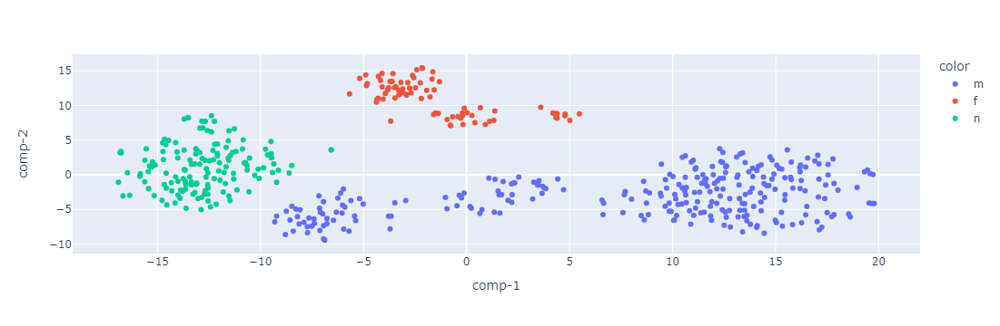

In [64]:
# General
# Singular
error_nom_sg = gen_shift_error(shift_fastText_res_nom_sg)
error_gen_sg = gen_shift_error(shift_fastText_res_gen_sg)
error_dat_sg = gen_shift_error(shift_fastText_res_dat_sg)
error_acc_sg = gen_shift_error(shift_fastText_res_acc_sg)
error_inst_sg = gen_shift_error(shift_fastText_res_inst_sg)
error_prep_sg = gen_shift_error(shift_fastText_res_prep_sg)

# Plural
error_nom_pl = gen_shift_error(shift_fastText_res_nom_pl)
error_gen_pl = gen_shift_error(shift_fastText_res_gen_pl)
error_dat_pl = gen_shift_error(shift_fastText_res_dat_pl)
error_acc_pl = gen_shift_error(shift_fastText_res_acc_pl)
error_inst_pl = gen_shift_error(shift_fastText_res_inst_pl)
error_prep_pl = gen_shift_error(shift_fastText_res_prep_pl)

# Group division
# Human
# Singular
human_error_nom_sg = gen_shift_error(human_shift_fastText_res_nom_sg)
human_error_gen_sg = gen_shift_error(human_shift_fastText_res_gen_sg)
human_error_dat_sg = gen_shift_error(human_shift_fastText_res_dat_sg)
human_error_acc_sg = gen_shift_error(human_shift_fastText_res_acc_sg)
human_error_inst_sg = gen_shift_error(human_shift_fastText_res_inst_sg)
human_error_prep_sg = gen_shift_error(human_shift_fastText_res_prep_sg)

# Plural
human_error_nom_pl = gen_shift_error(human_shift_fastText_res_nom_pl)
human_error_gen_pl = gen_shift_error(human_shift_fastText_res_gen_pl)
human_error_dat_pl = gen_shift_error(human_shift_fastText_res_dat_pl)
human_error_acc_pl = gen_shift_error(human_shift_fastText_res_acc_pl)
human_error_inst_pl = gen_shift_error(human_shift_fastText_res_inst_pl)
human_error_prep_pl = gen_shift_error(human_shift_fastText_res_prep_pl)

# Action
# Singular
action_error_nom_sg = gen_shift_error(action_shift_fastText_res_nom_sg)
action_error_gen_sg = gen_shift_error(action_shift_fastText_res_gen_sg)
action_error_dat_sg = gen_shift_error(action_shift_fastText_res_dat_sg)
action_error_acc_sg = gen_shift_error(action_shift_fastText_res_acc_sg)
action_error_inst_sg = gen_shift_error(action_shift_fastText_res_inst_sg)
action_error_prep_sg = gen_shift_error(action_shift_fastText_res_prep_sg)

# Plural
action_error_nom_pl = gen_shift_error(action_shift_fastText_res_nom_pl)
action_error_gen_pl = gen_shift_error(action_shift_fastText_res_gen_pl)
action_error_dat_pl = gen_shift_error(action_shift_fastText_res_dat_pl)
action_error_acc_pl = gen_shift_error(action_shift_fastText_res_acc_pl)
action_error_inst_pl = gen_shift_error(action_shift_fastText_res_inst_pl)
action_error_prep_pl = gen_shift_error(action_shift_fastText_res_prep_pl)

# Food
# Singular
food_error_nom_sg = gen_shift_error(food_shift_fastText_res_nom_sg)
food_error_gen_sg = gen_shift_error(food_shift_fastText_res_gen_sg)
food_error_dat_sg = gen_shift_error(food_shift_fastText_res_dat_sg)
food_error_acc_sg = gen_shift_error(food_shift_fastText_res_acc_sg)
food_error_inst_sg = gen_shift_error(food_shift_fastText_res_inst_sg)
food_error_prep_sg = gen_shift_error(food_shift_fastText_res_prep_sg)

# Plural
food_error_nom_pl = gen_shift_error(food_shift_fastText_res_nom_pl)
food_error_gen_pl = gen_shift_error(food_shift_fastText_res_gen_pl)
food_error_dat_pl = gen_shift_error(food_shift_fastText_res_dat_pl)
food_error_acc_pl = gen_shift_error(food_shift_fastText_res_acc_pl)
food_error_inst_pl = gen_shift_error(food_shift_fastText_res_inst_pl)
food_error_prep_pl = gen_shift_error(food_shift_fastText_res_prep_pl)

In [65]:
"""
    Calculating the error for group and gender
"""
# Group:human, gender:feminine
# Singular
fem_human_error_nom_sg = gen_shift_error(fem_human_diff_nom_sg)
fem_human_error_gen_sg = gen_shift_error(fem_human_diff_gen_sg)
fem_human_error_dat_sg = gen_shift_error(fem_human_diff_dat_sg)
fem_human_error_acc_sg = gen_shift_error(fem_human_diff_acc_sg)
fem_human_error_inst_sg = gen_shift_error(fem_human_diff_inst_sg)
fem_human_error_prep_sg = gen_shift_error(fem_human_diff_prep_sg)

# Plural
fem_human_error_nom_pl = gen_shift_error(fem_human_diff_nom_pl)
fem_human_error_gen_pl = gen_shift_error(fem_human_diff_gen_pl)
fem_human_error_dat_pl = gen_shift_error(fem_human_diff_dat_pl)
fem_human_error_acc_pl = gen_shift_error(fem_human_diff_acc_pl)
fem_human_error_inst_pl = gen_shift_error(fem_human_diff_inst_pl)
fem_human_error_prep_pl = gen_shift_error(fem_human_diff_prep_pl)

# Group:human, gender:masculine
# Singular
mas_human_error_nom_sg = gen_shift_error(mas_human_diff_nom_sg)
mas_human_error_gen_sg = gen_shift_error(mas_human_diff_gen_sg)
mas_human_error_dat_sg = gen_shift_error(mas_human_diff_dat_sg)
mas_human_error_acc_sg = gen_shift_error(mas_human_diff_acc_sg)
mas_human_error_inst_sg = gen_shift_error(mas_human_diff_inst_sg)
mas_human_error_prep_sg = gen_shift_error(mas_human_diff_prep_sg)

# Plural
mas_human_error_nom_pl = gen_shift_error(mas_human_diff_nom_pl)
mas_human_error_gen_pl = gen_shift_error(mas_human_diff_gen_pl)
mas_human_error_dat_pl = gen_shift_error(mas_human_diff_dat_pl)
mas_human_error_acc_pl = gen_shift_error(mas_human_diff_acc_pl)
mas_human_error_inst_pl = gen_shift_error(mas_human_diff_inst_pl)
mas_human_error_prep_pl = gen_shift_error(mas_human_diff_prep_pl)

In [66]:
"""
    Calculating the error for group and gender
"""
# Group:action, gender:feminine
# Singular
fem_action_error_nom_sg = gen_shift_error(fem_action_diff_nom_sg)
fem_action_error_gen_sg = gen_shift_error(fem_action_diff_gen_sg)
fem_action_error_dat_sg = gen_shift_error(fem_action_diff_dat_sg)
fem_action_error_acc_sg = gen_shift_error(fem_action_diff_acc_sg)
fem_action_error_inst_sg = gen_shift_error(fem_action_diff_inst_sg)
fem_action_error_prep_sg = gen_shift_error(fem_action_diff_prep_sg)

# Plural
fem_action_error_nom_pl = gen_shift_error(fem_action_diff_nom_pl)
fem_action_error_gen_pl = gen_shift_error(fem_action_diff_gen_pl)
fem_action_error_dat_pl = gen_shift_error(fem_action_diff_dat_pl)
fem_action_error_acc_pl = gen_shift_error(fem_action_diff_acc_pl)
fem_action_error_inst_pl = gen_shift_error(fem_action_diff_inst_pl)
fem_action_error_prep_pl = gen_shift_error(fem_action_diff_prep_pl)

# Group:action, gender:masculine
# Singular
mas_action_error_nom_sg = gen_shift_error(mas_action_diff_nom_sg)
mas_action_error_gen_sg = gen_shift_error(mas_action_diff_gen_sg)
mas_action_error_dat_sg = gen_shift_error(mas_action_diff_dat_sg)
mas_action_error_acc_sg = gen_shift_error(mas_action_diff_acc_sg)
mas_action_error_inst_sg = gen_shift_error(mas_action_diff_inst_sg)
mas_action_error_prep_sg = gen_shift_error(mas_action_diff_prep_sg)

# Plural
mas_action_error_nom_pl = gen_shift_error(mas_action_diff_nom_pl)
mas_action_error_gen_pl = gen_shift_error(mas_action_diff_gen_pl)
mas_action_error_dat_pl = gen_shift_error(mas_action_diff_dat_pl)
mas_action_error_acc_pl = gen_shift_error(mas_action_diff_acc_pl)
mas_action_error_inst_pl = gen_shift_error(mas_action_diff_inst_pl)
mas_action_error_prep_pl = gen_shift_error(mas_action_diff_prep_pl)

# Group:action, gender:neuter
# Singular
neut_action_error_nom_sg = gen_shift_error(neut_action_diff_nom_sg)
neut_action_error_gen_sg = gen_shift_error(neut_action_diff_gen_sg)
neut_action_error_dat_sg = gen_shift_error(neut_action_diff_dat_sg)
neut_action_error_acc_sg = gen_shift_error(neut_action_diff_acc_sg)
neut_action_error_inst_sg = gen_shift_error(neut_action_diff_inst_sg)
neut_action_error_prep_sg = gen_shift_error(neut_action_diff_prep_sg)

# Plural
neut_action_error_nom_pl = gen_shift_error(neut_action_diff_nom_pl)
neut_action_error_gen_pl = gen_shift_error(neut_action_diff_gen_pl)
neut_action_error_dat_pl = gen_shift_error(neut_action_diff_dat_pl)
neut_action_error_acc_pl = gen_shift_error(neut_action_diff_acc_pl)
neut_action_error_inst_pl = gen_shift_error(neut_action_diff_inst_pl)
neut_action_error_prep_pl = gen_shift_error(neut_action_diff_prep_pl)

In [67]:
"""
    Calculating the error for group and gender
"""
# Group:food, gender:feminine
# Singular
fem_food_error_nom_sg = gen_shift_error(fem_food_diff_nom_sg)
fem_food_error_gen_sg = gen_shift_error(fem_food_diff_gen_sg)
fem_food_error_dat_sg = gen_shift_error(fem_food_diff_dat_sg)
fem_food_error_acc_sg = gen_shift_error(fem_food_diff_acc_sg)
fem_food_error_inst_sg = gen_shift_error(fem_food_diff_inst_sg)
fem_food_error_prep_sg = gen_shift_error(fem_food_diff_prep_sg)

# Plural
fem_food_error_nom_pl = gen_shift_error(fem_food_diff_nom_pl)
fem_food_error_gen_pl = gen_shift_error(fem_food_diff_gen_pl)
fem_food_error_dat_pl = gen_shift_error(fem_food_diff_dat_pl)
fem_food_error_acc_pl = gen_shift_error(fem_food_diff_acc_pl)
fem_food_error_inst_pl = gen_shift_error(fem_food_diff_inst_pl)
fem_food_error_prep_pl = gen_shift_error(fem_food_diff_prep_pl)

# Group:food, gender:masculine
# Singular
mas_food_error_nom_sg = gen_shift_error(mas_food_diff_nom_sg)
mas_food_error_gen_sg = gen_shift_error(mas_food_diff_gen_sg)
mas_food_error_dat_sg = gen_shift_error(mas_food_diff_dat_sg)
mas_food_error_acc_sg = gen_shift_error(mas_food_diff_acc_sg)
mas_food_error_inst_sg = gen_shift_error(mas_food_diff_inst_sg)
mas_food_error_prep_sg = gen_shift_error(mas_food_diff_prep_sg)

# Plural
mas_food_error_nom_pl = gen_shift_error(mas_food_diff_nom_pl)
mas_food_error_gen_pl = gen_shift_error(mas_food_diff_gen_pl)
mas_food_error_dat_pl = gen_shift_error(mas_food_diff_dat_pl)
mas_food_error_acc_pl = gen_shift_error(mas_food_diff_acc_pl)
mas_food_error_inst_pl = gen_shift_error(mas_food_diff_inst_pl)
mas_food_error_prep_pl = gen_shift_error(mas_food_diff_prep_pl)

# Group:food, gender:neuter
# Singular
neut_food_error_nom_sg = gen_shift_error(neut_food_diff_nom_sg)
neut_food_error_gen_sg = gen_shift_error(neut_food_diff_gen_sg)
neut_food_error_dat_sg = gen_shift_error(neut_food_diff_dat_sg)
neut_food_error_acc_sg = gen_shift_error(neut_food_diff_acc_sg)
neut_food_error_inst_sg = gen_shift_error(neut_food_diff_inst_sg)
neut_food_error_prep_sg = gen_shift_error(neut_food_diff_prep_sg)

# Plural
neut_food_error_nom_pl = gen_shift_error(neut_food_diff_nom_pl)
neut_food_error_gen_pl = gen_shift_error(neut_food_diff_gen_pl)
neut_food_error_dat_pl = gen_shift_error(neut_food_diff_dat_pl)
neut_food_error_acc_pl = gen_shift_error(neut_food_diff_acc_pl)
neut_food_error_inst_pl = gen_shift_error(neut_food_diff_inst_pl)
neut_food_error_prep_pl = gen_shift_error(neut_food_diff_prep_pl)

In [68]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector

map_tsne(run_pca_tsne(shift_fastText_res_nom_sg), categories, df_big_groups, category_labels)

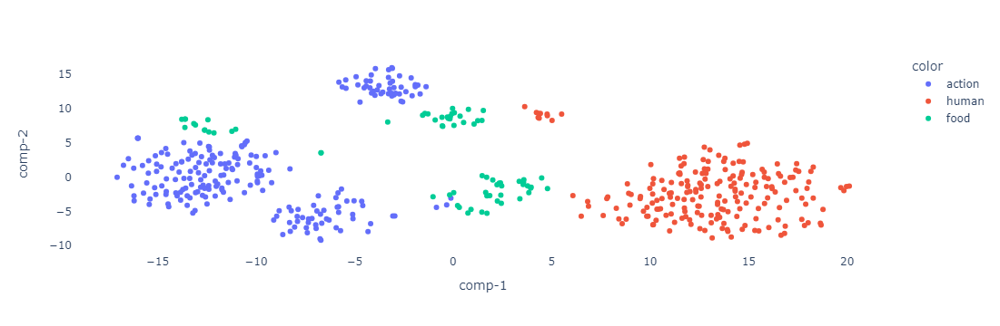

In [69]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Nominative singular
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_nom_sg), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_nom_sg), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_nom_sg), df_group_food)

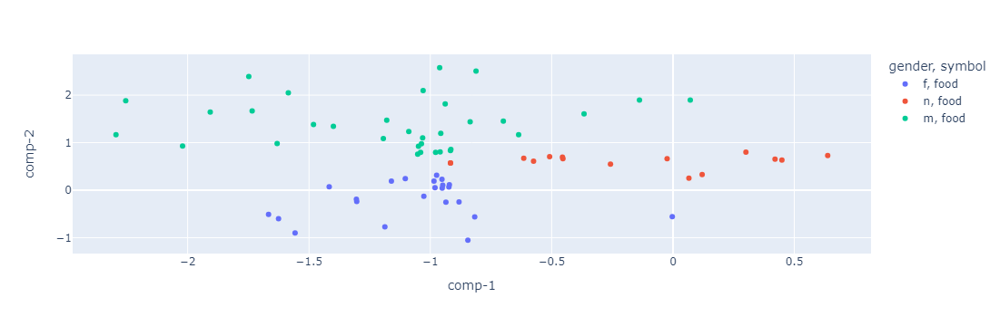

In [70]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
map_tsne(run_pca_tsne(shift_fastText_res_gen_sg), categories, df_big_groups, category_labels)

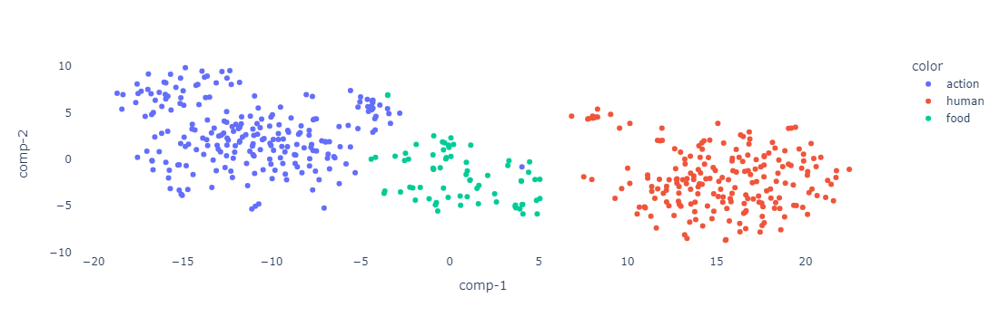

In [71]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Genitive singular
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_gen_sg), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_gen_sg), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_gen_sg), df_group_food)

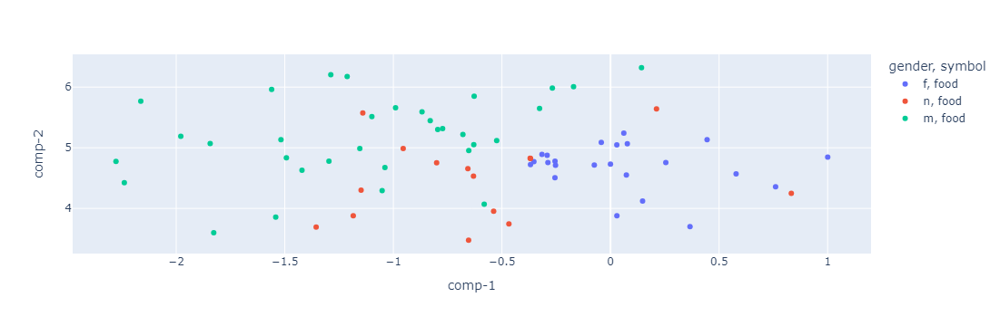

In [72]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Dative singular
map_tsne(run_pca_tsne(shift_fastText_res_dat_sg), categories, df_big_groups, category_labels)

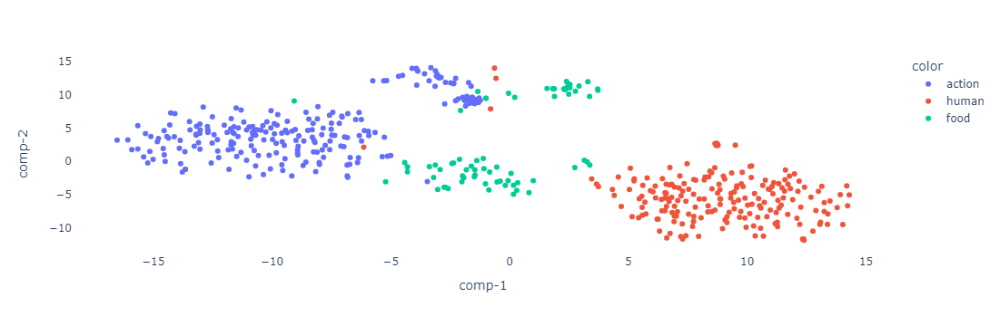

In [73]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Dative singular
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_dat_sg), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_dat_sg), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_dat_sg), df_group_food)

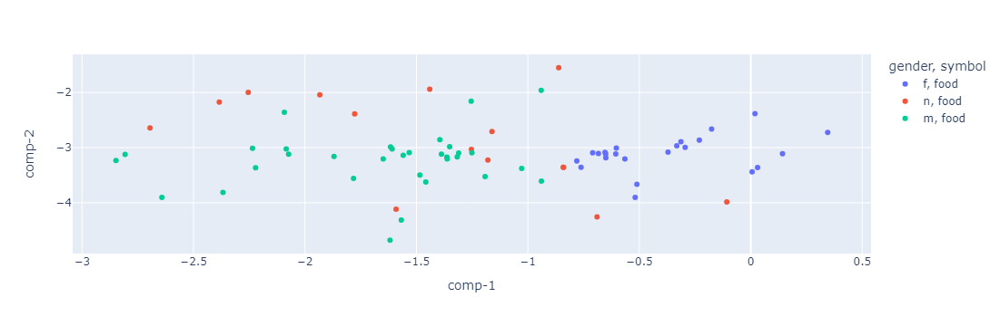

In [74]:
# # Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Accusative singular
map_tsne(run_pca_tsne(shift_fastText_res_acc_sg), categories, df_big_groups, category_labels)

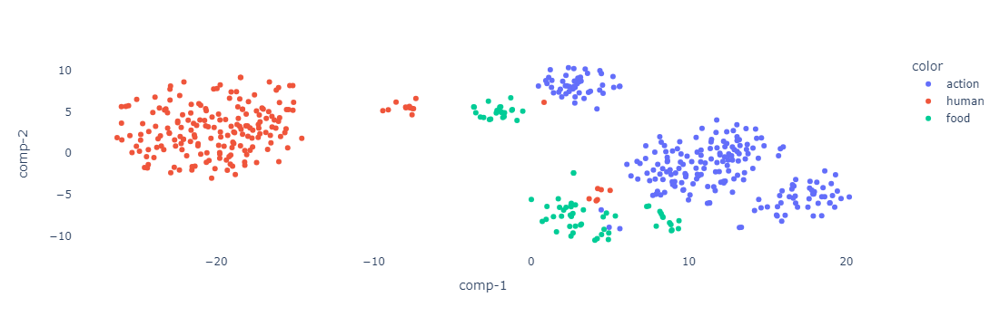

In [75]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Accusative singular
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_acc_sg), df_group_human)
map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_acc_sg), df_group_action)
# map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_acc_sg), df_group_food)

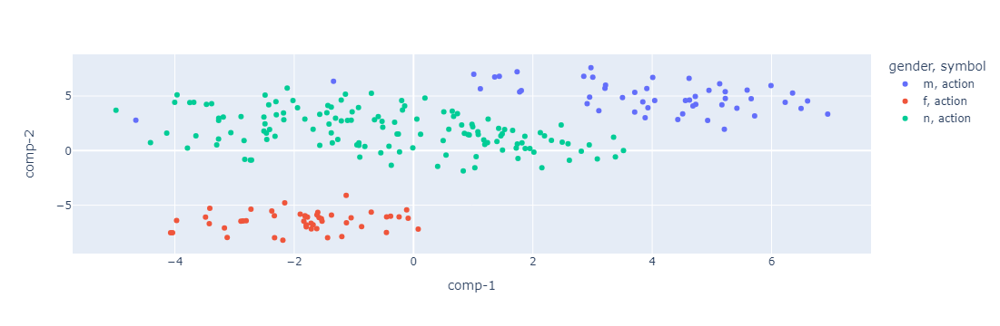

In [76]:
# # Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Instrumental singular
map_tsne(run_pca_tsne(shift_fastText_res_inst_sg), categories, df_big_groups, category_labels)

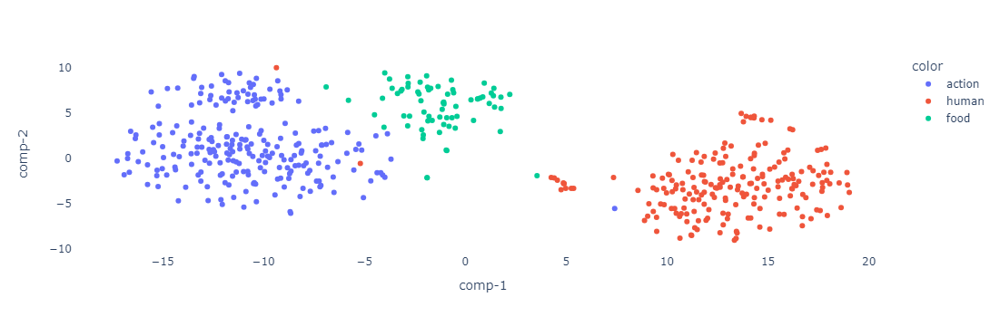

In [77]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Instrumental singular
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_inst_sg), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_inst_sg), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_inst_sg), df_group_food)

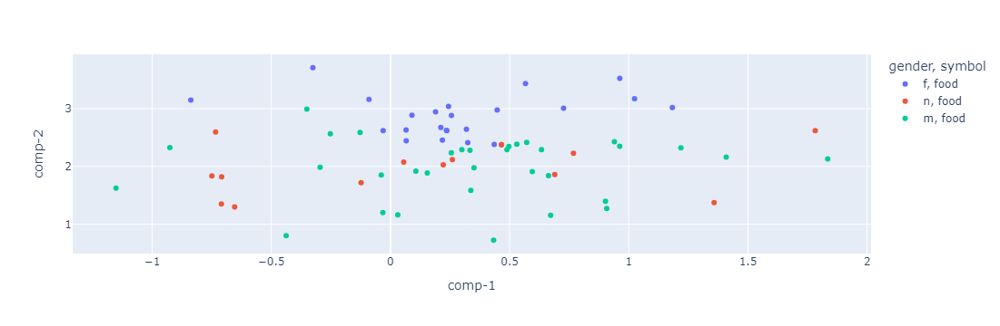

In [78]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Prepositional singular
map_tsne(run_pca_tsne(shift_fastText_res_prep_sg), categories, df_big_groups, category_labels)

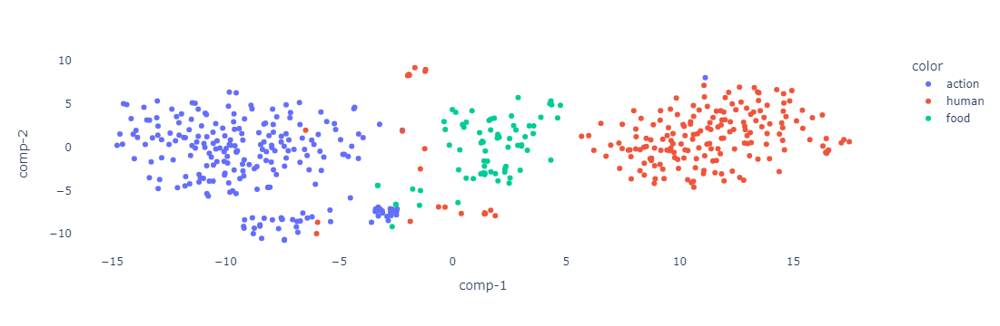

In [79]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Prepositional singular
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_prep_sg), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_prep_sg), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_prep_sg), df_group_food)

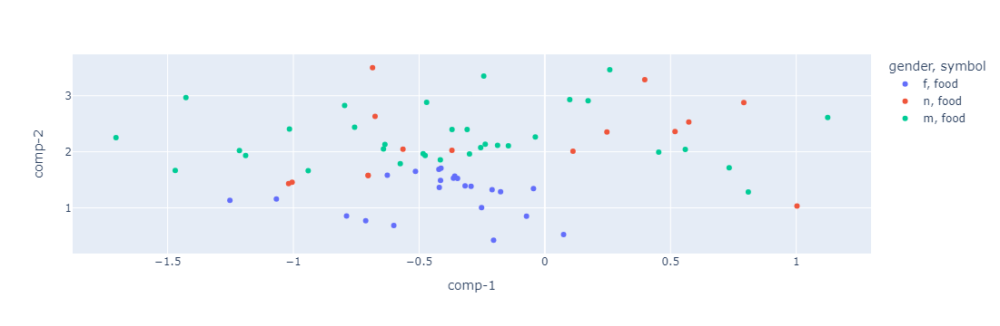

In [80]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Nominative plural
map_tsne(run_pca_tsne(shift_fastText_res_nom_pl), categories, df_big_groups, category_labels)

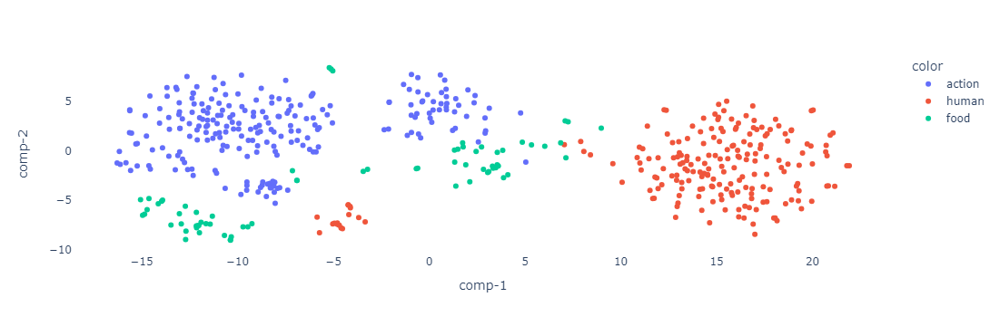

In [81]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Nominative plural, color:gender
map_tsne_color_gen(run_pca_tsne(shift_fastText_res_nom_pl), df_big_groups, categories, category_labels)

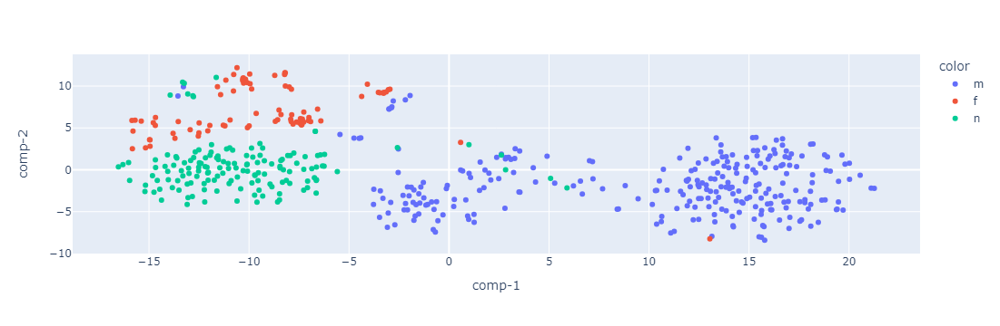

In [82]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Nominative plural
map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_nom_pl), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_nom_pl), df_group_action)
# map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_nom_pl), df_group_food)

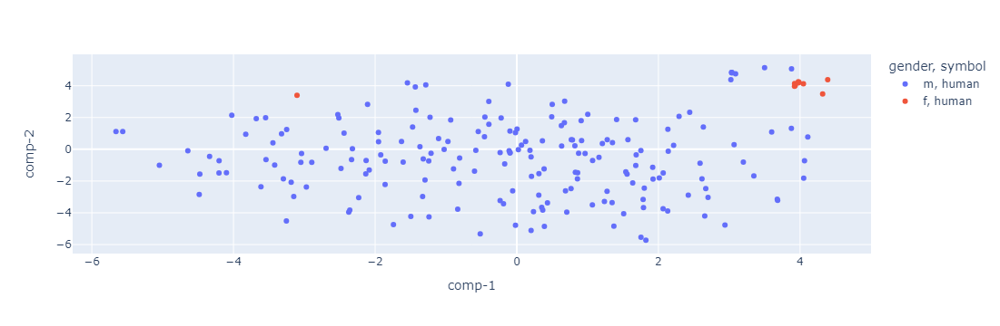

In [83]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Genetive plural
map_tsne(run_pca_tsne(shift_fastText_res_gen_pl), categories, df_big_groups, category_labels)

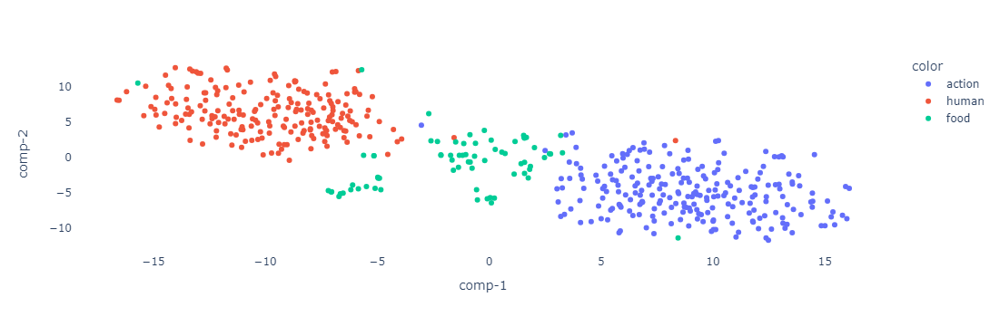

In [84]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Genetive plural
# map_tsne_one_group(run_pca_tsne(human_shift_fastText_res_gen_pl), df_group_human)
# map_tsne_one_group(run_pca_tsne(action_shift_fastText_res_gen_pl), df_group_action)
# map_tsne_one_group(run_pca_tsne(food_shift_fastText_res_gen_pl), df_group_food)

# Points are colored according to their gender
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_gen_pl), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_gen_pl), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_gen_pl), df_group_food)

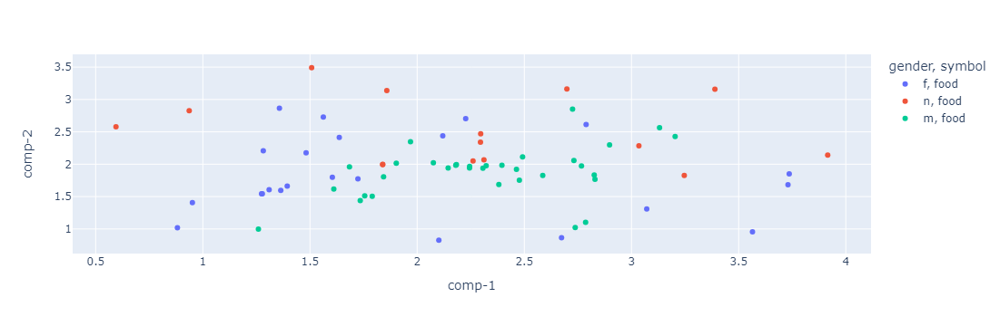

In [85]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Dative plural
map_tsne(run_pca_tsne(shift_fastText_res_dat_pl), categories, df_big_groups, category_labels)

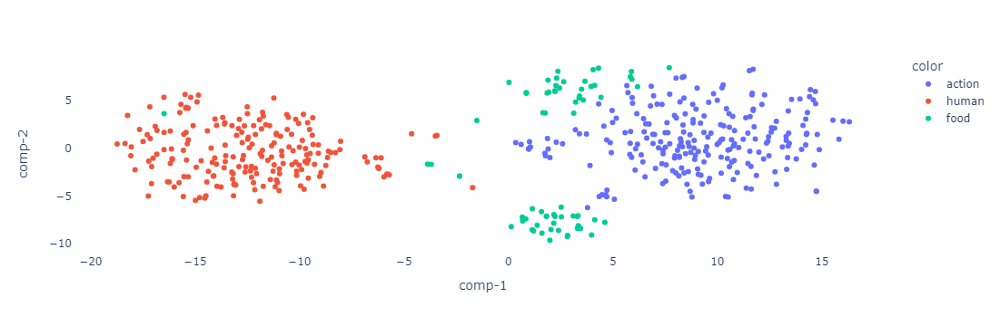

In [86]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Dative plural
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_dat_pl), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_dat_pl), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_dat_pl), df_group_food)

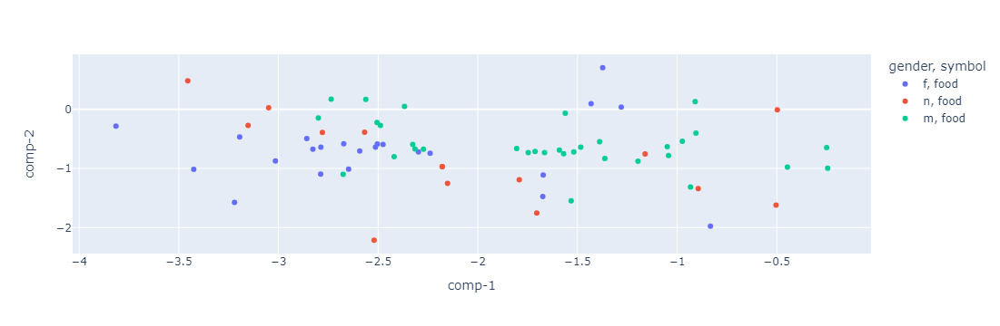

In [87]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Accusative plural
map_tsne(run_pca_tsne(shift_fastText_res_acc_pl), categories, df_big_groups, category_labels)

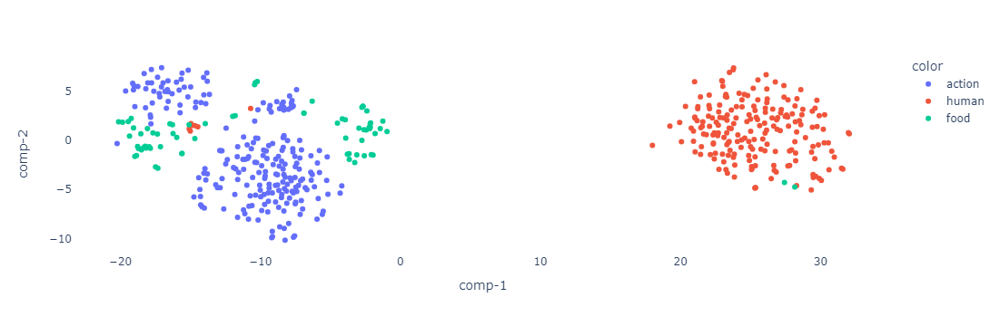

In [88]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Accusative plural
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_acc_pl), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_acc_pl), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_acc_pl), df_group_food)

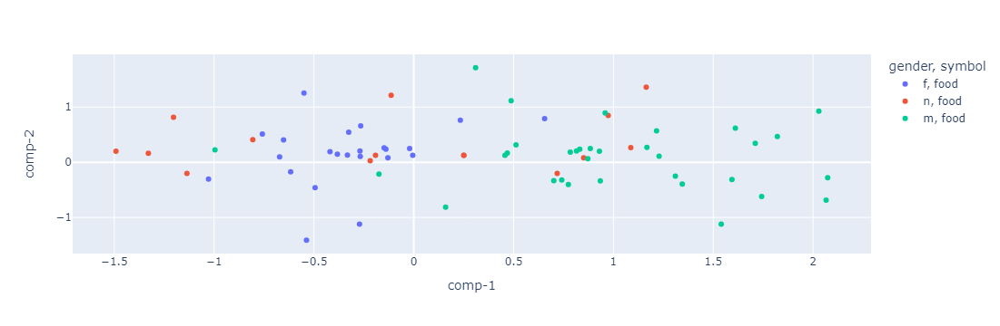

In [89]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Instrumental plural
map_tsne(run_pca_tsne(shift_fastText_res_inst_pl), categories, df_big_groups, category_labels)

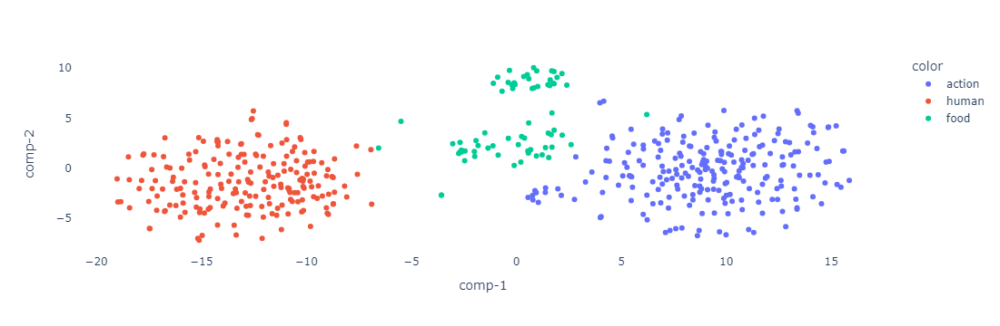

In [90]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Instrumental plural
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_inst_pl), df_group_human)
map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_inst_pl), df_group_action)
# map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_inst_pl), df_group_food)

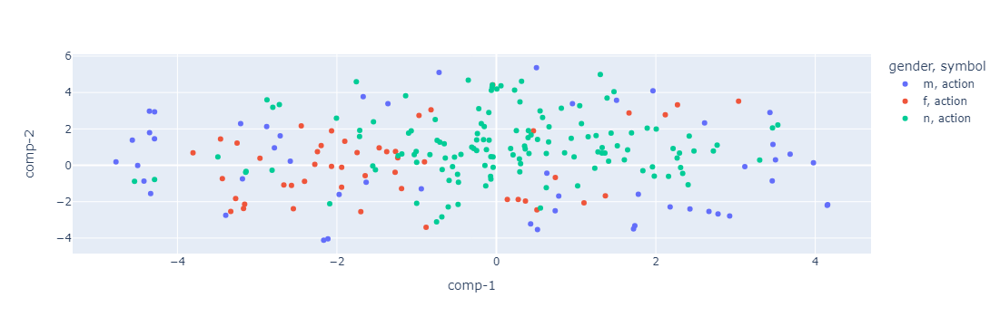

In [91]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector
# Prepositional plural
map_tsne(run_pca_tsne(shift_fastText_res_prep_pl), categories, df_big_groups, category_labels)

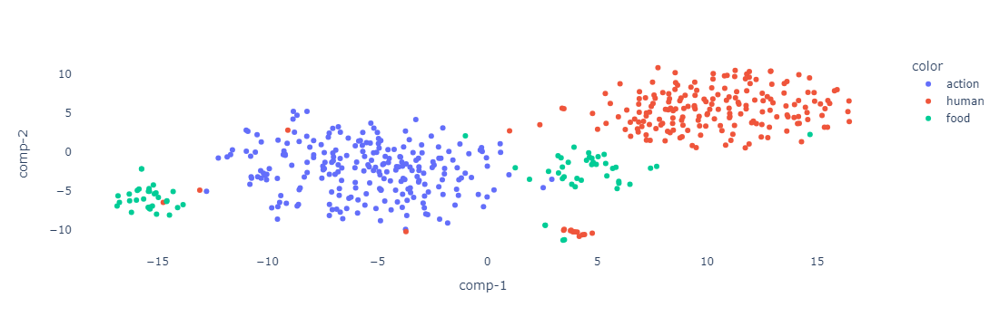

In [92]:
# Visualization of the shift vector between get_word_vector() and the addition of the base form and the average case_number vector for each group
# Prepositional plural
# map_tsne_one_group_gen(run_pca_tsne(human_shift_fastText_res_prep_pl), df_group_human)
# map_tsne_one_group_gen(run_pca_tsne(action_shift_fastText_res_prep_pl), df_group_action)
map_tsne_one_group_gen(run_pca_tsne(food_shift_fastText_res_prep_pl), df_group_food)

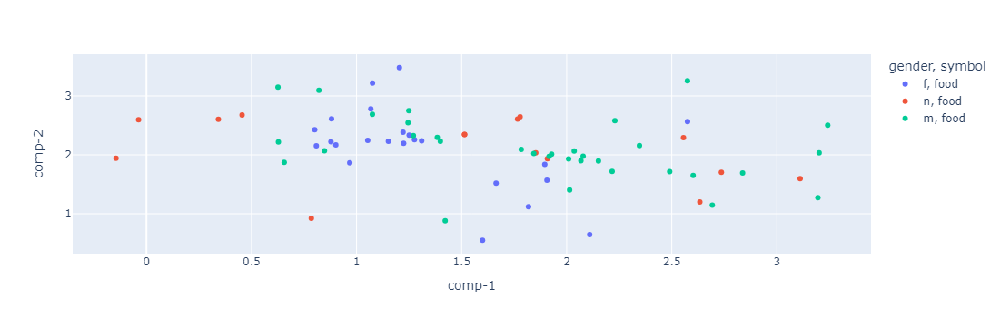

In [93]:
# Visialization of the shift vector for gender clusters
# In general
# Case-gender
# Nominative singular
map_tsne_one_group(run_pca_tsne(diff_nom_sg_human_mas), df_group_human_mas)

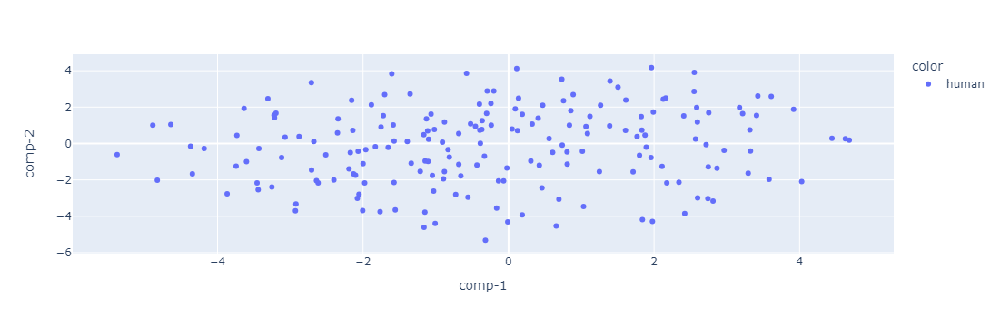

In [94]:
# Visialization of the shift vector for gender clusters
# In general
# Case-gender
# Nominative singular
map_tsne_one_group(run_pca_tsne(diff_nom_sg_mas), df_masculine)

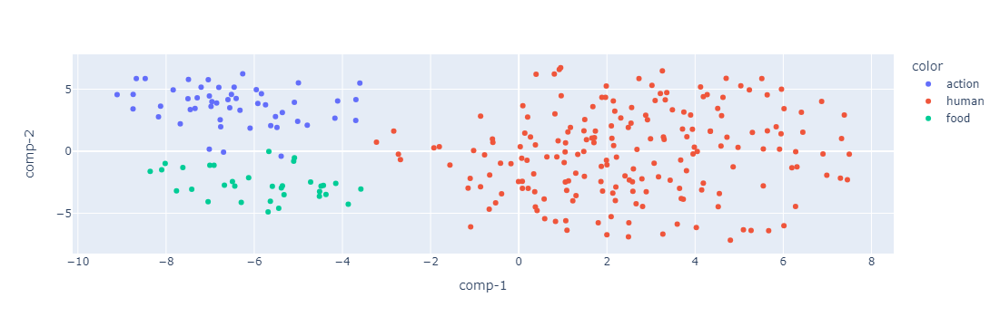

In [95]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Nominative singular, symbol:gender
map_tsne_gen(run_pca_tsne(diff_nom_sg), df_big_groups, categories, category_labels)

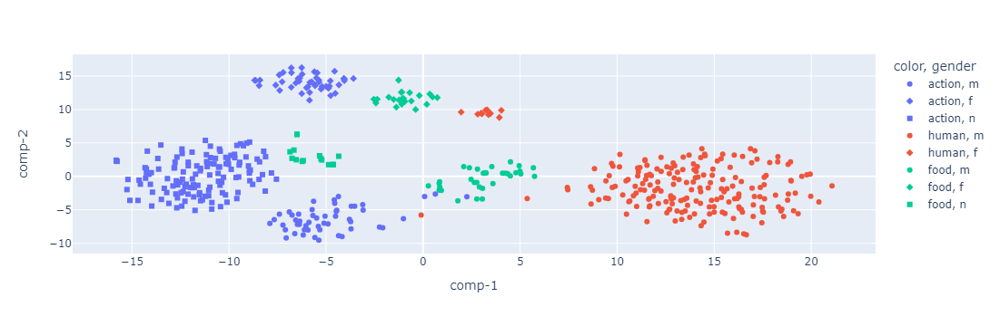

In [96]:
# CASE X - MEAN VECTOR
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Nominative singular
map_tsne_one_group(run_pca_tsne(diff_gen_sg), df_big_groups)

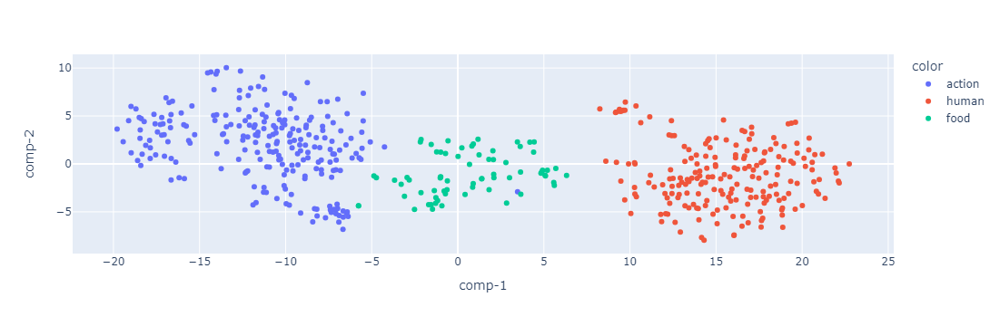

In [97]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Nominative singular, color:gender
map_tsne_color_gen(run_pca_tsne(diff_nom_sg), df_big_groups, categories, category_labels)

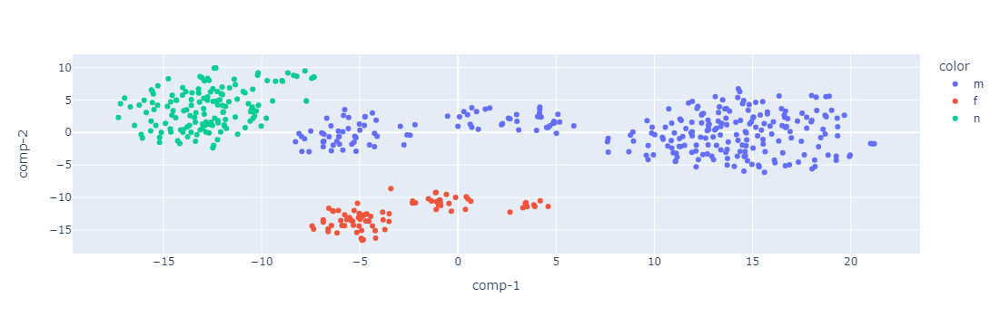

In [98]:
# Visualization of the shift vector (the subtraction of the base form and the case form) for gen_sg with the gender division
# Symbol:gender, color:group
map_tsne_gen(run_pca_tsne(diff_gen_sg), df_big_groups, categories, category_labels)

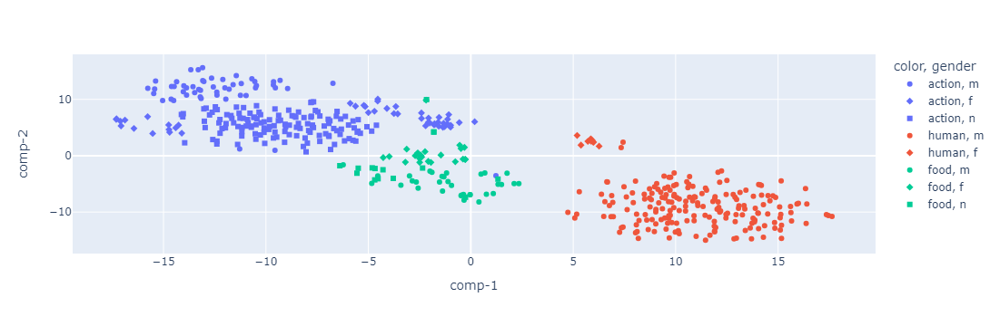

In [99]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Genitive singular
map_tsne(run_pca_tsne(diff_gen_sg), categories, df_big_groups, category_labels)

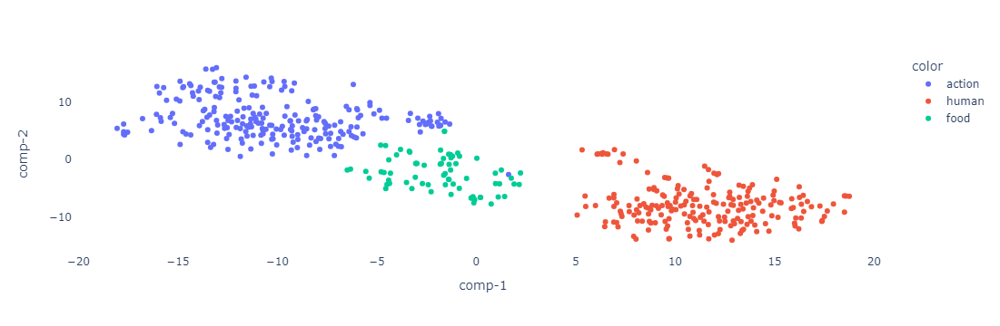

In [100]:
# Visualization of the shift vector (the subtraction of the base form and the case form) for gen_sg with the gender division, no group division
# Color:gender
map_tsne_color_gen(run_pca_tsne(diff_gen_sg), df_big_groups, categories, category_labels)

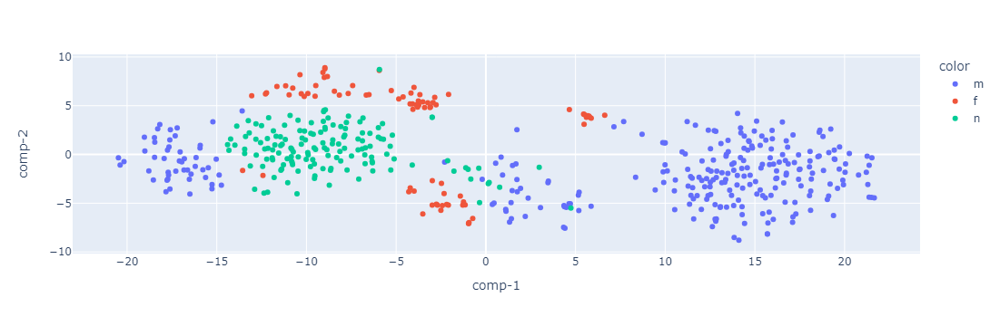

In [101]:
# CASE X - NOM_SG
# Visualization of the shift vector(the subtraction of the nominative singular from the case form)
diff_gen_sg_nom = diff_cal(df_big_groups['gen_sg'], [ft.get_word_vector(x) for x in df_big_groups['nom_sg']], ft)
map_tsne(run_pca_tsne(diff_gen_sg_nom), categories, df_big_groups, category_labels)

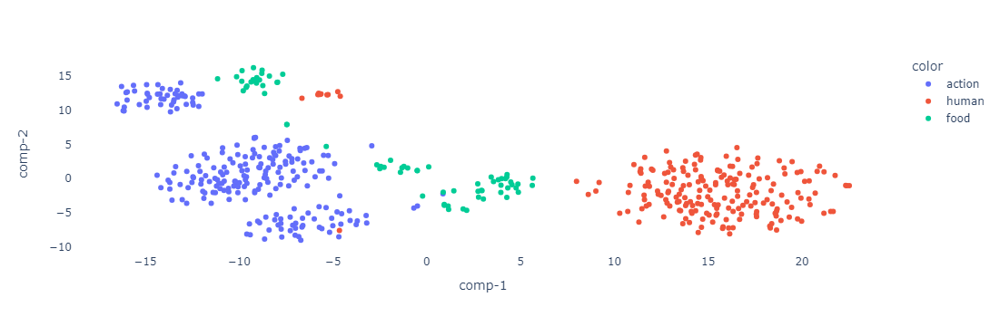

In [102]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Genitive singular
map_tsne(run_pca_tsne(diff_gen_sg), categories, df_big_groups, category_labels)

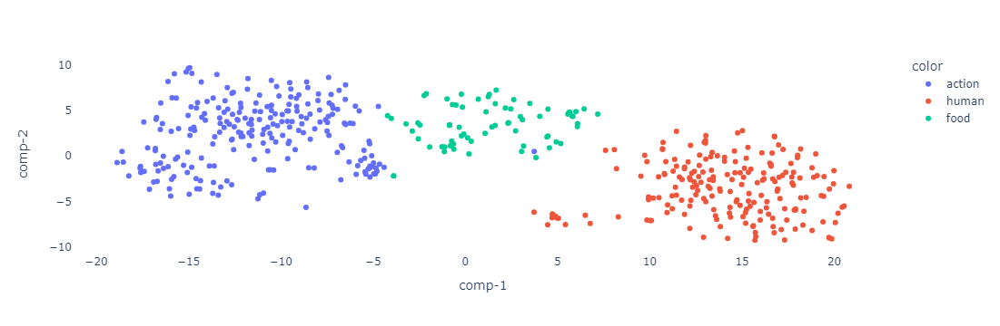

In [103]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Accusative singular
map_tsne(run_pca_tsne(diff_acc_sg), categories, df_big_groups, category_labels)

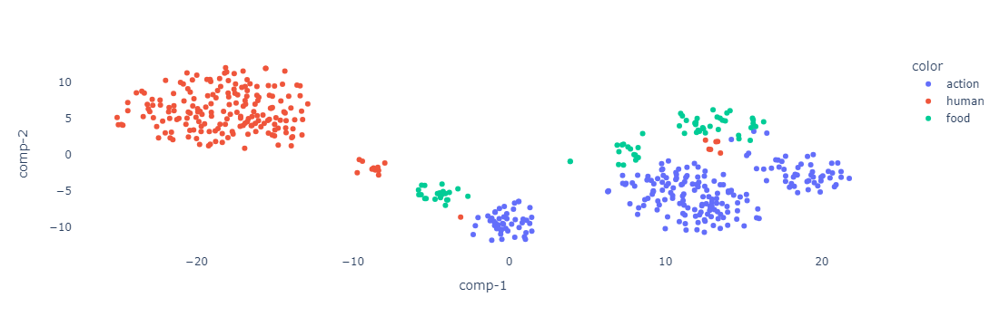

In [104]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Dative singular
map_tsne(run_pca_tsne(diff_dat_sg), categories, df_big_groups, category_labels)

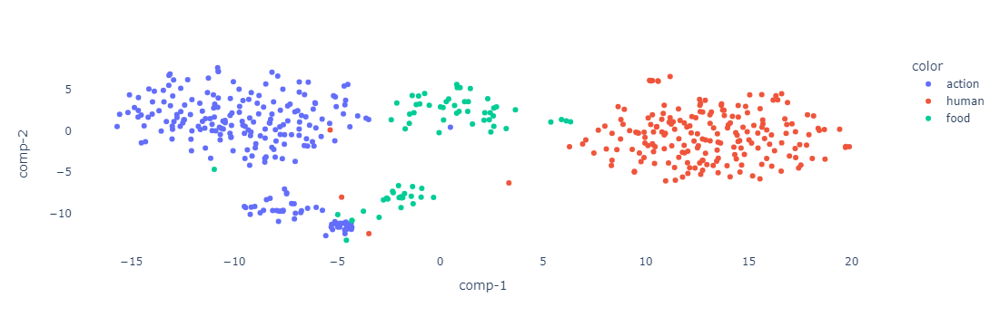

In [105]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Instrumental singular
map_tsne(run_pca_tsne(diff_inst_sg), categories, df_big_groups, category_labels)

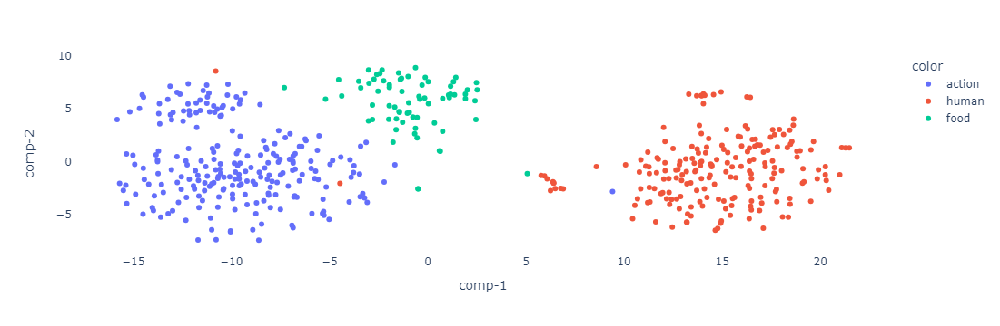

In [106]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Instrumental singular, gender division
map_tsne_gen(run_pca_tsne(diff_inst_sg), df_big_groups, categories, category_labels)

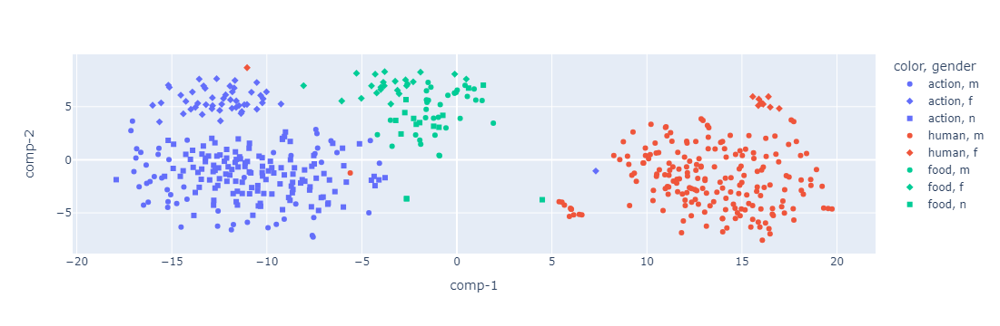

In [107]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Prepositional singular
map_tsne(run_pca_tsne(diff_prep_sg), categories, df_big_groups, category_labels)

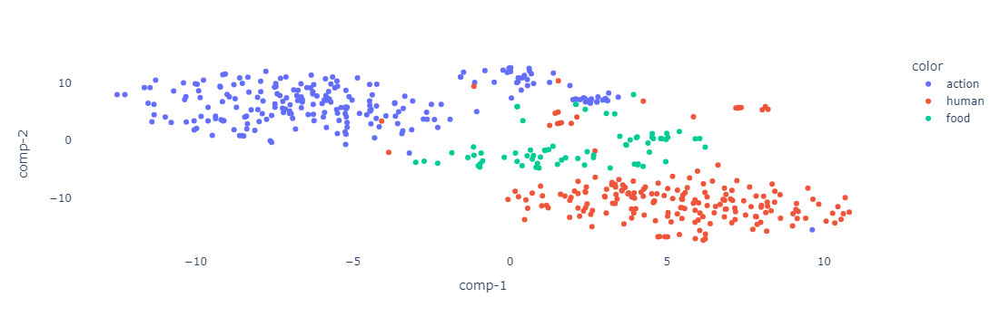

In [108]:
# Visualization of the shift vector (the subtraction of the base form and the case form) for nom_pl
# Nominative plural, gender division
map_tsne_gen(run_pca_tsne(diff_nom_sg), df_big_groups, categories, category_labels)

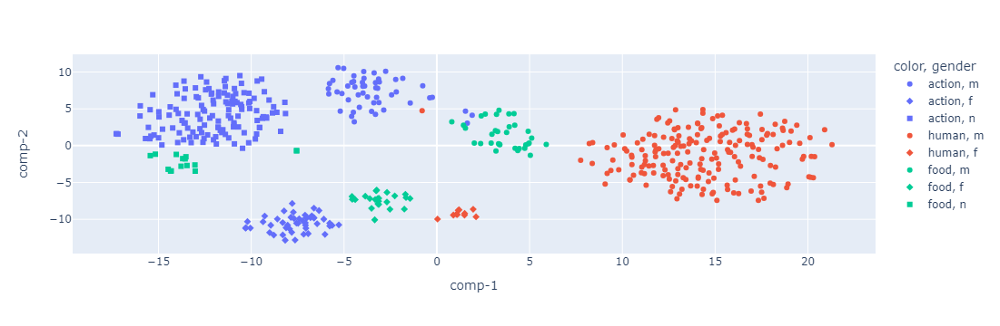

In [109]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Genitive plural
map_tsne(run_pca_tsne(diff_gen_pl), categories, df_big_groups, category_labels)

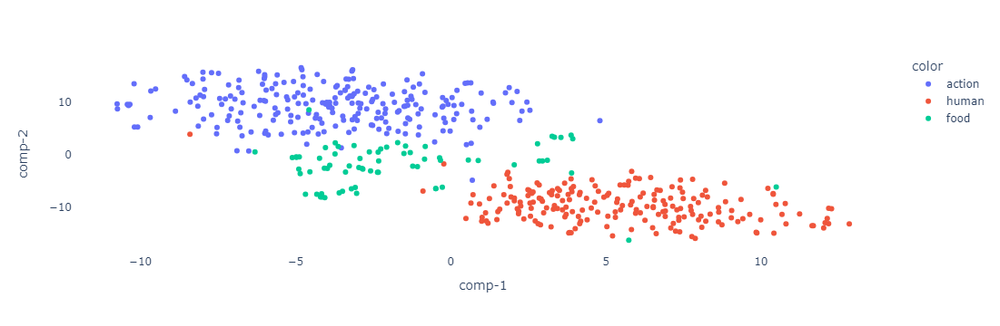

In [110]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Accusative plural
map_tsne(run_pca_tsne(diff_acc_pl), categories, df_big_groups, category_labels)

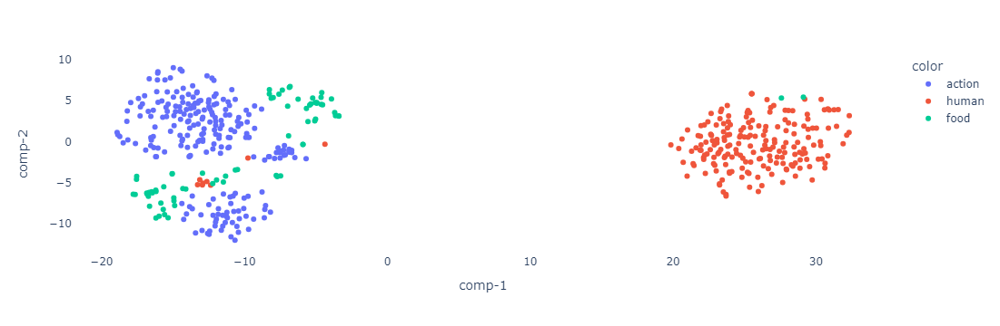

In [111]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Accusative plural with perplexity = 50
map_tsne(run_pca_tsne_perp(diff_acc_pl), categories, df_big_groups, category_labels)

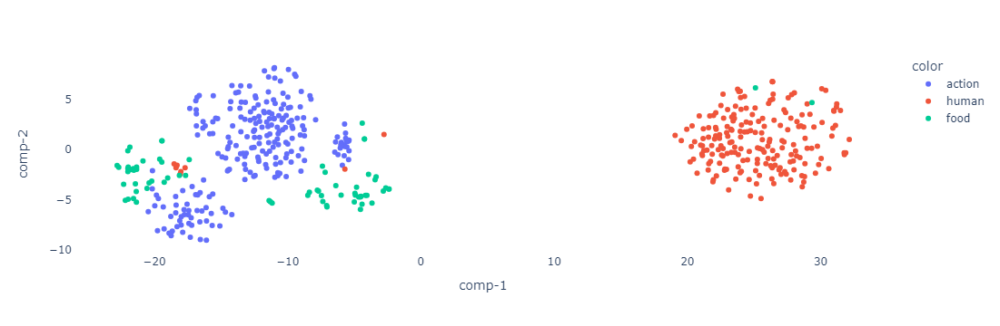

In [112]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Dative plural
map_tsne(run_pca_tsne(diff_dat_pl), categories, df_big_groups, category_labels)

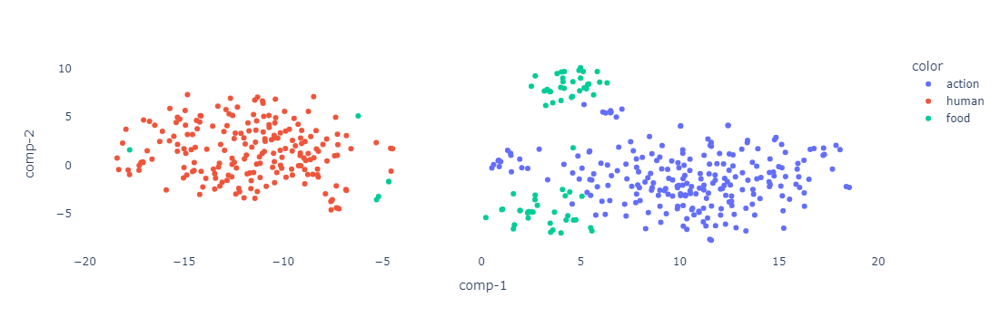

In [113]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Dative plural with perplexity = 50
map_tsne(run_pca_tsne_perp(diff_dat_pl), categories, df_big_groups, category_labels)

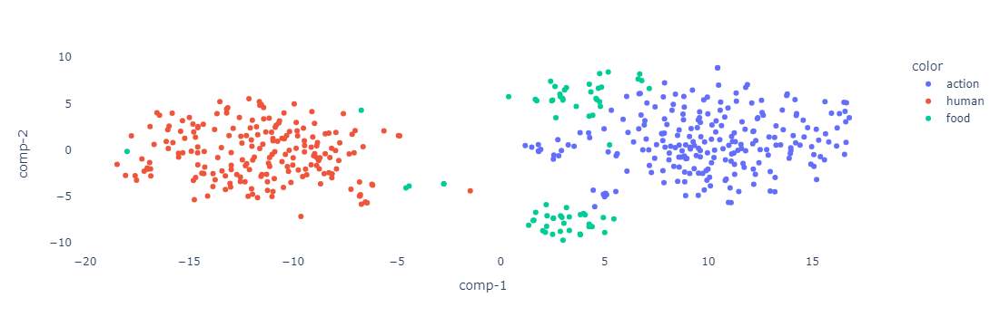

In [114]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Instrumental plural
map_tsne(run_pca_tsne(diff_inst_pl), categories, df_big_groups, category_labels)

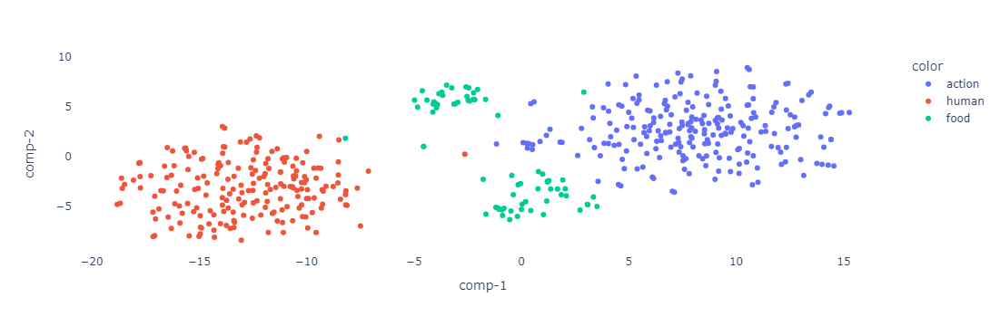

In [115]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Instrumental plural with perplexity = 50
map_tsne(run_pca_tsne_perp(diff_inst_pl), categories, df_big_groups, category_labels)

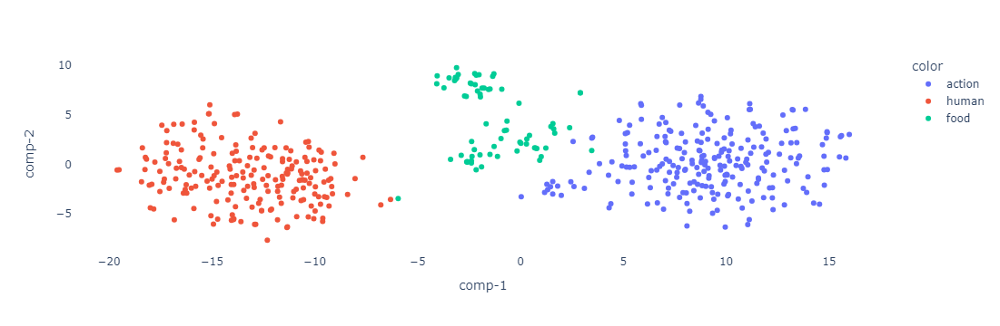

In [116]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Prepositional plural
map_tsne(run_pca_tsne(diff_prep_pl), categories, df_big_groups, category_labels)

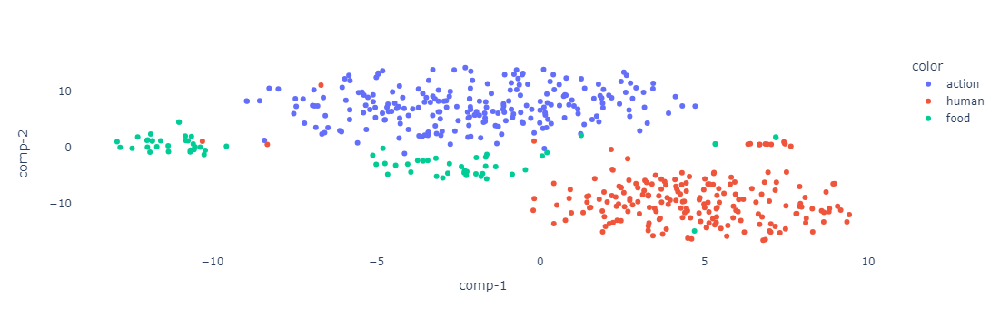

In [117]:
# Visualization of the shift vector (the subtraction of the base form and the case form)
# Prepositional plural with perplexity = 50
map_tsne(run_pca_tsne_perp(diff_prep_pl), categories, df_big_groups, category_labels)

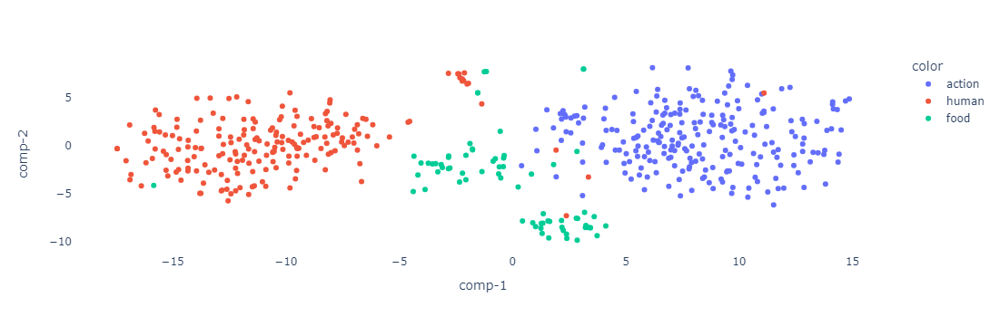

In [118]:
# Plotting all cases together